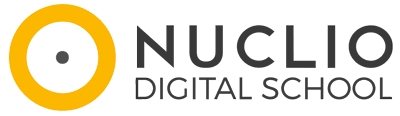


## **Proyecto Health Analytics para el estudio de la salud pública**

**DESCRIPCIÓN DEL PROYECTO**


Análisis en países desarrollados y subdesarrollados de la relación entre la esperanza de vida, las principales causas de muerte, el gasto en salud, el PIB per cápita, tasas de vacunación, niveles de pobreza, y las tasas de homicidios y suicidios en diferentes países. Este proyecto busca entender cómo los factores socioeconómicos y de salud pública influyen en la calidad y expectativa de vida a nivel global. Además, los resultados del análisis se complementarán con la implementación de un modelo simple que ayude a entender los factores de vida que impactan en la esperanza de vida de un país,  y diseñar un dashboard para la WHO con los principales resultados del análisis. 

### 1) Funciones

#### Funcion exploración inicial

In [413]:
def exploracion_inicial(df, tipo=None):
    print("¿Cuántas filas y columnas hay en el conjunto de datos?")
    num_filas, num_columnas = df.shape
    print(f"\tHay {num_filas:,} filas y {num_columnas:,} columnas.")
    print('#' * 90)

    if tipo == 'simple':
        print("¿Cuáles son las primeras dos filas del conjunto de datos?")
        display(df.head(2))
    else:
        print("¿Cuáles son las primeras cinco filas del conjunto de datos?")
        display(df.head())

        print("¿Cuáles son las últimas cinco filas del conjunto de datos?")
        display(df.tail())

        print("¿Cómo puedes obtener una muestra aleatoria de filas del conjunto de datos?")
        display(df.sample(n=5))

        print("¿Cuáles son las columnas del conjunto de datos?")
        print("\n".join(f"\t- {col}" for col in df.columns))

        print("¿Cuál es el tipo de datos de cada columna?")
        print(df.dtypes)

        print("¿Cuántas columnas hay de cada tipo de datos?")
        print(df.dtypes.value_counts())

        print("¿Cómo podríamos obtener información más completa sobre la estructura y el contenido del DataFrame?")
        df.info()

        print("¿Cuántos valores únicos tiene cada columna?")
        print(df.nunique())

        print("¿Cuáles son las estadísticas descriptivas básicas de todas las columnas?")
        display(df.describe(include='all').fillna(''))

        print("¿Hay valores nulos en el conjunto de datos?")
        print(df.isnull().sum())

        print("¿Cuál es la proporción de valores nulos en cada columna?")
        print((df.isnull().sum() / len(df) * 100).round(2))

    print('#' * 90)

#### Funcion outliers

In [414]:
def deteccion_outliers(df, variable):
    columna = df[variable]

    sns.boxplot(
      data=df,
      y=variable,
    )
    plt.show()

    Q1 = columna.quantile(0.25)
    Q3 = columna.quantile(0.75)
    IQR = Q3 - Q1

    print('Valor del segundo cuartil (25%): {:.2f}'.format(Q1))
    print('Valor del tercer cuartil (75%): {:.2f}'.format(Q3))
    print('Valor del rango intercuartil (IQR): {:.2f}'.format(IQR))

    limite_inferior = Q1 - 1.5 * IQR
    limite_superior = Q3 + 1.5 * IQR

    print(f"Los valores atípicos se definen como aquellos que caen fuera del siguiente rango:")
    print(f"\t - Límite inferior (considerado extremadamente bajo): {limite_inferior:.2f}")
    print(f"\t - Límite superior (considerado extremadamente alto): {limite_superior:.2f}")

    outilers = list(columna[((columna < limite_inferior) | (columna > limite_superior))].index)
    num_outliers = len(outilers)
    print(f"Hay {num_outliers} outliers en la variable '{variable}'")
    
    return outilers

#### Graficar correlaciones

In [418]:
def graficar_correlacion(df, variable_x, variable_y):
    # Crear el gráfico de dispersión usando Plotly Express para visualizar la correlación
    fig = px.scatter(df, x=variable_x, y=variable_y,
                     trendline='ols',  # Añade una línea de regresión
                     labels={variable_x: variable_x, variable_y: variable_y},
                     title=f'Correlación entre {variable_x} y {variable_y}')

    # Actualizar el fondo del gráfico a blanco y ajustar la cuadrícula
    fig.update_layout({
        'plot_bgcolor': 'rgba(255, 255, 255, 1)',
        'xaxis': {'showgrid': True, 'gridcolor': 'lightgrey'},
        'yaxis': {'showgrid': True, 'gridcolor': 'lightgrey'}
    })

    # Mostrar el gráfico
    fig.show()

### 2) Import libraries

In [573]:
# Manipulación y análisis de datos
import pandas as pd
import numpy as np

# Visualización de datos
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns


import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

from sklearn.linear_model import LinearRegression
from scipy.stats import f_oneway
from scipy.stats import spearmanr, pearsonr

### 3) Paths & directories

In [423]:
annual_number_of_deaths_by_cause_path = r'C:\Users\User\Desktop\Master Data Analitics\TFM\data\annual_number_of_deaths_by_cause.csv'
death_rate_from_suicides_gho_path = r'C:\Users\User\Desktop\Master Data Analitics\TFM\data\death_rate_from_suicides_gho.csv'
gdp_per_capita_penn_world_table_path = r'C:\Users\User\Desktop\Master Data Analitics\TFM\data\gdp_per_capita_penn_world_table.csv'
global_vaccination_coverage_path = r'C:\Users\User\Desktop\Master Data Analitics\TFM\data\global_vaccination_coverage.csv'
homicide_rate_unodc_path = r'C:\Users\User\Desktop\Master Data Analitics\TFM\data\homicide_rate_unodc.csv'
life_expectancy_path = r'C:\Users\User\Desktop\Master Data Analitics\TFM\data\life_expectancy.csv'
poverty_explorer_path = r'C:\Users\User\Desktop\Master Data Analitics\TFM\data\poverty_explorer.csv'
public_healthcare_spending_share_gdp_path = r'C:\Users\User\Desktop\Master Data Analitics\TFM\data\public_healthcare_spending_share_gdp.csv'

### 4) Data Exploration

In [424]:
# Dataset for deaths
print("Dataset for deaths ")
df_deaths = pd.read_csv(annual_number_of_deaths_by_cause_path)
print(f'Shape of the dataset for deaths: {df_deaths.shape}')

print(f'\nNumber of countries in the data: {df_deaths["Code"].nunique()}')
print(f'Number of years available in the data: {df_deaths["Year"].nunique()}')

display(df_deaths.head())
exploracion_inicial(df_deaths)


Dataset for deaths 
Shape of the dataset for deaths: (6840, 34)

Number of countries in the data: 205
Number of years available in the data: 30


,Entity,Code,Year,Deaths - Meningitis - Sex: Both - Age: All Ages (Number),Deaths - Alzheimer's disease and other dementias - Sex: Both - Age: All Ages (Number),Deaths - Parkinson's disease - Sex: Both - Age: All Ages (Number),Deaths - Nutritional deficiencies - Sex: Both - Age: All Ages (Number),Deaths - Malaria - Sex: Both - Age: All Ages (Number),Deaths - Drowning - Sex: Both - Age: All Ages (Number),Deaths - Interpersonal violence - Sex: Both - Age: All Ages (Number),Deaths - Maternal disorders - Sex: Both - Age: All Ages (Number),Deaths - HIV/AIDS - Sex: Both - Age: All Ages (Number),Deaths - Drug use disorders - Sex: Both - Age: All Ages (Number),Deaths - Tuberculosis - Sex: Both - Age: All Ages (Number),Deaths - Cardiovascular diseases - Sex: Both - Age: All Ages (Number),Deaths - Lower respiratory infections - Sex: Both - Age: All Ages (Number),Deaths - Neonatal disorders - Sex: Both - Age: All Ages (Number),Deaths - Alcohol use disorders - Sex: Both - Age: All Ages (Number),Deaths - Self-harm - Sex: Both - Age: All Ages (Number),Deaths - Exposure to forces of nature - Sex: Both - Age: All Ages (Number),Deaths - Diarrheal diseases - Sex: Both - Age: All Ages (Number),Deaths - Environmental heat and cold exposure - Sex: Both - Age: All Ages (Number),Deaths - Neoplasms - Sex: Both - Age: All Ages (Number),Deaths - Conflict and terrorism - Sex: Both - Age: All Ages (Number),Deaths - Diabetes mellitus - Sex: Both - Age: All Ages (Number),Deaths - Chronic kidney disease - Sex: Both - Age: All Ages (Number),Deaths - Poisonings - Sex: Both - Age: All Ages (Number),Deaths - Protein-energy malnutrition - Sex: Both - Age: All Ages (Number),Deaths - Road injuries - Sex: Both - Age: All Ages (Number),Deaths - Chronic respiratory diseases - Sex: Both - Age: All Ages (Number),Deaths - Cirrhosis and other chronic liver diseases - Sex: Both - Age: All Ages (Number),Deaths - Digestive diseases - Sex: Both - Age: All Ages (Number),"Deaths - Fire, heat, and hot substances - Sex: Both - Age: All Ages (Number)",Deaths - Acute hepatitis - Sex: Both - Age: All Ages (Number)
0,Afghanistan,AFG,1990,2159,1116,371,2087,93,1370,1538,2655,34,93,4661,44899,23741,15612,72,696,0,4235,175,11580,1490,2108,3709,338,2054,4154,5945,2673,5005,323,2985
1,Afghanistan,AFG,1991,2218,1136,374,2153,189,1391,2001,2885,41,102,4743,45492,24504,17128,75,751,1347,4927,113,11796,3370,2120,3724,351,2119,4472,6050,2728,5120,332,3092
2,Afghanistan,AFG,1992,2475,1162,378,2441,239,1514,2299,3315,48,118,4976,46557,27404,20060,80,855,614,6123,38,12218,4344,2153,3776,386,2404,5106,6223,2830,5335,360,3325
3,Afghanistan,AFG,1993,2812,1187,384,2837,108,1687,2589,3671,56,132,5254,47951,31116,22335,85,943,225,8174,41,12634,4096,2195,3862,425,2797,5681,6445,2943,5568,396,3601
4,Afghanistan,AFG,1994,3027,1211,391,3081,211,1809,2849,3863,63,142,5470,49308,33390,23288,88,993,160,8215,44,12914,8959,2231,3932,451,3038,6001,6664,3027,5739,420,3816


¿Cuántas filas y columnas hay en el conjunto de datos?
	Hay 6,840 filas y 34 columnas.
##########################################################################################
¿Cuáles son las primeras cinco filas del conjunto de datos?


,Entity,Code,Year,Deaths - Meningitis - Sex: Both - Age: All Ages (Number),Deaths - Alzheimer's disease and other dementias - Sex: Both - Age: All Ages (Number),Deaths - Parkinson's disease - Sex: Both - Age: All Ages (Number),Deaths - Nutritional deficiencies - Sex: Both - Age: All Ages (Number),Deaths - Malaria - Sex: Both - Age: All Ages (Number),Deaths - Drowning - Sex: Both - Age: All Ages (Number),Deaths - Interpersonal violence - Sex: Both - Age: All Ages (Number),Deaths - Maternal disorders - Sex: Both - Age: All Ages (Number),Deaths - HIV/AIDS - Sex: Both - Age: All Ages (Number),Deaths - Drug use disorders - Sex: Both - Age: All Ages (Number),Deaths - Tuberculosis - Sex: Both - Age: All Ages (Number),Deaths - Cardiovascular diseases - Sex: Both - Age: All Ages (Number),Deaths - Lower respiratory infections - Sex: Both - Age: All Ages (Number),Deaths - Neonatal disorders - Sex: Both - Age: All Ages (Number),Deaths - Alcohol use disorders - Sex: Both - Age: All Ages (Number),Deaths - Self-harm - Sex: Both - Age: All Ages (Number),Deaths - Exposure to forces of nature - Sex: Both - Age: All Ages (Number),Deaths - Diarrheal diseases - Sex: Both - Age: All Ages (Number),Deaths - Environmental heat and cold exposure - Sex: Both - Age: All Ages (Number),Deaths - Neoplasms - Sex: Both - Age: All Ages (Number),Deaths - Conflict and terrorism - Sex: Both - Age: All Ages (Number),Deaths - Diabetes mellitus - Sex: Both - Age: All Ages (Number),Deaths - Chronic kidney disease - Sex: Both - Age: All Ages (Number),Deaths - Poisonings - Sex: Both - Age: All Ages (Number),Deaths - Protein-energy malnutrition - Sex: Both - Age: All Ages (Number),Deaths - Road injuries - Sex: Both - Age: All Ages (Number),Deaths - Chronic respiratory diseases - Sex: Both - Age: All Ages (Number),Deaths - Cirrhosis and other chronic liver diseases - Sex: Both - Age: All Ages (Number),Deaths - Digestive diseases - Sex: Both - Age: All Ages (Number),"Deaths - Fire, heat, and hot substances - Sex: Both - Age: All Ages (Number)",Deaths - Acute hepatitis - Sex: Both - Age: All Ages (Number)
0,Afghanistan,AFG,1990,2159,1116,371,2087,93,1370,1538,2655,34,93,4661,44899,23741,15612,72,696,0,4235,175,11580,1490,2108,3709,338,2054,4154,5945,2673,5005,323,2985
1,Afghanistan,AFG,1991,2218,1136,374,2153,189,1391,2001,2885,41,102,4743,45492,24504,17128,75,751,1347,4927,113,11796,3370,2120,3724,351,2119,4472,6050,2728,5120,332,3092
2,Afghanistan,AFG,1992,2475,1162,378,2441,239,1514,2299,3315,48,118,4976,46557,27404,20060,80,855,614,6123,38,12218,4344,2153,3776,386,2404,5106,6223,2830,5335,360,3325
3,Afghanistan,AFG,1993,2812,1187,384,2837,108,1687,2589,3671,56,132,5254,47951,31116,22335,85,943,225,8174,41,12634,4096,2195,3862,425,2797,5681,6445,2943,5568,396,3601
4,Afghanistan,AFG,1994,3027,1211,391,3081,211,1809,2849,3863,63,142,5470,49308,33390,23288,88,993,160,8215,44,12914,8959,2231,3932,451,3038,6001,6664,3027,5739,420,3816


¿Cuáles son las últimas cinco filas del conjunto de datos?


,Entity,Code,Year,Deaths - Meningitis - Sex: Both - Age: All Ages (Number),Deaths - Alzheimer's disease and other dementias - Sex: Both - Age: All Ages (Number),Deaths - Parkinson's disease - Sex: Both - Age: All Ages (Number),Deaths - Nutritional deficiencies - Sex: Both - Age: All Ages (Number),Deaths - Malaria - Sex: Both - Age: All Ages (Number),Deaths - Drowning - Sex: Both - Age: All Ages (Number),Deaths - Interpersonal violence - Sex: Both - Age: All Ages (Number),Deaths - Maternal disorders - Sex: Both - Age: All Ages (Number),Deaths - HIV/AIDS - Sex: Both - Age: All Ages (Number),Deaths - Drug use disorders - Sex: Both - Age: All Ages (Number),Deaths - Tuberculosis - Sex: Both - Age: All Ages (Number),Deaths - Cardiovascular diseases - Sex: Both - Age: All Ages (Number),Deaths - Lower respiratory infections - Sex: Both - Age: All Ages (Number),Deaths - Neonatal disorders - Sex: Both - Age: All Ages (Number),Deaths - Alcohol use disorders - Sex: Both - Age: All Ages (Number),Deaths - Self-harm - Sex: Both - Age: All Ages (Number),Deaths - Exposure to forces of nature - Sex: Both - Age: All Ages (Number),Deaths - Diarrheal diseases - Sex: Both - Age: All Ages (Number),Deaths - Environmental heat and cold exposure - Sex: Both - Age: All Ages (Number),Deaths - Neoplasms - Sex: Both - Age: All Ages (Number),Deaths - Conflict and terrorism - Sex: Both - Age: All Ages (Number),Deaths - Diabetes mellitus - Sex: Both - Age: All Ages (Number),Deaths - Chronic kidney disease - Sex: Both - Age: All Ages (Number),Deaths - Poisonings - Sex: Both - Age: All Ages (Number),Deaths - Protein-energy malnutrition - Sex: Both - Age: All Ages (Number),Deaths - Road injuries - Sex: Both - Age: All Ages (Number),Deaths - Chronic respiratory diseases - Sex: Both - Age: All Ages (Number),Deaths - Cirrhosis and other chronic liver diseases - Sex: Both - Age: All Ages (Number),Deaths - Digestive diseases - Sex: Both - Age: All Ages (Number),"Deaths - Fire, heat, and hot substances - Sex: Both - Age: All Ages (Number)",Deaths - Acute hepatitis - Sex: Both - Age: All Ages (Number)
6835,Zimbabwe,ZWE,2015,1439,754,215,3019,2518,770,1302,1355,29162,104,11214,16649,12974,9278,48,2235,16,5102,37,11161,13,3176,2108,381,2990,2373,2751,1956,4202,632,146
6836,Zimbabwe,ZWE,2016,1457,767,219,3056,2050,801,1342,1338,27141,110,10998,16937,13024,9065,49,2296,31,5002,37,11465,6,3259,2160,393,3027,2436,2788,1962,4264,648,146
6837,Zimbabwe,ZWE,2017,1460,781,223,2990,2116,818,1363,1312,24846,115,10762,17187,12961,8901,50,2338,251,4948,37,11744,5,3313,2196,398,2962,2473,2818,2007,4342,654,144
6838,Zimbabwe,ZWE,2018,1450,795,227,2918,2088,825,1396,1294,22106,121,10545,17460,12860,8697,51,2372,0,4745,37,12038,9,3381,2240,400,2890,2509,2849,2030,4377,657,139
6839,Zimbabwe,ZWE,2019,1450,812,232,2884,2068,827,1434,1294,20722,127,10465,17810,12897,8609,53,2403,660,4635,37,12353,11,3460,2292,405,2855,2554,2891,2065,4437,662,136


¿Cómo puedes obtener una muestra aleatoria de filas del conjunto de datos?


,Entity,Code,Year,Deaths - Meningitis - Sex: Both - Age: All Ages (Number),Deaths - Alzheimer's disease and other dementias - Sex: Both - Age: All Ages (Number),Deaths - Parkinson's disease - Sex: Both - Age: All Ages (Number),Deaths - Nutritional deficiencies - Sex: Both - Age: All Ages (Number),Deaths - Malaria - Sex: Both - Age: All Ages (Number),Deaths - Drowning - Sex: Both - Age: All Ages (Number),Deaths - Interpersonal violence - Sex: Both - Age: All Ages (Number),Deaths - Maternal disorders - Sex: Both - Age: All Ages (Number),Deaths - HIV/AIDS - Sex: Both - Age: All Ages (Number),Deaths - Drug use disorders - Sex: Both - Age: All Ages (Number),Deaths - Tuberculosis - Sex: Both - Age: All Ages (Number),Deaths - Cardiovascular diseases - Sex: Both - Age: All Ages (Number),Deaths - Lower respiratory infections - Sex: Both - Age: All Ages (Number),Deaths - Neonatal disorders - Sex: Both - Age: All Ages (Number),Deaths - Alcohol use disorders - Sex: Both - Age: All Ages (Number),Deaths - Self-harm - Sex: Both - Age: All Ages (Number),Deaths - Exposure to forces of nature - Sex: Both - Age: All Ages (Number),Deaths - Diarrheal diseases - Sex: Both - Age: All Ages (Number),Deaths - Environmental heat and cold exposure - Sex: Both - Age: All Ages (Number),Deaths - Neoplasms - Sex: Both - Age: All Ages (Number),Deaths - Conflict and terrorism - Sex: Both - Age: All Ages (Number),Deaths - Diabetes mellitus - Sex: Both - Age: All Ages (Number),Deaths - Chronic kidney disease - Sex: Both - Age: All Ages (Number),Deaths - Poisonings - Sex: Both - Age: All Ages (Number),Deaths - Protein-energy malnutrition - Sex: Both - Age: All Ages (Number),Deaths - Road injuries - Sex: Both - Age: All Ages (Number),Deaths - Chronic respiratory diseases - Sex: Both - Age: All Ages (Number),Deaths - Cirrhosis and other chronic liver diseases - Sex: Both - Age: All Ages (Number),Deaths - Digestive diseases - Sex: Both - Age: All Ages (Number),"Deaths - Fire, heat, and hot substances - Sex: Both - Age: All Ages (Number)",Deaths - Acute hepatitis - Sex: Both - Age: All Ages (Number)
629,Benin,BEN,2019,1975,695,190,820,13264,384,898,1320,2033,15,2624,11418,9053,12609,68,742,0,5268,74,5247,1,1537,1581,222,783,1937,1888,1943,3465,312,165
2225,Georgia,GEO,1995,60,972,221,10,0,410,149,22,2,20,424,33694,1186,1248,119,313,1,131,31,6384,57,708,317,91,3,834,778,1559,1968,356,5
4948,Rwanda,RWA,2018,1014,737,150,1189,3404,218,459,841,3165,18,3996,11322,5672,5747,119,734,76,3846,51,6837,38,1825,1213,183,1142,2372,2444,2524,4190,219,181
3300,Libya,LBY,1990,91,417,67,24,0,143,81,48,8,26,96,5887,840,2857,11,166,0,296,4,2033,0,271,522,57,22,1551,559,417,664,133,66
1764,Egypt,EGY,2014,925,5999,2053,842,0,1051,593,863,98,63,1145,236288,23910,6873,135,2840,5,11977,49,50183,293,16886,18893,183,677,28405,20849,55221,61427,1474,1443


¿Cuáles son las columnas del conjunto de datos?
	- Entity
	- Code
	- Year
	- Deaths - Meningitis - Sex: Both - Age: All Ages (Number)
	- Deaths - Alzheimer's disease and other dementias - Sex: Both - Age: All Ages (Number)
	- Deaths - Parkinson's disease - Sex: Both - Age: All Ages (Number)
	- Deaths - Nutritional deficiencies - Sex: Both - Age: All Ages (Number)
	- Deaths - Malaria - Sex: Both - Age: All Ages (Number)
	- Deaths - Drowning - Sex: Both - Age: All Ages (Number)
	- Deaths - Interpersonal violence - Sex: Both - Age: All Ages (Number)
	- Deaths - Maternal disorders - Sex: Both - Age: All Ages (Number)
	- Deaths - HIV/AIDS - Sex: Both - Age: All Ages (Number)
	- Deaths - Drug use disorders - Sex: Both - Age: All Ages (Number)
	- Deaths - Tuberculosis - Sex: Both - Age: All Ages (Number)
	- Deaths - Cardiovascular diseases - Sex: Both - Age: All Ages (Number)
	- Deaths - Lower respiratory infections - Sex: Both - Age: All Ages (Number)
	- Deaths - Neonatal disorders - Sex: Bo

,Entity,Code,Year,Deaths - Meningitis - Sex: Both - Age: All Ages (Number),Deaths - Alzheimer's disease and other dementias - Sex: Both - Age: All Ages (Number),Deaths - Parkinson's disease - Sex: Both - Age: All Ages (Number),Deaths - Nutritional deficiencies - Sex: Both - Age: All Ages (Number),Deaths - Malaria - Sex: Both - Age: All Ages (Number),Deaths - Drowning - Sex: Both - Age: All Ages (Number),Deaths - Interpersonal violence - Sex: Both - Age: All Ages (Number),Deaths - Maternal disorders - Sex: Both - Age: All Ages (Number),Deaths - HIV/AIDS - Sex: Both - Age: All Ages (Number),Deaths - Drug use disorders - Sex: Both - Age: All Ages (Number),Deaths - Tuberculosis - Sex: Both - Age: All Ages (Number),Deaths - Cardiovascular diseases - Sex: Both - Age: All Ages (Number),Deaths - Lower respiratory infections - Sex: Both - Age: All Ages (Number),Deaths - Neonatal disorders - Sex: Both - Age: All Ages (Number),Deaths - Alcohol use disorders - Sex: Both - Age: All Ages (Number),Deaths - Self-harm - Sex: Both - Age: All Ages (Number),Deaths - Exposure to forces of nature - Sex: Both - Age: All Ages (Number),Deaths - Diarrheal diseases - Sex: Both - Age: All Ages (Number),Deaths - Environmental heat and cold exposure - Sex: Both - Age: All Ages (Number),Deaths - Neoplasms - Sex: Both - Age: All Ages (Number),Deaths - Conflict and terrorism - Sex: Both - Age: All Ages (Number),Deaths - Diabetes mellitus - Sex: Both - Age: All Ages (Number),Deaths - Chronic kidney disease - Sex: Both - Age: All Ages (Number),Deaths - Poisonings - Sex: Both - Age: All Ages (Number),Deaths - Protein-energy malnutrition - Sex: Both - Age: All Ages (Number),Deaths - Road injuries - Sex: Both - Age: All Ages (Number),Deaths - Chronic respiratory diseases - Sex: Both - Age: All Ages (Number),Deaths - Cirrhosis and other chronic liver diseases - Sex: Both - Age: All Ages (Number),Deaths - Digestive diseases - Sex: Both - Age: All Ages (Number),"Deaths - Fire, heat, and hot substances - Sex: Both - Age: All Ages (Number)",Deaths - Acute hepatitis - Sex: Both - Age: All Ages (Number)
count,6840,6150,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0,6840.0
unique,228,205,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
top,Afghanistan,AFG,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
freq,30,30,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
mean,,,2004.5,8213.149561,27363.188158,6493.627339,11006.353947,18903.160234,8619.055117,10636.648684,6131.066959,28141.249415,2449.07076,37153.226608,391007.961404,69343.833187,61315.166813,4247.575,20775.57076,1178.546345,53212.579386,1535.191813,206852.320614,2439.892544,27143.007018,25068.928801,2145.455848,9531.528801,30634.95614,91303.897661,31898.919006,56525.512135,3006.043275,3112.06652
std,,,8.656074,34982.933895,111314.606169,25767.447063,48289.6871,97346.78057,35879.40601,40888.793762,26355.21037,139197.345227,10384.17195,159572.076404,1508195.406995,260451.367923,253261.152334,17271.834644,81125.862901,11508.672592,241001.995279,6525.996581,813454.784177,17740.186931,103375.178904,96008.39114,8433.507625,41689.675155,116699.865828,377201.308879,119438.677613,210988.351746,11211.885249,14440.219516
min,,,1990.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
25%,,,1997.0,19.0,128.75,37.0,11.0,0.0,39.0,48.0,6.0,14.0,5.0,43.0,2888.25,459.0,148.0,12.0,128.0,0.0,28.0,3.0,1167.75,0.0,286.0,214.0,8.0,6.0,207.75,368.5,204.75,400.0,21.0,2.0
50%,,,2004.5,150.5,845.5,209.0,159.0,0.0,253.0,342.0,70.5,187.0,31.0,550.0,14925.0,3073.5,1362.0,99.0,642.5,0.0,478.0,33.0,7008.5,1.0,1324.0,1080.0,72.0,120.0,1239.5,2104.0,1541.0,2778.5,152.0,21.5
75%,,,2012.0,1622.25,4251.0,984.0,2204.0,1017.25,1014.25,1391.25,1244.5,3836.5,206.0,5256.0,67475.5,16650.75,12319.5,470.0,2792.0,25.0,7587.25,141.0,30678.25,77.0,4743.75,4497.5,371.0,212

¿Hay valores nulos en el conjunto de datos?
Entity                                                                                        0
Code                                                                                        690
Year                                                                                          0
Deaths - Meningitis - Sex: Both - Age: All Ages (Number)                                      0
Deaths - Alzheimer's disease and other dementias - Sex: Both - Age: All Ages (Number)         0
Deaths - Parkinson's disease - Sex: Both - Age: All Ages (Number)                             0
Deaths - Nutritional deficiencies - Sex: Both - Age: All Ages (Number)                        0
Deaths - Malaria - Sex: Both - Age: All Ages (Number)                                         0
Deaths - Drowning - Sex: Both - Age: All Ages (Number)                                        0
Deaths - Interpersonal violence - Sex: Both - Age: All Ages (Number)                        

In [425]:
# Dataset for suicides
print("Dataset for suicides ")
df_suicides = pd.read_csv(death_rate_from_suicides_gho_path)
print(f'Shape of the dataset for deaths: {df_suicides.shape}')

print(f'\nNumber of countries in the data: {df_suicides["Code"].nunique()}')
print(f'Number of years available in the data: {df_suicides["Year"].nunique()}')

display(df_suicides.head())
exploracion_inicial(df_suicides)

Dataset for suicides 
Shape of the dataset for deaths: (3880, 4)

Number of countries in the data: 184
Number of years available in the data: 20


,Entity,Code,Year,Age-standardized suicide rate - Sex: both sexes
0,Afghanistan,AFG,2000,7.71
1,Afghanistan,AFG,2001,7.89
2,Afghanistan,AFG,2002,7.85
3,Afghanistan,AFG,2003,7.72
4,Afghanistan,AFG,2004,7.77


¿Cuántas filas y columnas hay en el conjunto de datos?
	Hay 3,880 filas y 4 columnas.
##########################################################################################
¿Cuáles son las primeras cinco filas del conjunto de datos?


,Entity,Code,Year,Age-standardized suicide rate - Sex: both sexes
0,Afghanistan,AFG,2000,7.71
1,Afghanistan,AFG,2001,7.89
2,Afghanistan,AFG,2002,7.85
3,Afghanistan,AFG,2003,7.72
4,Afghanistan,AFG,2004,7.77


¿Cuáles son las últimas cinco filas del conjunto de datos?


,Entity,Code,Year,Age-standardized suicide rate - Sex: both sexes
3875,Zimbabwe,ZWE,2015,30.7352
3876,Zimbabwe,ZWE,2016,28.6973
3877,Zimbabwe,ZWE,2017,25.8514
3878,Zimbabwe,ZWE,2018,23.8676
3879,Zimbabwe,ZWE,2019,23.6286


¿Cómo puedes obtener una muestra aleatoria de filas del conjunto de datos?


,Entity,Code,Year,Age-standardized suicide rate - Sex: both sexes
1710,Israel,ISR,2010,6.5600
157,Argentina,ARG,2017,8.6900
3869,Zimbabwe,ZWE,2009,35.2436
791,Congo,COG,2011,15.3024
3021,Seychelles,SYC,2001,9.6100


¿Cuáles son las columnas del conjunto de datos?
	- Entity
	- Code
	- Year
	- Age-standardized suicide rate - Sex: both sexes
¿Cuál es el tipo de datos de cada columna?
Entity                                              object
Code                                                object
Year                                                 int64
Age-standardized suicide rate - Sex: both sexes    float64
dtype: object
¿Cuántas columnas hay de cada tipo de datos?
object     2
int64      1
float64    1
Name: count, dtype: int64
¿Cómo podríamos obtener información más completa sobre la estructura y el contenido del DataFrame?
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3880 entries, 0 to 3879
Data columns (total 4 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Entity                                           3880 non-null   object 
 1   Code                        

,Entity,Code,Year,Age-standardized suicide rate - Sex: both sexes
count,3880,3680,3880.0,3880.0
unique,194,184,,
top,Afghanistan,AFG,,
freq,20,20,,
mean,,,2009.5,11.711984
std,,,5.767025,9.58546
min,,,2000.0,0.0
25%,,,2004.75,5.8075
50%,,,2009.5,9.9
75%,,,2014.25,14.60265


¿Hay valores nulos en el conjunto de datos?
Entity                                               0
Code                                               200
Year                                                 0
Age-standardized suicide rate - Sex: both sexes      0
dtype: int64
¿Cuál es la proporción de valores nulos en cada columna?
Entity                                             0.00
Code                                               5.15
Year                                               0.00
Age-standardized suicide rate - Sex: both sexes    0.00
dtype: float64
##########################################################################################


In [426]:
# Dataset for GDP_per_capita
print("Dataset for GDP")
df_gdp = pd.read_csv(gdp_per_capita_penn_world_table_path)
print(f'Shape of the dataset for GDP: {df_gdp.shape}')

print(f'\nNumber of countries in the data: {df_gdp["Code"].nunique()}')
print(f'Number of years available in the data: {df_gdp["Year"].nunique()}')

display(df_gdp.head())
exploracion_inicial(df_gdp)

Dataset for GDP
Shape of the dataset for GDP: (10108, 4)

Number of countries in the data: 182
Number of years available in the data: 70


,Entity,Code,Year,"GDP per capita (output, multiple price benchmarks)"
0,Albania,ALB,1971,3159.8088
1,Albania,ALB,1972,3214.6665
2,Albania,ALB,1973,3267.8481
3,Albania,ALB,1974,3330.0708
4,Albania,ALB,1975,3385.2730


¿Cuántas filas y columnas hay en el conjunto de datos?
	Hay 10,108 filas y 4 columnas.
##########################################################################################
¿Cuáles son las primeras cinco filas del conjunto de datos?


,Entity,Code,Year,"GDP per capita (output, multiple price benchmarks)"
0,Albania,ALB,1971,3159.8088
1,Albania,ALB,1972,3214.6665
2,Albania,ALB,1973,3267.8481
3,Albania,ALB,1974,3330.0708
4,Albania,ALB,1975,3385.2730


¿Cuáles son las últimas cinco filas del conjunto de datos?


,Entity,Code,Year,"GDP per capita (output, multiple price benchmarks)"
10103,Zimbabwe,ZWE,2015,2880.9058
10104,Zimbabwe,ZWE,2016,2919.6170
10105,Zimbabwe,ZWE,2017,3112.8750
10106,Zimbabwe,ZWE,2018,3007.2370
10107,Zimbabwe,ZWE,2019,2787.6590


¿Cómo puedes obtener una muestra aleatoria de filas del conjunto de datos?


,Entity,Code,Year,"GDP per capita (output, multiple price benchmarks)"
9113,Tanzania,TZA,2004,1448.0660
3933,Guatemala,GTM,2009,6729.5073
3198,Eswatini,SWZ,2018,8628.5180
4547,Iran,IRN,1962,4493.5933
3690,Ghana,GHA,1955,3869.3171


¿Cuáles son las columnas del conjunto de datos?
	- Entity
	- Code
	- Year
	- GDP per capita (output, multiple price benchmarks)
¿Cuál es el tipo de datos de cada columna?
Entity                                                 object
Code                                                   object
Year                                                    int64
GDP per capita (output, multiple price benchmarks)    float64
dtype: object
¿Cuántas columnas hay de cada tipo de datos?
object     2
int64      1
float64    1
Name: count, dtype: int64
¿Cómo podríamos obtener información más completa sobre la estructura y el contenido del DataFrame?
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10108 entries, 0 to 10107
Data columns (total 4 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   Entity                                              10108 non-null  object 
 1   Co

,Entity,Code,Year,"GDP per capita (output, multiple price benchmarks)"
count,10108,10108,10108.0,10108.0
unique,182,182,,
top,Ethiopia,ETH,,
freq,70,70,,
mean,,,1989.576078,13121.751931
std,,,18.56453,17131.658623
min,,,1950.0,246.74171
25%,,,1975.0,2617.814225
50%,,,1991.0,6723.8973
75%,,,2005.0,16650.07


¿Hay valores nulos en el conjunto de datos?
Entity                                                0
Code                                                  0
Year                                                  0
GDP per capita (output, multiple price benchmarks)    0
dtype: int64
¿Cuál es la proporción de valores nulos en cada columna?
Entity                                                0.0
Code                                                  0.0
Year                                                  0.0
GDP per capita (output, multiple price benchmarks)    0.0
dtype: float64
##########################################################################################


In [427]:
# Dataset for vaccination
print("Dataset for vaccination")
df_vaccination = pd.read_csv(global_vaccination_coverage_path)
print(f'Shape of the dataset for vaccination: {df_vaccination.shape}')

print(f'\nNumber of countries in the data: {df_vaccination["Code"].nunique()}')
print(f'Number of years available in the data: {df_vaccination["Year"].nunique()}')

display(df_vaccination.head())
exploracion_inicial(df_vaccination)

Dataset for vaccination
Shape of the dataset for vaccination: (7897, 14)

Number of countries in the data: 196
Number of years available in the data: 42


,Entity,Code,Year,BCG (% of one-year-olds immunized),HepB3 (% of one-year-olds immunized),Hib3 (% of one-year-olds immunized),IPV1 (% of one-year-olds immunized),MCV1 (% of one-year-olds immunized),PCV3 (% of one-year-olds immunized),Pol3 (% of one-year-olds immunized),RCV1 (% of one-year-olds immunized),RotaC (% of one-year-olds immunized),YFV (% of one-year-olds immunized),DTP3 (% of one-year-olds immunized)
0,Afghanistan,AFG,1982,10.0,NaN,NaN,NaN,8.0,NaN,5.0,NaN,NaN,NaN,5.0
1,Afghanistan,AFG,1983,10.0,NaN,NaN,NaN,9.0,NaN,5.0,NaN,NaN,NaN,5.0
2,Afghanistan,AFG,1984,11.0,NaN,NaN,NaN,14.0,NaN,16.0,NaN,NaN,NaN,16.0
3,Afghanistan,AFG,1985,17.0,NaN,NaN,NaN,14.0,NaN,15.0,NaN,NaN,NaN,15.0
4,Afghanistan,AFG,1986,18.0,NaN,NaN,NaN,14.0,NaN,11.0,NaN,NaN,NaN,11.0


¿Cuántas filas y columnas hay en el conjunto de datos?
	Hay 7,897 filas y 14 columnas.
##########################################################################################
¿Cuáles son las primeras cinco filas del conjunto de datos?


,Entity,Code,Year,BCG (% of one-year-olds immunized),HepB3 (% of one-year-olds immunized),Hib3 (% of one-year-olds immunized),IPV1 (% of one-year-olds immunized),MCV1 (% of one-year-olds immunized),PCV3 (% of one-year-olds immunized),Pol3 (% of one-year-olds immunized),RCV1 (% of one-year-olds immunized),RotaC (% of one-year-olds immunized),YFV (% of one-year-olds immunized),DTP3 (% of one-year-olds immunized)
0,Afghanistan,AFG,1982,10.0,NaN,NaN,NaN,8.0,NaN,5.0,NaN,NaN,NaN,5.0
1,Afghanistan,AFG,1983,10.0,NaN,NaN,NaN,9.0,NaN,5.0,NaN,NaN,NaN,5.0
2,Afghanistan,AFG,1984,11.0,NaN,NaN,NaN,14.0,NaN,16.0,NaN,NaN,NaN,16.0
3,Afghanistan,AFG,1985,17.0,NaN,NaN,NaN,14.0,NaN,15.0,NaN,NaN,NaN,15.0
4,Afghanistan,AFG,1986,18.0,NaN,NaN,NaN,14.0,NaN,11.0,NaN,NaN,NaN,11.0


¿Cuáles son las últimas cinco filas del conjunto de datos?


,Entity,Code,Year,BCG (% of one-year-olds immunized),HepB3 (% of one-year-olds immunized),Hib3 (% of one-year-olds immunized),IPV1 (% of one-year-olds immunized),MCV1 (% of one-year-olds immunized),PCV3 (% of one-year-olds immunized),Pol3 (% of one-year-olds immunized),RCV1 (% of one-year-olds immunized),RotaC (% of one-year-olds immunized),YFV (% of one-year-olds immunized),DTP3 (% of one-year-olds immunized)
7892,Zimbabwe,ZWE,2017,95.0,89.0,89.0,NaN,90.0,89.0,89.0,90.0,91.0,NaN,89.0
7893,Zimbabwe,ZWE,2018,95.0,89.0,89.0,NaN,88.0,89.0,89.0,88.0,90.0,NaN,89.0
7894,Zimbabwe,ZWE,2019,95.0,90.0,90.0,65.0,85.0,90.0,90.0,85.0,92.0,NaN,90.0
7895,Zimbabwe,ZWE,2020,88.0,86.0,86.0,86.0,85.0,86.0,86.0,85.0,88.0,NaN,86.0
7896,Zimbabwe,ZWE,2021,88.0,86.0,86.0,86.0,85.0,86.0,86.0,85.0,88.0,NaN,86.0


¿Cómo puedes obtener una muestra aleatoria de filas del conjunto de datos?


,Entity,Code,Year,BCG (% of one-year-olds immunized),HepB3 (% of one-year-olds immunized),Hib3 (% of one-year-olds immunized),IPV1 (% of one-year-olds immunized),MCV1 (% of one-year-olds immunized),PCV3 (% of one-year-olds immunized),Pol3 (% of one-year-olds immunized),RCV1 (% of one-year-olds immunized),RotaC (% of one-year-olds immunized),YFV (% of one-year-olds immunized),DTP3 (% of one-year-olds immunized)
806,Bhutan,BTN,2009,94.0,93.0,NaN,NaN,94.0,NaN,93.0,94.0,NaN,NaN,93.0
2503,Finland,FIN,1985,83.0,NaN,NaN,NaN,85.0,NaN,89.0,85.0,NaN,NaN,96.0
3914,Lesotho,LSO,1989,87.0,NaN,NaN,NaN,79.0,NaN,81.0,NaN,NaN,NaN,81.0
2279,Eritrea,ERI,1999,98.0,NaN,NaN,NaN,88.0,NaN,93.0,NaN,NaN,NaN,93.0
314,Argentina,ARG,2021,81.0,76.0,76.0,81.0,81.0,74.0,74.0,81.0,74.0,6.0,76.0


¿Cuáles son las columnas del conjunto de datos?
	- Entity
	- Code
	- Year
	- BCG (% of one-year-olds immunized)
	- HepB3 (% of one-year-olds immunized)
	- Hib3 (% of one-year-olds immunized)
	- IPV1 (% of one-year-olds immunized)
	- MCV1 (% of one-year-olds immunized)
	- PCV3 (% of one-year-olds immunized)
	- Pol3 (% of one-year-olds immunized)
	- RCV1 (% of one-year-olds immunized)
	- RotaC (% of one-year-olds immunized)
	- YFV (% of one-year-olds immunized)
	- DTP3 (% of one-year-olds immunized)
¿Cuál es el tipo de datos de cada columna?
Entity                                   object
Code                                     object
Year                                      int64
BCG (% of one-year-olds immunized)      float64
HepB3 (% of one-year-olds immunized)    float64
Hib3 (% of one-year-olds immunized)     float64
IPV1 (% of one-year-olds immunized)     float64
MCV1 (% of one-year-olds immunized)     float64
PCV3 (% of one-year-olds immunized)     float64
Pol3 (% of one-year-ol

,Entity,Code,Year,BCG (% of one-year-olds immunized),HepB3 (% of one-year-olds immunized),Hib3 (% of one-year-olds immunized),IPV1 (% of one-year-olds immunized),MCV1 (% of one-year-olds immunized),PCV3 (% of one-year-olds immunized),Pol3 (% of one-year-olds immunized),RCV1 (% of one-year-olds immunized),RotaC (% of one-year-olds immunized),YFV (% of one-year-olds immunized),DTP3 (% of one-year-olds immunized)
count,7897,7645,7897.0,6497.0,4436.0,3629.0,1297.0,7728.0,1497.0,7855.0,4198.0,1039.0,824.0,7854.0
unique,202,196,,,,,,,,,,,,
top,Afghanistan,AFG,,,,,,,,,,,,
freq,42,42,,,,,,,,,,,,
mean,,,2001.586299,84.010312,82.326195,83.14825,82.730146,78.443323,77.035404,80.095226,85.676513,69.495669,54.274272,79.543672
std,,,11.76932,20.009474,21.924247,22.032865,22.68534,21.895398,24.897693,22.11455,21.010275,28.137731,28.903746,22.220256
min,,,1980.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
25%,,,1992.0,79.0,77.0,80.0,76.0,68.0,69.0,72.0,85.0,58.0,35.0,71.0
50%,,,2002.0,92.0,91.0,92.0,94.0,87.0,87.0,89.0,93.0,80.0,60.0,88.0
75%,,,2012.0,98.0,96.0,96.0,98.0,95.0,94.0,96.0,97.0,90.0,79.25,96.0


¿Hay valores nulos en el conjunto de datos?
Entity                                     0
Code                                     252
Year                                       0
BCG (% of one-year-olds immunized)      1400
HepB3 (% of one-year-olds immunized)    3461
Hib3 (% of one-year-olds immunized)     4268
IPV1 (% of one-year-olds immunized)     6600
MCV1 (% of one-year-olds immunized)      169
PCV3 (% of one-year-olds immunized)     6400
Pol3 (% of one-year-olds immunized)       42
RCV1 (% of one-year-olds immunized)     3699
RotaC (% of one-year-olds immunized)    6858
YFV (% of one-year-olds immunized)      7073
DTP3 (% of one-year-olds immunized)       43
dtype: int64
¿Cuál es la proporción de valores nulos en cada columna?
Entity                                   0.00
Code                                     3.19
Year                                     0.00
BCG (% of one-year-olds immunized)      17.73
HepB3 (% of one-year-olds immunized)    43.83
Hib3 (% of one-year-olds i

In [428]:
# Dataset for homicides
print("Dataset for homicides")
df_homicides = pd.read_csv(homicide_rate_unodc_path)
print(f'Shape of the dataset for homicides: {df_homicides.shape}')

print(f'\nNumber of countries in the data: {df_homicides["Code"].nunique()}')
print(f'Number of years available in the data: {df_homicides["Year"].nunique()}')

display(df_homicides.head())
exploracion_inicial(df_homicides)


Dataset for homicides
Shape of the dataset for homicides: (4204, 4)

Number of countries in the data: 201
Number of years available in the data: 32


,Entity,Code,Year,"Homicide rate per 100,000 population - Both sexes - All ages"
0,Afghanistan,AFG,2009,4.071527
1,Afghanistan,AFG,2010,3.487093
2,Afghanistan,AFG,2011,4.208668
3,Afghanistan,AFG,2012,6.393913
4,Afghanistan,AFG,2015,9.975262


¿Cuántas filas y columnas hay en el conjunto de datos?
	Hay 4,204 filas y 4 columnas.
##########################################################################################
¿Cuáles son las primeras cinco filas del conjunto de datos?


,Entity,Code,Year,"Homicide rate per 100,000 population - Both sexes - All ages"
0,Afghanistan,AFG,2009,4.071527
1,Afghanistan,AFG,2010,3.487093
2,Afghanistan,AFG,2011,4.208668
3,Afghanistan,AFG,2012,6.393913
4,Afghanistan,AFG,2015,9.975262


¿Cuáles son las últimas cinco filas del conjunto de datos?


,Entity,Code,Year,"Homicide rate per 100,000 population - Both sexes - All ages"
4199,Zimbabwe,ZWE,2012,7.395217
4200,Zimbabwe,ZWE,2018,4.876369
4201,Zimbabwe,ZWE,2019,5.145035
4202,Zimbabwe,ZWE,2020,4.977770
4203,Zimbabwe,ZWE,2021,6.139985


¿Cómo puedes obtener una muestra aleatoria de filas del conjunto de datos?


,Entity,Code,Year,"Homicide rate per 100,000 population - Both sexes - All ages"
2269,Malaysia,MYS,1991,2.131265
3137,Reunion,REU,2005,2.998839
3902,Tuvalu,TUV,2012,18.425537
560,Bhutan,BTN,1994,3.836860
2866,Pakistan,PAK,2009,6.569950


¿Cuáles son las columnas del conjunto de datos?
	- Entity
	- Code
	- Year
	- Homicide rate per 100,000 population - Both sexes - All ages
¿Cuál es el tipo de datos de cada columna?
Entity                                                           object
Code                                                             object
Year                                                              int64
Homicide rate per 100,000 population - Both sexes - All ages    float64
dtype: object
¿Cuántas columnas hay de cada tipo de datos?
object     2
int64      1
float64    1
Name: count, dtype: int64
¿Cómo podríamos obtener información más completa sobre la estructura y el contenido del DataFrame?
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4204 entries, 0 to 4203
Data columns (total 4 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   Entity         

,Entity,Code,Year,"Homicide rate per 100,000 population - Both sexes - All ages"
count,4204,4028,4204.0,4204.0
unique,209,201,,
top,Mexico,BGR,,
freq,32,32,,
mean,,,2006.600856,8.013034
std,,,8.712915,12.055301
min,,,1990.0,0.0
25%,,,2000.0,1.331695
50%,,,2007.0,3.285863
75%,,,2014.0,9.409311


¿Hay valores nulos en el conjunto de datos?
Entity                                                            0
Code                                                            176
Year                                                              0
Homicide rate per 100,000 population - Both sexes - All ages      0
dtype: int64
¿Cuál es la proporción de valores nulos en cada columna?
Entity                                                          0.00
Code                                                            4.19
Year                                                            0.00
Homicide rate per 100,000 population - Both sexes - All ages    0.00
dtype: float64
##########################################################################################


In [429]:
# Dataset for life_expectancy
print("Dataset for life expectancies")
df_life_expec = pd.read_csv(r'C:\Users\User\Desktop\Master Data Analitics\TFM\data\life_expectancy.csv')
print(f'Shape of the dataset for life expectancies: {df_life_expec.shape}')

#print(f'\nNumber of countries in the data: {df_life_expec["Code"].nunique()}')
#print(f'Number of years available in the data: {df_life_expec["Year"].nunique()}')

display(df_life_expec.head())
exploracion_inicial(df_life_expec)

Dataset for life expectancies
Shape of the dataset for life expectancies: (20755, 4)


,Entity,Code,Year,Period life expectancy at birth - Sex: all - Age: 0
0,Afghanistan,AFG,1950,27.7275
1,Afghanistan,AFG,1951,27.9634
2,Afghanistan,AFG,1952,28.4456
3,Afghanistan,AFG,1953,28.9304
4,Afghanistan,AFG,1954,29.2258


¿Cuántas filas y columnas hay en el conjunto de datos?
	Hay 20,755 filas y 4 columnas.
##########################################################################################
¿Cuáles son las primeras cinco filas del conjunto de datos?


,Entity,Code,Year,Period life expectancy at birth - Sex: all - Age: 0
0,Afghanistan,AFG,1950,27.7275
1,Afghanistan,AFG,1951,27.9634
2,Afghanistan,AFG,1952,28.4456
3,Afghanistan,AFG,1953,28.9304
4,Afghanistan,AFG,1954,29.2258


¿Cuáles son las últimas cinco filas del conjunto de datos?


,Entity,Code,Year,Period life expectancy at birth - Sex: all - Age: 0
20750,Zimbabwe,ZWE,2017,60.7095
20751,Zimbabwe,ZWE,2018,61.4141
20752,Zimbabwe,ZWE,2019,61.2925
20753,Zimbabwe,ZWE,2020,61.1242
20754,Zimbabwe,ZWE,2021,59.2531


¿Cómo puedes obtener una muestra aleatoria de filas del conjunto de datos?


,Entity,Code,Year,Period life expectancy at birth - Sex: all - Age: 0
8003,Hungary,HUN,2003,72.5137
2940,Cambodia,KHM,2021,69.5835
19743,United States,USA,1997,76.4980
1283,Azerbaijan,AZE,2008,68.8112
10914,Luxembourg,LUX,2000,77.8112


¿Cuáles son las columnas del conjunto de datos?
	- Entity
	- Code
	- Year
	- Period life expectancy at birth - Sex: all - Age: 0
¿Cuál es el tipo de datos de cada columna?
Entity                                                  object
Code                                                    object
Year                                                     int64
Period life expectancy at birth - Sex: all - Age: 0    float64
dtype: object
¿Cuántas columnas hay de cada tipo de datos?
object     2
int64      1
float64    1
Name: count, dtype: int64
¿Cómo podríamos obtener información más completa sobre la estructura y el contenido del DataFrame?
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20755 entries, 0 to 20754
Data columns (total 4 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   Entity                                               20755 non-null  object 

,Entity,Code,Year,Period life expectancy at birth - Sex: all - Age: 0
count,20755,19061,20755.0,20755.0
unique,261,238,,
top,Sweden,SWE,,
freq,271,271,,
mean,,,1975.730234,61.617992
std,,,38.42323,12.917682
min,,,1543.0,11.9951
25%,,,1961.0,52.18585
50%,,,1981.0,64.06
75%,,,2001.0,71.82225


¿Hay valores nulos en el conjunto de datos?
Entity                                                    0
Code                                                   1694
Year                                                      0
Period life expectancy at birth - Sex: all - Age: 0       0
dtype: int64
¿Cuál es la proporción de valores nulos en cada columna?
Entity                                                 0.00
Code                                                   8.16
Year                                                   0.00
Period life expectancy at birth - Sex: all - Age: 0    0.00
dtype: float64
##########################################################################################


In [430]:
# Dataset for poverty
print("Dataset for poverty")
df_poverty = pd.read_csv(poverty_explorer_path)
print(f'Shape of the dataset for poverty: {df_poverty.shape}')

print(f'\nNumber of countries in the data: {df_poverty["Country"].nunique()}')
print(f'Number of years available in the data: {df_poverty["Year"].nunique()}')


display(df_poverty.head())
exploracion_inicial(df_poverty)

Dataset for poverty
Shape of the dataset for poverty: (2602, 109)

Number of countries in the data: 192
Number of years available in the data: 60


,Country,Year,Share below $1 a day,Share below $2.15 a day,Share below $3.65 a day,Share below $6.85 a day,Share below $10 a day,Share below $20 a day,Share below $30 a day,Share below $40 a day,Number below $1 a day,Number below $2.15 a day,Number below $3.65 a day,Number below $6.85 a day,Number below $10 a day,Number below $20 a day,Number below $30 a day,Number below $40 a day,40% of median - share of population below poverty line,50% of median - share of population below poverty line,60% of median - share of population below poverty line,40% of median - total number of people below poverty line,50% of median - total number of people below poverty line,60% of median - total number of people below poverty line,Mean income or consumption per day,Median income or consumption per day,Threshold income or consumption per day marking the poorest decile,Threshold income or consumption per day marking the richest decile,mld,gini,polarization,decile1_share,decile2_share,decile3_share,decile4_share,decile5_share,decile6_share,decile7_share,decile8_share,decile9_share,decile10_share,decile2_thr,decile3_thr,decile4_thr,decile5_thr,decile6_thr,decile7_thr,decile8_thr,income_gap_ratio_40_median,income_gap_ratio_50_median,income_gap_ratio_60_median,poverty_gap_index_40_median,poverty_gap_index_50_median,poverty_gap_index_60_median,avg_shortfall_40_median,avg_shortfall_50_median,avg_shortfall_60_median,total_shortfall_40_median,total_shortfall_50_median,total_shortfall_60_median,income_gap_ratio_100,income_gap_ratio_1000,income_gap_ratio_2000,income_gap_ratio_215,income_gap_ratio_3000,income_gap_ratio_365,income_gap_ratio_4000,income_gap_ratio_685,poverty_gap_index_100,poverty_gap_index_1000,poverty_gap_index_2000,poverty_gap_index_215,poverty_gap_index_3000,poverty_gap_index_365,poverty_gap_index_4000,poverty_gap_index_685,avg_shortfall_100,avg_shortfall_1000,avg_shortfall_2000,avg_shortfall_215,avg_shortfall_3000,avg_shortfall_365,avg_shortfall_4000,avg_shortfall_685,total_shortfall_100,total_shortfall_1000,total_shortfall_2000,total_shortfall_215,total_shortfall_3000,total_shortfall_365,total_shortfall_4000,total_shortfall_685,decile1_avg,decile2_avg,decile3_avg,decile4_avg,decile5_avg,decile6_avg,decile7_avg,decile8_avg,decile9_avg,decile10_avg,bottom50_share,middle40_share,palma_ratio,s80_s20_ratio,p90_p10_ratio,p90_p50_ratio,p50_p10_ratio
0,Albania,1996,0.057416,0.534846,8.898443,47.879143,75.623880,98.702095,99.89742,99.951650,1819,16944,281906,1516827,2395790,3126915,3164783,3166501,2.768821,7.548123,14.802514,87717,239127,468949,7.933157,6.972103,3.691232,13.164797,0.119104,0.270103,0.241293,3.863286,5.289347,6.378684,7.322042,8.379662,9.354903,10.823087,12.473869,14.899548,21.215572,4.687306,5.399629,6.228325,6.971433,8.039671,9.178580,10.682603,14.954244,17.344930,19.693201,0.414055,1.309217,2.915092,0.417050,0.604653,0.823818,36582.383,144588.90,386328.72,3.924362,38.960340,61.430424,18.363249,73.68916,18.084910,80.22638,28.927036,0.002253,29.463327,60.633118,0.098215,73.61356,1.609277,80.187584,13.850017,0.039244,3.896034,12.286085,0.394810,22.106749,0.660099,32.090553,1.981502,71.384155,9334079.0,38417544.0,6689.6580,69963064.0,186085.92,101614760.0,3005595.8,3.064805,4.196122,5.060310,5.808691,6.647718,7.421392,8.586125,9.895717,11.820045,16.830648,31.233019,47.551407,0.928335,3.945872,3.566505,1.888392,1.888647
1,Albania,2002,0.046371,1.092647,11.388324,52.090965,76.705050,96.528860,98.94813,99.762024,1415,33337,347459,1589301,2340279,2945105,3018917,3043749,3.212283,8.406373,16.020554,98007,256479,488789,8.108229,6.688141,3.501889,13.990763,0.164812,0.317390,0.268982,3.494002,4.859444,5.842059,6.738204,7.653102,8.839459,10.228584,11.984428,14.925079,25.435638,4.370816,5.093828,5.858262,6.687111,7.662466,8.913951,10.652152,17.543550,18.595226,20.580732,0.563548,1.563182,3.297149,0.469335,0.621838,0.825881,45998.117,159488.27,403681.56,43.873215,41.387882,63.137640,17.337124,74.09592,19.966413,80.05450,31.078033,0.020348,31.

¿Cuántas filas y columnas hay en el conjunto de datos?
	Hay 2,602 filas y 109 columnas.
##########################################################################################
¿Cuáles son las primeras cinco filas del conjunto de datos?


,Country,Year,Share below $1 a day,Share below $2.15 a day,Share below $3.65 a day,Share below $6.85 a day,Share below $10 a day,Share below $20 a day,Share below $30 a day,Share below $40 a day,Number below $1 a day,Number below $2.15 a day,Number below $3.65 a day,Number below $6.85 a day,Number below $10 a day,Number below $20 a day,Number below $30 a day,Number below $40 a day,40% of median - share of population below poverty line,50% of median - share of population below poverty line,60% of median - share of population below poverty line,40% of median - total number of people below poverty line,50% of median - total number of people below poverty line,60% of median - total number of people below poverty line,Mean income or consumption per day,Median income or consumption per day,Threshold income or consumption per day marking the poorest decile,Threshold income or consumption per day marking the richest decile,mld,gini,polarization,decile1_share,decile2_share,decile3_share,decile4_share,decile5_share,decile6_share,decile7_share,decile8_share,decile9_share,decile10_share,decile2_thr,decile3_thr,decile4_thr,decile5_thr,decile6_thr,decile7_thr,decile8_thr,income_gap_ratio_40_median,income_gap_ratio_50_median,income_gap_ratio_60_median,poverty_gap_index_40_median,poverty_gap_index_50_median,poverty_gap_index_60_median,avg_shortfall_40_median,avg_shortfall_50_median,avg_shortfall_60_median,total_shortfall_40_median,total_shortfall_50_median,total_shortfall_60_median,income_gap_ratio_100,income_gap_ratio_1000,income_gap_ratio_2000,income_gap_ratio_215,income_gap_ratio_3000,income_gap_ratio_365,income_gap_ratio_4000,income_gap_ratio_685,poverty_gap_index_100,poverty_gap_index_1000,poverty_gap_index_2000,poverty_gap_index_215,poverty_gap_index_3000,poverty_gap_index_365,poverty_gap_index_4000,poverty_gap_index_685,avg_shortfall_100,avg_shortfall_1000,avg_shortfall_2000,avg_shortfall_215,avg_shortfall_3000,avg_shortfall_365,avg_shortfall_4000,avg_shortfall_685,total_shortfall_100,total_shortfall_1000,total_shortfall_2000,total_shortfall_215,total_shortfall_3000,total_shortfall_365,total_shortfall_4000,total_shortfall_685,decile1_avg,decile2_avg,decile3_avg,decile4_avg,decile5_avg,decile6_avg,decile7_avg,decile8_avg,decile9_avg,decile10_avg,bottom50_share,middle40_share,palma_ratio,s80_s20_ratio,p90_p10_ratio,p90_p50_ratio,p50_p10_ratio
0,Albania,1996,0.057416,0.534846,8.898443,47.879143,75.623880,98.702095,99.89742,99.951650,1819,16944,281906,1516827,2395790,3126915,3164783,3166501,2.768821,7.548123,14.802514,87717,239127,468949,7.933157,6.972103,3.691232,13.164797,0.119104,0.270103,0.241293,3.863286,5.289347,6.378684,7.322042,8.379662,9.354903,10.823087,12.473869,14.899548,21.215572,4.687306,5.399629,6.228325,6.971433,8.039671,9.178580,10.682603,14.954244,17.344930,19.693201,0.414055,1.309217,2.915092,0.417050,0.604653,0.823818,36582.383,144588.90,386328.72,3.924362,38.960340,61.430424,18.363249,73.68916,18.084910,80.22638,28.927036,0.002253,29.463327,60.633118,0.098215,73.61356,1.609277,80.187584,13.850017,0.039244,3.896034,12.286085,0.394810,22.106749,0.660099,32.090553,1.981502,71.384155,9334079.0,38417544.0,6689.6580,69963064.0,186085.92,101614760.0,3005595.8,3.064805,4.196122,5.060310,5.808691,6.647718,7.421392,8.586125,9.895717,11.820045,16.830648,31.233019,47.551407,0.928335,3.945872,3.566505,1.888392,1.888647
1,Albania,2002,0.046371,1.092647,11.388324,52.090965,76.705050,96.528860,98.94813,99.762024,1415,33337,347459,1589301,2340279,2945105,3018917,3043749,3.212283,8.406373,16.020554,98007,256479,488789,8.108229,6.688141,3.501889,13.990763,0.164812,0.317390,0.268982,3.494002,4.859444,5.842059,6.738204,7.653102,8.839459,10.228584,11.984428,14.925079,25.435638,4.370816,5.093828,5.858262,6.687111,7.662466,8.913951,10.652152,17.543550,18.595226,20.580732,0.563548,1.563182,3.297149,0.469335,0.621838,0.825881,45998.117,159488.27,403681.56,43.873215,41.387882,63.137640,17.337124,74.09592,19.966413,80.05450,31.078033,0.020348,31.

¿Cuáles son las últimas cinco filas del conjunto de datos?


,Country,Year,Share below $1 a day,Share below $2.15 a day,Share below $3.65 a day,Share below $6.85 a day,Share below $10 a day,Share below $20 a day,Share below $30 a day,Share below $40 a day,Number below $1 a day,Number below $2.15 a day,Number below $3.65 a day,Number below $6.85 a day,Number below $10 a day,Number below $20 a day,Number below $30 a day,Number below $40 a day,40% of median - share of population below poverty line,50% of median - share of population below poverty line,60% of median - share of population below poverty line,40% of median - total number of people below poverty line,50% of median - total number of people below poverty line,60% of median - total number of people below poverty line,Mean income or consumption per day,Median income or consumption per day,Threshold income or consumption per day marking the poorest decile,Threshold income or consumption per day marking the richest decile,mld,gini,polarization,decile1_share,decile2_share,decile3_share,decile4_share,decile5_share,decile6_share,decile7_share,decile8_share,decile9_share,decile10_share,decile2_thr,decile3_thr,decile4_thr,decile5_thr,decile6_thr,decile7_thr,decile8_thr,income_gap_ratio_40_median,income_gap_ratio_50_median,income_gap_ratio_60_median,poverty_gap_index_40_median,poverty_gap_index_50_median,poverty_gap_index_60_median,avg_shortfall_40_median,avg_shortfall_50_median,avg_shortfall_60_median,total_shortfall_40_median,total_shortfall_50_median,total_shortfall_60_median,income_gap_ratio_100,income_gap_ratio_1000,income_gap_ratio_2000,income_gap_ratio_215,income_gap_ratio_3000,income_gap_ratio_365,income_gap_ratio_4000,income_gap_ratio_685,poverty_gap_index_100,poverty_gap_index_1000,poverty_gap_index_2000,poverty_gap_index_215,poverty_gap_index_3000,poverty_gap_index_365,poverty_gap_index_4000,poverty_gap_index_685,avg_shortfall_100,avg_shortfall_1000,avg_shortfall_2000,avg_shortfall_215,avg_shortfall_3000,avg_shortfall_365,avg_shortfall_4000,avg_shortfall_685,total_shortfall_100,total_shortfall_1000,total_shortfall_2000,total_shortfall_215,total_shortfall_3000,total_shortfall_365,total_shortfall_4000,total_shortfall_685,decile1_avg,decile2_avg,decile3_avg,decile4_avg,decile5_avg,decile6_avg,decile7_avg,decile8_avg,decile9_avg,decile10_avg,bottom50_share,middle40_share,palma_ratio,s80_s20_ratio,p90_p10_ratio,p90_p50_ratio,p50_p10_ratio
2597,Zambia,2010,30.247530,64.401900,80.831720,92.508110,96.16853,99.148600,99.77003,99.913720,4171765,8882366,11148380,12758799,13263646,13674660,13760368,13780186,12.615243,19.586287,26.600600,1739905,2701357,3668778,2.679826,1.537594,0.559508,5.662489,0.469205,0.520347,0.506976,1.576070,2.497485,3.303468,4.156247,5.181136,6.387320,8.223334,11.181705,16.458324,41.034912,0.776747,0.995462,1.245412,1.537550,1.921156,2.539248,3.537601,26.261284,29.739298,32.492012,3.312925,5.824823,8.643070,0.161517,0.228635,0.299757,281023.80,617624.20,1099742.2,33.827717,78.844220,87.704820,48.815765,91.368020,60.376484,93.412360,72.604210,10.232048,75.823330,86.958100,31.438282,91.15790,48.803350,93.331760,67.164790,0.338277,7.884423,17.540964,1.049539,27.410406,2.203742,37.364944,4.973388,1.411213e+06,104576190.0,239866720.0,9322389.0,377177280.0,24568150.0,514895870.0,63454460.0,0.422359,0.669283,0.885272,1.113802,1.388454,1.711691,2.203711,2.996503,4.410545,10.996644,16.714405,42.250683,3.557960,14.113775,10.120482,3.682800,2.748041
2598,Zambia,2015,32.625584,60.793095,78.000960,91.015350,95.33152,98.915600,99.54561,99.777664,5301080,9877802,12673776,14788384,15489685,16072035,16174400,16212104,17.311310,24.430954,31.159517,2812781,3969598,5062870,2.974416,1.608135,0.481885,6.340823,0.573705,0.559366,0.583935,1.095506,1.980309,2.744343,3.585803,4.745077,6.173933,8.224388,11.162382,16.834280,43.453980,0.699024,0.936683,1.224572,1.608135,2.096319,2.830682,3.988742,33.609627,36.210403,38.447887,5.818266,8.846548,11.980175,0.216195,0.291156,0.370976,608109.90,1155772.40,1878204.6,39.163370,77.923294,86.891860,52.45

¿Cómo puedes obtener una muestra aleatoria de filas del conjunto de datos?


,Country,Year,Share below $1 a day,Share below $2.15 a day,Share below $3.65 a day,Share below $6.85 a day,Share below $10 a day,Share below $20 a day,Share below $30 a day,Share below $40 a day,Number below $1 a day,Number below $2.15 a day,Number below $3.65 a day,Number below $6.85 a day,Number below $10 a day,Number below $20 a day,Number below $30 a day,Number below $40 a day,40% of median - share of population below poverty line,50% of median - share of population below poverty line,60% of median - share of population below poverty line,40% of median - total number of people below poverty line,50% of median - total number of people below poverty line,60% of median - total number of people below poverty line,Mean income or consumption per day,Median income or consumption per day,Threshold income or consumption per day marking the poorest decile,Threshold income or consumption per day marking the richest decile,mld,gini,polarization,decile1_share,decile2_share,decile3_share,decile4_share,decile5_share,decile6_share,decile7_share,decile8_share,decile9_share,decile10_share,decile2_thr,decile3_thr,decile4_thr,decile5_thr,decile6_thr,decile7_thr,decile8_thr,income_gap_ratio_40_median,income_gap_ratio_50_median,income_gap_ratio_60_median,poverty_gap_index_40_median,poverty_gap_index_50_median,poverty_gap_index_60_median,avg_shortfall_40_median,avg_shortfall_50_median,avg_shortfall_60_median,total_shortfall_40_median,total_shortfall_50_median,total_shortfall_60_median,income_gap_ratio_100,income_gap_ratio_1000,income_gap_ratio_2000,income_gap_ratio_215,income_gap_ratio_3000,income_gap_ratio_365,income_gap_ratio_4000,income_gap_ratio_685,poverty_gap_index_100,poverty_gap_index_1000,poverty_gap_index_2000,poverty_gap_index_215,poverty_gap_index_3000,poverty_gap_index_365,poverty_gap_index_4000,poverty_gap_index_685,avg_shortfall_100,avg_shortfall_1000,avg_shortfall_2000,avg_shortfall_215,avg_shortfall_3000,avg_shortfall_365,avg_shortfall_4000,avg_shortfall_685,total_shortfall_100,total_shortfall_1000,total_shortfall_2000,total_shortfall_215,total_shortfall_3000,total_shortfall_365,total_shortfall_4000,total_shortfall_685,decile1_avg,decile2_avg,decile3_avg,decile4_avg,decile5_avg,decile6_avg,decile7_avg,decile8_avg,decile9_avg,decile10_avg,bottom50_share,middle40_share,palma_ratio,s80_s20_ratio,p90_p10_ratio,p90_p50_ratio,p50_p10_ratio
2384,United Kingdom,1995,0.247141,0.247141,0.490151,0.998470,2.748434,23.498850,47.747044,65.998840,143389,143389,284381,579302,1594615,13633805,27702371,38291887,6.740627,12.496491,19.749542,3910847,7250342,11458493,38.734726,31.006603,14.231635,69.344925,0.216508,0.355166,0.305017,2.797767,4.272203,5.315330,6.326422,7.432821,8.633610,10.167744,12.227251,15.523245,27.303606,18.637922,22.388695,26.539732,30.917688,36.013550,42.702812,52.563232,23.044458,25.025020,26.787882,1.553341,3.127249,5.290484,2.858121,3.879704,4.983607,1.117768e+07,2.812918e+07,5.710463e+07,16.301483,30.157460,27.364540,61.070477,34.113510,46.823920,40.341534,44.212452,0.040288,0.828858,6.430353,0.150930,16.288193,0.229508,26.624945,0.441448,0.163015,3.015746,5.472908,1.313015,10.234054,1.709073,16.136614,3.028553,23374.5330,4808953.50,74616560.0,188271.950,283507550.0,486027.940,617901400.0,1754446.80,10.837073,16.548262,20.588787,24.505222,28.790830,33.442050,39.384476,47.361923,60.128860,105.759770,26.144545,46.551850,1.459171,6.057572,4.872590,2.242888,2.172462
2155,Sri Lanka,2012,0.024271,2.587149,19.725954,61.457920,80.367516,95.420876,98.147730,99.077156,5101,543745,4145833,12916701,16890959,20054746,20627852,20823192,3.495027,9.075374,16.555634,734555,1907385,3479522,7.875568,5.727975,2.940513,13.930769,0.247675,0.387136,0.310431,3.035071,4.216096,5.079523,5.884858,6.783439,7.846779,9.273349,11.263801,14.688495,31.928590,3.668437,4.312458,4.964522,5.727435,6.687611,7.999328,9.908382,15.970038,18.235430,21.224780,0.558157,1.654934,3.513897,0.365904,0.522260,0.729450,2.687765e+05,9.961516e+05,2.538137e+06,27.857018,47.2

¿Cuáles son las columnas del conjunto de datos?
	- Country
	- Year
	- Share below $1 a day
	- Share below $2.15 a day
	- Share below $3.65 a day
	- Share below $6.85 a day
	- Share below $10 a day
	- Share below $20 a day
	- Share below $30 a day
	- Share below $40 a day
	- Number below $1 a day
	- Number below $2.15 a day
	- Number below $3.65 a day
	- Number below $6.85 a day
	- Number below $10 a day
	- Number below $20 a day
	- Number below $30 a day
	- Number below $40 a day
	- 40% of median - share of population below poverty line
	- 50% of median - share of population below poverty line
	- 60% of median - share of population below poverty line
	- 40% of median - total number of people below poverty line
	- 50% of median - total number of people below poverty line
	- 60% of median - total number of people below poverty line
	- Mean income or consumption per day
	- Median income or consumption per day
	- Threshold income or consumption per day marking the poorest decile
	- Thresho

,Country,Year,Share below $1 a day,Share below $2.15 a day,Share below $3.65 a day,Share below $6.85 a day,Share below $10 a day,Share below $20 a day,Share below $30 a day,Share below $40 a day,Number below $1 a day,Number below $2.15 a day,Number below $3.65 a day,Number below $6.85 a day,Number below $10 a day,Number below $20 a day,Number below $30 a day,Number below $40 a day,40% of median - share of population below poverty line,50% of median - share of population below poverty line,60% of median - share of population below poverty line,40% of median - total number of people below poverty line,50% of median - total number of people below poverty line,60% of median - total number of people below poverty line,Mean income or consumption per day,Median income or consumption per day,Threshold income or consumption per day marking the poorest decile,Threshold income or consumption per day marking the richest decile,mld,gini,polarization,decile1_share,decile2_share,decile3_share,decile4_share,decile5_share,decile6_share,decile7_share,decile8_share,decile9_share,decile10_share,decile2_thr,decile3_thr,decile4_thr,decile5_thr,decile6_thr,decile7_thr,decile8_thr,income_gap_ratio_40_median,income_gap_ratio_50_median,income_gap_ratio_60_median,poverty_gap_index_40_median,poverty_gap_index_50_median,poverty_gap_index_60_median,avg_shortfall_40_median,avg_shortfall_50_median,avg_shortfall_60_median,total_shortfall_40_median,total_shortfall_50_median,total_shortfall_60_median,income_gap_ratio_100,income_gap_ratio_1000,income_gap_ratio_2000,income_gap_ratio_215,income_gap_ratio_3000,income_gap_ratio_365,income_gap_ratio_4000,income_gap_ratio_685,poverty_gap_index_100,poverty_gap_index_1000,poverty_gap_index_2000,poverty_gap_index_215,poverty_gap_index_3000,poverty_gap_index_365,poverty_gap_index_4000,poverty_gap_index_685,avg_shortfall_100,avg_shortfall_1000,avg_shortfall_2000,avg_shortfall_215,avg_shortfall_3000,avg_shortfall_365,avg_shortfall_4000,avg_shortfall_685,total_shortfall_100,total_shortfall_1000,total_shortfall_2000,total_shortfall_215,total_shortfall_3000,total_shortfall_365,total_shortfall_4000,total_shortfall_685,decile1_avg,decile2_avg,decile3_avg,decile4_avg,decile5_avg,decile6_avg,decile7_avg,decile8_avg,decile9_avg,decile10_avg,bottom50_share,middle40_share,palma_ratio,s80_s20_ratio,p90_p10_ratio,p90_p50_ratio,p50_p10_ratio
count,2602,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2597.0,2597.0,2304.0,2304.0,2304.0,2304.0,2304.0,2304.0,2304.0,2304.0,2304.0,2304.0,2304.0,2304.0,2304.0,2597.0,2597.0,2597.0,2597.0,2597.0,2597.0,2597.0,2601.0,2602.0,2602.0,2602.0,2602.0,2602.0,2601.0,2602.0,2602.0,2602.0,2602.0,2602.0,2146.0,2591.0,2602.0,2425.0,2602.0,2538.0,2602.0,2587.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2146.0,2591.0,2602.0,2425.0,2602.0,2538.0,2602.0,2587.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2602.0,2304.0,2304.0,2304.0,2304.0,2304.0,2304.0,2304.0,2304.0,2304.0,2304.0,2304.0,2304.0,2304.0,2304.0,2596.0,2597.0,2596.0
unique,192,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
top,United States,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
freq,59,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
mean,,2005.425826,2.972837,11.584494,22.278238,37.969713,48.22549,66.262738,76.242978,83.25949,9329913.944274,47388941.238278,90702751.309377,134427559.978094,154681824.725596,181891804.775557,193968750.400461,202175348.591468,8.201846,13.700192,20.381465,22764979.409301,37431260.768255,53386871.864719,21.651934,17.385903,8.065574,38.480267,0.260602,0.373165,0.324844,2.656469,4.125193,5.162881,6.149194,7.191338,8.385151,9.864597,11.90512,15.31734,29.242716,10.655697,12.858594,15.03292,17.39633

¿Hay valores nulos en el conjunto de datos?
Country                                                                 0
Year                                                                    0
Share below $1 a day                                                    0
Share below $2.15 a day                                                 0
Share below $3.65 a day                                                 0
Share below $6.85 a day                                                 0
Share below $10 a day                                                   0
Share below $20 a day                                                   0
Share below $30 a day                                                   0
Share below $40 a day                                                   0
Number below $1 a day                                                   0
Number below $2.15 a day                                                0
Number below $3.65 a day                                            

In [431]:
# Dataset for public healthcare spending
print("Dataset for public healthcare spending")
df_public_health_spend = pd.read_csv(public_healthcare_spending_share_gdp_path)
print(f'Shape of the dataset for poverty: {df_public_health_spend.shape}')

print(f'\nNumber of countries in the data: {df_public_health_spend["Code"].nunique()}')
print(f'Number of years available in the data: {df_public_health_spend["Year"].nunique()}')


display(df_public_health_spend.head())
exploracion_inicial(df_public_health_spend)


Dataset for public healthcare spending
Shape of the dataset for poverty: (4014, 4)

Number of countries in the data: 191
Number of years available in the data: 20


,Entity,Code,Year,Domestic general government health expenditure (% of GDP)
0,Afghanistan,AFG,2002,0.084181
1,Afghanistan,AFG,2003,0.650963
2,Afghanistan,AFG,2004,0.542926
3,Afghanistan,AFG,2005,0.529184
4,Afghanistan,AFG,2006,0.497840


¿Cuántas filas y columnas hay en el conjunto de datos?
	Hay 4,014 filas y 4 columnas.
##########################################################################################
¿Cuáles son las primeras cinco filas del conjunto de datos?


,Entity,Code,Year,Domestic general government health expenditure (% of GDP)
0,Afghanistan,AFG,2002,0.084181
1,Afghanistan,AFG,2003,0.650963
2,Afghanistan,AFG,2004,0.542926
3,Afghanistan,AFG,2005,0.529184
4,Afghanistan,AFG,2006,0.497840


¿Cuáles son las últimas cinco filas del conjunto de datos?


,Entity,Code,Year,Domestic general government health expenditure (% of GDP)
4009,Zimbabwe,ZWE,2015,1.551368
4010,Zimbabwe,ZWE,2016,1.788909
4011,Zimbabwe,ZWE,2017,1.794181
4012,Zimbabwe,ZWE,2018,2.782935
4013,Zimbabwe,ZWE,2019,1.358270


¿Cómo puedes obtener una muestra aleatoria de filas del conjunto de datos?


,Entity,Code,Year,Domestic general government health expenditure (% of GDP)
867,Cyprus,CYP,2010,2.981538
3725,Tuvalu,TUV,2017,11.785714
1001,East Asia and Pacific (WB),NaN,2004,4.277045
3986,Zambia,ZMB,2002,2.958145
1143,Estonia,EST,2009,5.026101


¿Cuáles son las columnas del conjunto de datos?
	- Entity
	- Code
	- Year
	- Domestic general government health expenditure (% of GDP)
¿Cuál es el tipo de datos de cada columna?
Entity                                                        object
Code                                                          object
Year                                                           int64
Domestic general government health expenditure (% of GDP)    float64
dtype: object
¿Cuántas columnas hay de cada tipo de datos?
object     2
int64      1
float64    1
Name: count, dtype: int64
¿Cómo podríamos obtener información más completa sobre la estructura y el contenido del DataFrame?
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4014 entries, 0 to 4013
Data columns (total 4 columns):
 #   Column                                                     Non-Null Count  Dtype  
---  ------                                                     --------------  -----  
 0   Entity                              

,Entity,Code,Year,Domestic general government health expenditure (% of GDP)
count,4014,3754,4014.0,4014.0
unique,204,191,,
top,Lesotho,LSO,,
freq,20,20,,
mean,,,2009.514699,3.285109
std,,,5.755692,2.308818
min,,,2000.0,0.062046
25%,,,2005.0,1.545156
50%,,,2010.0,2.677738
75%,,,2014.0,4.5297


¿Hay valores nulos en el conjunto de datos?
Entity                                                         0
Code                                                         260
Year                                                           0
Domestic general government health expenditure (% of GDP)      0
dtype: int64
¿Cuál es la proporción de valores nulos en cada columna?
Entity                                                       0.00
Code                                                         6.48
Year                                                         0.00
Domestic general government health expenditure (% of GDP)    0.00
dtype: float64
##########################################################################################


#### Se procede a dejar los df con el rango de años 2000 a 2019 para centrar el analisis en los años que si estan en todos los df 

In [432]:
# Convertimos a lista para evitar el RuntimeError
for name, obj in list(globals().items()):
    if isinstance(obj, pd.DataFrame):
        print(name)

___
df_deaths
df_suicides
df_gdp
df_vaccination
df_homicides
df_life_expec
df_poverty
df_public_health_spend
df
df_esperanza_vida_x_homicidios
_42
df_esperanza_vida_x_causa_muerte
_45
df_merge_1
_48
df_merge_2
_51
df_merge_3
_54
df_merge_4
_57
df_total
_60
df_esp_x_hom
df_sui_x_esp
_64
df_relacion
_72
df_promedios
df_avg
df_sorted
top_10
middle_10
bottom_10
df_top_mid_bottom
heatmap_data
fila
df_sorted_vida
top_10_vida
middle_10_vida
bottom_10_vida
df_sorted_suicidios
top_10_suicidios
middle_10_suicidios
bottom_10_suicidios
df_top_mid_bottom_separados
_89
_90
df_relacion_x_suicides
_92
_95
df_economicas
_98
df_avg_GDP_HealthExp
df_sorted_GDP
top_10_life
middle_10_life
bottom_10_life
dfGDPHealth_top_mid_bottom
correlacionestop10
df_pais
crisis_years
_110
_111
df_pov_x_life
_113
subset
correlation_matrix
plot_data
df_life_x_vac
df_prueba
_122
datos
df_plot_bins
grouped
df_vacunas_largo
df_2000
df_2019
comparacion
df_top_cambios
df_cor
df_plot
correlacion
_139
df_region
_140
corr_spearman

In [433]:
# Diccionario directamente con nombres de variables como claves y objetos como valores
dataframes = {
    'df_deaths': df_deaths,
    'df_vaccination': df_vaccination,
    'df_gdp': df_gdp,
    'df_life_expec': df_life_expec,
    'df_suicides': df_suicides,
    'df_homicides': df_homicides,
    'df_poverty': df_poverty,
    'df_public_health_spend': df_public_health_spend
}


In [434]:
# Filtrar los años 2000–2019 usando la columna 'Year'
for name in dataframes:
    df = dataframes[name]

    # Convertir a numérico por si acaso hay strings
    df['Year'] = pd.to_numeric(df['Year'], errors='coerce')

    # Filtrar los años deseados
    df = df[(df['Year'] >= 2000) & (df['Year'] <= 2019)].copy()

    # Actualizar en el diccionario
    dataframes[name] = df

# Sobrescribir en las variables originales
df_deaths = dataframes['df_deaths']
df_vaccination = dataframes['df_vaccination']
df_gdp = dataframes['df_gdp']
df_life_expec = dataframes['df_life_expec']
df_suicides = dataframes['df_suicides']
df_homicides = dataframes['df_homicides']
df_poverty = dataframes['df_poverty']
df_public_health_spend = dataframes['df_public_health_spend']

In [435]:
for var_name, df in dataframes.items():
    # Buscar la columna 'Year' (sin importar mayúsculas)
    year_col = next((col for col in df.columns if col.lower() == 'year'), None)

    if year_col:
        years = sorted(df[year_col].dropna().unique())
        print(f"📅 Años únicos en '{var_name}': {years}")
    else:
        print(f"⚠️ '{var_name}' no tiene columna 'Year'")

📅 Años únicos en 'df_deaths': [2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
📅 Años únicos en 'df_vaccination': [2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
📅 Años únicos en 'df_gdp': [2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
📅 Años únicos en 'df_life_expec': [2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
📅 Años únicos en 'df_suicides': [2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
📅 Años únicos en 'df_homicides': [2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
📅 Años únicos en 'df_poverty': [2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 200

#### Eliminamos la columna 'Code' de todos los df

In [436]:
# Eliminar la columna 'Code' si existe en cada DataFrame
for name in dataframes:
    df = dataframes[name]

    if 'Code' in df.columns:
        df = df.drop(columns='Code')
        dataframes[name] = df
        print(f"🗑️ Columna 'Code' eliminada de '{name}'")
    else:
        print(f"ℹ️ '{name}' no tiene columna 'Code', no se hizo nada.")

# Sincronizar con las variables originales
df_deaths = dataframes['df_deaths']
df_vaccination = dataframes['df_vaccination']
df_gdp = dataframes['df_gdp']
df_life_expec = dataframes['df_life_expec']
df_suicides = dataframes['df_suicides']
df_homicides = dataframes['df_homicides']
df_poverty = dataframes['df_poverty']
df_public_health_spend = dataframes['df_public_health_spend']

🗑️ Columna 'Code' eliminada de 'df_deaths'
🗑️ Columna 'Code' eliminada de 'df_vaccination'
🗑️ Columna 'Code' eliminada de 'df_gdp'
🗑️ Columna 'Code' eliminada de 'df_life_expec'
🗑️ Columna 'Code' eliminada de 'df_suicides'
🗑️ Columna 'Code' eliminada de 'df_homicides'
ℹ️ 'df_poverty' no tiene columna 'Code', no se hizo nada.
🗑️ Columna 'Code' eliminada de 'df_public_health_spend'


In [437]:
for name, df in dataframes.items():
    print(f"\n📋 Columnas en '{name}':")
    print(list(df.columns))


📋 Columnas en 'df_deaths':
['Entity', 'Year', 'Deaths - Meningitis - Sex: Both - Age: All Ages (Number)', "Deaths - Alzheimer's disease and other dementias - Sex: Both - Age: All Ages (Number)", "Deaths - Parkinson's disease - Sex: Both - Age: All Ages (Number)", 'Deaths - Nutritional deficiencies - Sex: Both - Age: All Ages (Number)', 'Deaths - Malaria - Sex: Both - Age: All Ages (Number)', 'Deaths - Drowning - Sex: Both - Age: All Ages (Number)', 'Deaths - Interpersonal violence - Sex: Both - Age: All Ages (Number)', 'Deaths - Maternal disorders - Sex: Both - Age: All Ages (Number)', 'Deaths - HIV/AIDS - Sex: Both - Age: All Ages (Number)', 'Deaths - Drug use disorders - Sex: Both - Age: All Ages (Number)', 'Deaths - Tuberculosis - Sex: Both - Age: All Ages (Number)', 'Deaths - Cardiovascular diseases - Sex: Both - Age: All Ages (Number)', 'Deaths - Lower respiratory infections - Sex: Both - Age: All Ages (Number)', 'Deaths - Neonatal disorders - Sex: Both - Age: All Ages (Number)',

#### En el 'df_life_expec' cambiamos las columna 'Period life expectancy at birth - Sex: all - Age: 0' por 'Life_expectancy'

In [438]:
# Nombre original exacto de la columna a renombrar
columna_original = 'Period life expectancy at birth - Sex: all - Age: 0'
nuevo_nombre = 'Life_expectancy'

# Verificar y renombrar si la columna existe
if columna_original in df_life_expec.columns:
    df_life_expec.rename(columns={columna_original: nuevo_nombre}, inplace=True)
    print(f"✅ Columna renombrada: '{columna_original}' → '{nuevo_nombre}'")
else:
    print(f"⚠️ La columna '{columna_original}' no se encontró en df_life_expec")

# Mantener el diccionario sincronizado
dataframes['df_life_expec'] = df_life_expec

# Reasignar a las variables originales por si se usa más adelante
df_deaths = dataframes['df_deaths']
df_vaccination = dataframes['df_vaccination']
df_gdp = dataframes['df_gdp']
df_life_expec = dataframes['df_life_expec']
df_suicides = dataframes['df_suicides']
df_homicides = dataframes['df_homicides']
df_poverty = dataframes['df_poverty']
df_public_health_spend = dataframes['df_public_health_spend']

✅ Columna renombrada: 'Period life expectancy at birth - Sex: all - Age: 0' → 'Life_expectancy'


#### Renombramos las columnas 'Entity' por 'Country'

In [439]:
# Renombrar 'Entity' a 'Country' en el diccionario
for name in dataframes:
    df = dataframes[name]

    if 'Entity' in df.columns:
        df = df.rename(columns={'Entity': 'Country'})
        dataframes[name] = df
        print(f"✅ '{name}': columna 'Entity' renombrada a 'Country'")
    else:
        print(f"ℹ️ '{name}' no tiene columna 'Entity', no se hizo nada.")

# Machacar variables originales con los DataFrames actualizados
df_deaths = dataframes['df_deaths']
df_vaccination = dataframes['df_vaccination']
df_gdp = dataframes['df_gdp']
df_life_expec = dataframes['df_life_expec']
df_suicides = dataframes['df_suicides']
df_homicides = dataframes['df_homicides']
df_poverty = dataframes['df_poverty']
df_public_health_spend = dataframes['df_public_health_spend']

✅ 'df_deaths': columna 'Entity' renombrada a 'Country'
✅ 'df_vaccination': columna 'Entity' renombrada a 'Country'
✅ 'df_gdp': columna 'Entity' renombrada a 'Country'
✅ 'df_life_expec': columna 'Entity' renombrada a 'Country'
✅ 'df_suicides': columna 'Entity' renombrada a 'Country'
✅ 'df_homicides': columna 'Entity' renombrada a 'Country'
ℹ️ 'df_poverty' no tiene columna 'Entity', no se hizo nada.
✅ 'df_public_health_spend': columna 'Entity' renombrada a 'Country'


In [440]:
for name, df in dataframes.items():
    print(f"\n📋 Columnas en '{name}':")
    print(list(df.columns))


📋 Columnas en 'df_deaths':
['Country', 'Year', 'Deaths - Meningitis - Sex: Both - Age: All Ages (Number)', "Deaths - Alzheimer's disease and other dementias - Sex: Both - Age: All Ages (Number)", "Deaths - Parkinson's disease - Sex: Both - Age: All Ages (Number)", 'Deaths - Nutritional deficiencies - Sex: Both - Age: All Ages (Number)', 'Deaths - Malaria - Sex: Both - Age: All Ages (Number)', 'Deaths - Drowning - Sex: Both - Age: All Ages (Number)', 'Deaths - Interpersonal violence - Sex: Both - Age: All Ages (Number)', 'Deaths - Maternal disorders - Sex: Both - Age: All Ages (Number)', 'Deaths - HIV/AIDS - Sex: Both - Age: All Ages (Number)', 'Deaths - Drug use disorders - Sex: Both - Age: All Ages (Number)', 'Deaths - Tuberculosis - Sex: Both - Age: All Ages (Number)', 'Deaths - Cardiovascular diseases - Sex: Both - Age: All Ages (Number)', 'Deaths - Lower respiratory infections - Sex: Both - Age: All Ages (Number)', 'Deaths - Neonatal disorders - Sex: Both - Age: All Ages (Number)'

#### Procedemos a identificar y eliminar los campos en 'Country' que no son paises y a eliminarlos de los df

In [441]:
for name, df in dataframes.items():
    entidades_unicas = df['Country'].unique()
    print(f"Entidades únicas en '{name}':\n{entidades_unicas}\n")

Entidades únicas en 'df_deaths':
['Afghanistan' 'African Region (WHO)' 'Albania' 'Algeria' 'American Samoa'
 'Andorra' 'Angola' 'Antigua and Barbuda' 'Argentina' 'Armenia'
 'Australia' 'Austria' 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh'
 'Barbados' 'Belarus' 'Belgium' 'Belize' 'Benin' 'Bermuda' 'Bhutan'
 'Bolivia' 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cambodia' 'Cameroon' 'Canada'
 'Cape Verde' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' 'Democratic Republic of Congo' 'Denmark'
 'Djibouti' 'Dominica' 'Dominican Republic' 'East Asia & Pacific (WB)'
 'East Timor' 'Eastern Mediterranean Region (WHO)' 'Ecuador' 'Egypt'
 'El Salvador' 'England' 'Equatorial Guinea' 'Eritrea' 'Estonia'
 'Eswatini' 'Ethiopia' 'Europe & Central Asia (WB)'
 'European Region (WHO)' 'Fiji' 'Finland' 'France' 'G20' 'Gabon' 'Gambia'
 'Georgia' 

In [442]:
paises_unicos = df_deaths['Country'].unique()
print(f"🌍 Países únicos en df_deaths ({len(paises_unicos)}):\n{paises_unicos}")

🌍 Países únicos en df_deaths (228):
['Afghanistan' 'African Region (WHO)' 'Albania' 'Algeria' 'American Samoa'
 'Andorra' 'Angola' 'Antigua and Barbuda' 'Argentina' 'Armenia'
 'Australia' 'Austria' 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh'
 'Barbados' 'Belarus' 'Belgium' 'Belize' 'Benin' 'Bermuda' 'Bhutan'
 'Bolivia' 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei'
 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cambodia' 'Cameroon' 'Canada'
 'Cape Verde' 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia'
 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia'
 'Cuba' 'Cyprus' 'Czechia' 'Democratic Republic of Congo' 'Denmark'
 'Djibouti' 'Dominica' 'Dominican Republic' 'East Asia & Pacific (WB)'
 'East Timor' 'Eastern Mediterranean Region (WHO)' 'Ecuador' 'Egypt'
 'El Salvador' 'England' 'Equatorial Guinea' 'Eritrea' 'Estonia'
 'Eswatini' 'Ethiopia' 'Europe & Central Asia (WB)'
 'European Region (WHO)' 'Fiji' 'Finland' 'France' 'G20' 'Gabon' 'Gambia'
 'Georgi

##### df_deaths

In [443]:
entidades_no_paises = [
    'African Region (WHO)',
    'East Asia & Pacific (WB)',
    'Eastern Mediterranean Region (WHO)',
    'Europe & Central Asia (WB)',
    'European Region (WHO)',
    'G20',
    'Latin America & Caribbean (WB)',
    'Middle East & North Africa (WB)',
    'North America (WB)',
    'OECD Countries',
    'Region of the Americas (WHO)',
    'South Asia (WB)',
    'South-East Asia Region (WHO)',
    'Sub-Saharan Africa (WB)',
    'Western Pacific Region (WHO)',
    'World',
    'World Bank High Income',
    'World Bank Low Income',
    'World Bank Lower Middle Income',
    'World Bank Upper Middle Income',
    'American Samoa',
    'Bermuda',
    'Cook Islands',
    'England',
    'Greenland',
    'Guam',
    'Niue',
    'Northern Ireland',
    'Northern Mariana Islands',
    'Palestine',
    'Puerto Rico',
    'Scotland',
    'Tokelau',
    'United States Virgin Islands',
    'Wales'
]

df_deaths = df_deaths[~df_deaths['Country'].isin(entidades_no_paises)]
dataframes['df_deaths'] = df_deaths

In [444]:
paises_unicos = df_deaths['Country'].unique()
print(f"🌍 Países únicos en df_deaths ({len(paises_unicos)}):\n{paises_unicos}")

🌍 Países únicos en df_deaths (193):
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Australia' 'Austria'
 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados' 'Belarus'
 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia' 'Bosnia and Herzegovina'
 'Botswana' 'Brazil' 'Brunei' 'Bulgaria' 'Burkina Faso' 'Burundi'
 'Cambodia' 'Cameroon' 'Canada' 'Cape Verde' 'Central African Republic'
 'Chad' 'Chile' 'China' 'Colombia' 'Comoros' 'Congo' 'Costa Rica'
 "Cote d'Ivoire" 'Croatia' 'Cuba' 'Cyprus' 'Czechia'
 'Democratic Republic of Congo' 'Denmark' 'Djibouti' 'Dominica'
 'Dominican Republic' 'East Timor' 'Ecuador' 'Egypt' 'El Salvador'
 'Equatorial Guinea' 'Eritrea' 'Estonia' 'Eswatini' 'Ethiopia' 'Fiji'
 'Finland' 'France' 'Gabon' 'Gambia' 'Georgia' 'Germany' 'Ghana' 'Greece'
 'Grenada' 'Guatemala' 'Guinea' 'Guinea-Bissau' 'Guyana' 'Haiti'
 'Honduras' 'Hungary' 'Iceland' 'India' 'Indonesia' 'Iran' 'Iraq'
 'Ireland' 'Israel' 'Italy' 'Jamaica' 'J

##### df_vaccination

In [445]:
# Lista de entidades que no son países reales (regiones, territorios, organizaciones)
entidades_no_paises = [
    'African Region (WHO)',
    'Eastern Mediterranean Region (WHO)',
    'European Region (WHO)',
    'Region of the Americas (WHO)',
    'South-East Asia Region (WHO)',
    'Western Pacific Region (WHO)',
    'World',
    'Cook Islands',                 
    'Niue',                         
    'Palestine',                    
]

# Filtrar el DataFrame para eliminar entidades no-países
filas_antes = df_vaccination.shape[0]

df_vaccination = df_vaccination[~df_vaccination['Country'].isin(entidades_no_paises)]

filas_despues = df_vaccination.shape[0]

# Actualizar el diccionario para mantener sincronización
dataframes['df_vaccination'] = df_vaccination

# Mostrar resultado
print(f"✅ 'df_vaccination' filtrado: {filas_antes} → {filas_despues} filas (solo países)")

✅ 'df_vaccination' filtrado: 4021 → 3821 filas (solo países)


##### df_gdp

In [446]:
# Lista de entidades no-países (territorios dependientes o con reconocimiento parcial)
entidades_no_paises = [
    'Anguilla',
    'Aruba',
    'Bermuda',
    'British Virgin Islands',
    'Cayman Islands',
    'Curacao',
    'Hong Kong',
    'Macao',
    'Montserrat',
    'Palestine',
    'Sint Maarten (Dutch part)',
    'Taiwan'
]

# Filtrar el DataFrame df_gdp para conservar solo países reconocidos
filas_antes = df_gdp.shape[0]

df_gdp = df_gdp[~df_gdp['Country'].isin(entidades_no_paises)]

filas_despues = df_gdp.shape[0]

# Actualizar el diccionario para mantener sincronización
dataframes['df_gdp'] = df_gdp

# Mostrar resultado
print(f"✅ 'df_gdp' filtrado: {filas_antes} → {filas_despues} filas (solo países)")

✅ 'df_gdp' filtrado: 3592 → 3374 filas (solo países)


##### df_life_expec

In [447]:
entidades_no_paises = [
    'Africa',
    'Americas',
    'American Samoa',
    'Asia',
    'Bermuda',
    'Bonaire Sint Eustatius and Saba',
    'British Virgin Islands',
    'Cook Islands',
    'Curacao',
    'Europe',
    'Falkland Islands',
    'Faroe Islands',
    'French Guiana',
    'French Polynesia',
    'Gibraltar',
    'Greenland',
    'Guadeloupe',
    'Guam',
    'Guernsey',
    'High-income countries',
    'Hong Kong',
    'Isle of Man',
    'Jersey',
    'Kosovo',
    'Macao',
    'Martinique',
    'Mayotte',
    'Micronesia (country)',
    'Montserrat',
    'New Caledonia',
    'Niue',
    'No income group available',
    'Northern America',
    'Northern Mariana Islands',
    'Oceania',
    'Palestine',
    'Puerto Rico',
    'Reunion',
    'Saint Barthelemy',
    'Saint Helena',
    'Saint Martin (French part)',
    'Saint Pierre and Miquelon',
    'Sint Maarten (Dutch part)',
    'Small Island Developing States (SIDS)',
    'Tokelau',
    'Turks and Caicos Islands',
    'United States Virgin Islands',
    'Wallis and Futuna',
    'Western Sahara',
    'World',
    'Less developed regions',
    'Least developed countries',
    'Latin America and the Caribbean',
    'Lower-middle-income countries',
    'Low-income countries',
    'Middle-income countries',
    'Upper-middle-income countries',
    'More developed regions',
    'Land-locked Developing Countries (LLDC)',
    'Less developed regions, excluding China',
    'Less developed regions, excluding least developed countries'
]

# Filtrar el DataFrame df_life_expec para eliminar entidades no-países
filas_antes = df_life_expec.shape[0]

df_life_expec = df_life_expec[~df_life_expec['Country'].isin(entidades_no_paises)]

filas_despues = df_life_expec.shape[0]

# Actualizar el diccionario para mantener sincronización
dataframes['df_life_expec'] = df_life_expec

# Mostrar resultado
print(f"✅ 'df_life_expec' filtrado: {filas_antes} → {filas_despues} filas (solo países)")

✅ 'df_life_expec' filtrado: 5140 → 3920 filas (solo países)


##### df_suicides

In [448]:
entidades_no_paises = [
    # Regiones y agrupaciones económicas
    'Africa', 'Americas', 'Asia', 'Europe', 'South-East Asia',
    'Western Pacific', 'Eastern Mediterranean', 'High-income',
    'Low-income', 'Lower-middle-income', 'Upper-middle-income',
    'World'
]

#  Filtrar el DataFrame df_suicides para eliminar entidades que no son países (excepto Micronesia)
filas_antes = df_suicides.shape[0]

df_suicides = df_suicides[~df_suicides['Country'].isin(entidades_no_paises)]

filas_despues = df_suicides.shape[0]

# Actualizar el diccionario para mantener sincronización
dataframes['df_suicides'] = df_suicides

# Mostrar resultado
print(f"✅ 'df_suicides' filtrado: {filas_antes} → {filas_despues} filas (solo países)")

✅ 'df_suicides' filtrado: 3880 → 3660 filas (solo países)


##### df_homicides

In [449]:
entidades_no_paises = [
    # Regiones y agrupaciones de la ONU
    'Africa (UN)', 'Americas (UN)', 'Asia (UN)', 'Europe (UN)',
    'Melanesia (UN)', 'Micronesia (UN)', 'Oceania (UN)', 'Polynesia (UN)',
    'World',

    # Territorios y entidades dependientes o no soberanas
    'American Samoa', 'Anguilla', 'Aruba', 'Bermuda', 'British Virgin Islands',
    'Cayman Islands', 'Cook Islands', 'Curacao', 'French Guiana', 'French Polynesia',
    'Gibraltar', 'Greenland', 'Guadeloupe', 'Guam', 'Hong Kong', 'Isle of Man',
    'Kosovo', 'Macao', 'Martinique', 'Mayotte', 'Montserrat', 'New Caledonia',
    'Palestine', 'Puerto Rico', 'Reunion', 'Saint Helena',
    'Saint Martin (French part)', 'Saint Pierre and Miquelon',
    'Turks and Caicos Islands', 'United States Virgin Islands'
]

# Filtrar el DataFrame df_homicides para eliminar entidades que no son países
filas_antes = df_homicides.shape[0]

df_homicides = df_homicides[~df_homicides['Country'].isin(entidades_no_paises)]

filas_despues = df_homicides.shape[0]

# Actualizar el diccionario para mantener sincronización
dataframes['df_homicides'] = df_homicides

# Mostrar resultado
print(f"✅ 'df_homicides' filtrado: {filas_antes} → {filas_despues} filas (solo países)")

✅ 'df_homicides' filtrado: 2940 → 2440 filas (solo países)


##### df_poverty

In [450]:
entidades_no_paises = [
    # Regiones o agregados económicos
    'World',
    'East Asia and Pacific (PIP)',
    'Eastern and Southern Africa (PIP)',
    'Europe and Central Asia (PIP)',
    'Latin America and the Caribbean (PIP)',
    'Middle East and North Africa (PIP)',
    'Other high income countries (PIP)',
    'South Asia (PIP)',
    'Sub-Saharan Africa (PIP)',
    'Western and Central Africa (PIP)',

    # Divisiones internas por ubicación o segmento urbano/rural
    'Argentina (urban)', 'China (rural)', 'China (urban)',
    'India (rural)', 'India (urban)',
    'Indonesia (rural)', 'Indonesia (urban)',
    'Micronesia (country) (urban)', 'Uruguay (urban)',

    # Territorios/entidades no soberanas
    'Kosovo', 'Palestine', 'Taiwan'
]

# Filtrar df_poverty eliminando regiones, segmentos urbanos y entidades no soberanas
filas_antes = df_poverty.shape[0]

df_poverty = df_poverty[~df_poverty['Country'].isin(entidades_no_paises)]

filas_despues = df_poverty.shape[0]

# Actualizar el diccionario para mantener sincronización
dataframes['df_poverty'] = df_poverty

# Mostrar resultado
print(f"✅ 'df_poverty' filtrado: {filas_antes} → {filas_despues} filas (solo países reales)")

✅ 'df_poverty' filtrado: 1805 → 1478 filas (solo países reales)


##### df_public_health_spend

In [451]:
entidades_no_paises = [
    'East Asia and Pacific (WB)',
    'Europe and Central Asia (WB)',
    'European Union (27)',
    'High-income countries',
    'Latin America and Caribbean (WB)',
    'Low-income countries',
    'Lower-middle-income countries',
    'Middle East and North Africa (WB)',
    'Middle-income countries',
    'North America (WB)',
    'South Asia (WB)',
    'Sub-Saharan Africa (WB)',
    'Upper-middle-income countries',
    'World'
]

# Filtrar df_public_health_spend para eliminar agrupaciones y regiones no-país
filas_antes = df_public_health_spend.shape[0]

df_public_health_spend = df_public_health_spend[~df_public_health_spend['Country'].isin(entidades_no_paises)]

filas_despues = df_public_health_spend.shape[0]

# Actualizar el diccionario para mantener sincronización
dataframes['df_public_health_spend'] = df_public_health_spend

# Mostrar resultado
print(f"✅ 'df_public_health_spend' filtrado: {filas_antes} → {filas_despues} filas (solo países)")

✅ 'df_public_health_spend' filtrado: 4014 → 3734 filas (solo países)


### Procedemos al unir los df para poder trabajar en su relacion a la esperanza de vida

#### Puesto que se va a usar 'Country' y 'Year' como claves para unir los df compruebo que la columnas tenga el mismo type en todos los df

In [452]:
for name, df in dataframes.items():
    print(f"\n📋 {name}")
    for col in ['Country', 'Year']:
        if col in df.columns:
            print(f" - {col}: {df[col].dtype}")
        else:
            print(f" - {col}: ❌ No existe en este DataFrame")


📋 df_deaths
 - Country: object
 - Year: int64

📋 df_vaccination
 - Country: object
 - Year: int64

📋 df_gdp
 - Country: object
 - Year: int64

📋 df_life_expec
 - Country: object
 - Year: int64

📋 df_suicides
 - Country: object
 - Year: int64

📋 df_homicides
 - Country: object
 - Year: int64

📋 df_poverty
 - Country: object
 - Year: int64

📋 df_public_health_spend
 - Country: object
 - Year: int64


#### 1) df_life_expect x df_homicides --> df_esperanza_vida_x_homicidios

In [453]:
# Hacer el merge con 'outer' para mantener todas las filas de ambos DataFrames
df_esperanza_vida_x_homicidios = pd.merge(df_life_expec, df_homicides, on=['Country', 'Year'], how='outer', indicator='_merge')

In [454]:
df_esperanza_vida_x_homicidios = df_esperanza_vida_x_homicidios.sort_values(by='Year', ascending=True)
df_esperanza_vida_x_homicidios.sample(20)

,Country,Year,Life_expectancy,"Homicide rate per 100,000 population - Both sexes - All ages",_merge
2064,Luxembourg,2004,79.2197,0.436883,both
334,Barbados,2014,76.4758,9.009236,both
3789,Uzbekistan,2008,68.7646,2.997099,both
300,Bangladesh,2000,65.7791,2.587595,both
1858,Kiribati,2018,66.8545,NaN,left_only
3314,Spain,2013,82.7199,0.648021,both
2345,Montenegro,2004,74.6954,NaN,left_only
1667,Iraq,2007,63.5527,NaN,left_only
1291,France,2011,81.8130,1.363594,both
3624,Turkmenistan,2003,65.7459,4.895999,both


In [455]:
# Recuento de coincidencias
conteo_merge = df_esperanza_vida_x_homicidios['_merge'].value_counts()
print("Recuento de coincidencias en el merge:")
print(conteo_merge)

# Países únicos antes
total_antes = df_esperanza_vida_x_homicidios['Country'].nunique()
print(f"Países únicos antes del filtro: {total_antes}")

# Extraer países que se pierden
paises_solo_en_vida = df_esperanza_vida_x_homicidios[df_esperanza_vida_x_homicidios['_merge'] == 'left_only']['Country'].unique().tolist()
paises_solo_en_homicidios = df_esperanza_vida_x_homicidios[df_esperanza_vida_x_homicidios['_merge'] == 'right_only']['Country'].unique().tolist()
paises_perdidos = paises_solo_en_vida + paises_solo_en_homicidios

print(f"Países que se pierden ({len(paises_perdidos)}):")
print(paises_perdidos)

# Filtrar solo los países que están en ambos
df_esperanza_vida_x_homicidios = df_esperanza_vida_x_homicidios[df_esperanza_vida_x_homicidios['_merge'] == 'both'].copy()

# Países únicos después
total_despues = df_esperanza_vida_x_homicidios['Country'].nunique()
print(f"Países únicos después del filtro ('both'): {total_despues}")

# Eliminar la columna de control
df_esperanza_vida_x_homicidios.drop(columns=['_merge'], inplace=True)

Recuento de coincidencias en el merge:
_merge
both          2431
left_only     1489
right_only       9
Name: count, dtype: int64
Países únicos antes del filtro: 198
Países que se pierden (147):
['Afghanistan', 'Bolivia', 'Niger', 'Nigeria', 'North Korea', 'Oman', 'Palau', 'Benin', 'Peru', 'Marshall Islands', 'Mauritania', 'Monaco', 'Mongolia', 'Montenegro', 'Mozambique', 'Botswana', 'Solomon Islands', 'Somalia', 'Sierra Leone', 'South Sudan', 'Sri Lanka', 'Sudan', 'Aruba', 'Seychelles', 'Rwanda', 'Samoa', 'Sao Tome and Principe', 'Bahrain', 'Senegal', 'Mali', 'Burkina Faso', 'Congo', 'Gabon', 'Gambia', 'Comoros', 'Fiji', 'Greece', 'Guinea', 'Guinea-Bissau', 'China', 'Ghana', 'Democratic Republic of Congo', 'Djibouti', 'Ethiopia', 'East Timor', 'Egypt', 'Equatorial Guinea', 'Eritrea', "Cote d'Ivoire", 'Haiti', 'Chile', 'Kyrgyzstan', 'Laos', 'Lebanon', 'Lesotho', 'Liberia', 'Burundi', 'Madagascar', 'Libya', 'Kuwait', 'Kenya', 'Chad', 'Iran', 'Iraq', 'Central African Republic', 'Cayman Is

#### 2) df_life_expec + df_deaths --> df_esperanza_vida_x_causa_muerte

In [456]:
# Hacer el merge con 'outer' para mantener todas las filas de ambos DataFrames
df_esperanza_vida_x_causa_muerte = pd.merge(df_life_expec, df_deaths, on=['Country', 'Year'], how='outer', indicator='_merge')

In [457]:
df_esperanza_vida_x_causa_muerte = df_esperanza_vida_x_causa_muerte.sort_values(by='Year', ascending=True)
df_esperanza_vida_x_causa_muerte.sample(20)

,Country,Year,Life_expectancy,Deaths - Meningitis - Sex: Both - Age: All Ages (Number),Deaths - Alzheimer's disease and other dementias - Sex: Both - Age: All Ages (Number),Deaths - Parkinson's disease - Sex: Both - Age: All Ages (Number),Deaths - Nutritional deficiencies - Sex: Both - Age: All Ages (Number),Deaths - Malaria - Sex: Both - Age: All Ages (Number),Deaths - Drowning - Sex: Both - Age: All Ages (Number),Deaths - Interpersonal violence - Sex: Both - Age: All Ages (Number),Deaths - Maternal disorders - Sex: Both - Age: All Ages (Number),Deaths - HIV/AIDS - Sex: Both - Age: All Ages (Number),Deaths - Drug use disorders - Sex: Both - Age: All Ages (Number),Deaths - Tuberculosis - Sex: Both - Age: All Ages (Number),Deaths - Cardiovascular diseases - Sex: Both - Age: All Ages (Number),Deaths - Lower respiratory infections - Sex: Both - Age: All Ages (Number),Deaths - Neonatal disorders - Sex: Both - Age: All Ages (Number),Deaths - Alcohol use disorders - Sex: Both - Age: All Ages (Number),Deaths - Self-harm - Sex: Both - Age: All Ages (Number),Deaths - Exposure to forces of nature - Sex: Both - Age: All Ages (Number),Deaths - Diarrheal diseases - Sex: Both - Age: All Ages (Number),Deaths - Environmental heat and cold exposure - Sex: Both - Age: All Ages (Number),Deaths - Neoplasms - Sex: Both - Age: All Ages (Number),Deaths - Conflict and terrorism - Sex: Both - Age: All Ages (Number),Deaths - Diabetes mellitus - Sex: Both - Age: All Ages (Number),Deaths - Chronic kidney disease - Sex: Both - Age: All Ages (Number),Deaths - Poisonings - Sex: Both - Age: All Ages (Number),Deaths - Protein-energy malnutrition - Sex: Both - Age: All Ages (Number),Deaths - Road injuries - Sex: Both - Age: All Ages (Number),Deaths - Chronic respiratory diseases - Sex: Both - Age: All Ages (Number),Deaths - Cirrhosis and other chronic liver diseases - Sex: Both - Age: All Ages (Number),Deaths - Digestive diseases - Sex: Both - Age: All Ages (Number),"Deaths - Fire, heat, and hot substances - Sex: Both - Age: All Ages (Number)",Deaths - Acute hepatitis - Sex: Both - Age: All Ages (Number),_merge
3078,Saudi Arabia,2018,77.2115,177.0,1650.0,544.0,65.0,1.0,724.0,407.0,249.0,673.0,185.0,1325.0,44248.0,4592.0,1164.0,99.0,1729.0,0.0,328.0,10.0,12464.0,11.0,2833.0,6658.0,244.0,60.0,20937.0,3628.0,3624.0,4648.0,703.0,64.0,both
825,Congo,2005,58.1255,440.0,177.0,50.0,420.0,2714.0,124.0,198.0,560.0,7905.0,14.0,2240.0,4937.0,2125.0,2550.0,36.0,323.0,1.0,3892.0,19.0,2089.0,15.0,754.0,480.0,63.0,401.0,1398.0,846.0,836.0,1371.0,78.0,43.0,both
1411,Greece,2011,80.5469,39.0,4795.0,1283.0,6.0,0.0,403.0,167.0,7.0,22.0,262.0,175.0,48147.0,3102.0,169.0,38.0,505.0,0.0,23.0,21.0,31956.0,0.0,1299.0,2834.0,27.0,3.0,1477.0,6056.0,1298.0,3330.0,109.0,97.0,both
1259,Fiji,2019,67.8933,13.0,73.0,44.0,19.0,0.0,59.0,35.0,15.0,9.0,3.0,40.0,2642.0,216.0,150.0,2.0,84.0,0.0,108.0,1.0,810.0,0.0,1725.0,292.0,2.0,18.0,90.0,412.0,87.0,181.0,26.0,2.0,both
1880,Kyrgyzstan,2000,65.3982,125.0,746.0,126.0,22.0,1.0,459.0,455.0,53.0,137.0,77.0,893.0,17920.0,2077.0,1415.0,465.0,695.0,8.0,436.0,104.0,3467.0,175.0,292.0,555.0,133.0,18.0,676.0,3091.0,1679.0,2062.0,172.0,41.0,both
2254,Mauritius,2014,74.8523,7.0,273.0,53.0,16.0,0.0,39.0,29.0,8.0,116.0,18.0,15.0,2811.0,258.0,105.0,71.0,116.0,0.0,30.0,0.0,1279.0,0.0,1728.0,1082.0,3.0,16.0,167.0,454.0,244.0,363.0,22.0,1.0,both
2623,North Macedonia,2003,73.3865,10.0,266.0,121.0,1.0,0.0,30.0,82.0,3.0,2.0,12.0,94.0,12275.0,180.0,205.0,36.0,223.0,2.0,18.0,4.0,4277.0,15.0,783.0,294.0,11.0,0.0,201.0,629.0,266.0,521.0,14.0,1.0,both
428,Bhutan,2008,67.4991,43.0,49.0,17.0,16.0,5.0,28.0,8.0,39.0,24.0,1.0,148.0,930.0,225.0,442.0,6.0,37.0,0.0,160.0,2.0,340.0,5.0,94.0,105.0,3.0,10.0,69.0,459.0,154.0,255.0,9.0,17.0,both
2075,Luxembourg,2015,81.8384,1.0,207.0,54.0,7.0,0.0,3.0,6.0,0.0,3.0,16.0,2.0,1222.0,123.0,7.0,25.0,66.0,0.0,15.0,1.0,1207.0,0.0,64.0,111.0,1.0,6.0,35.0,205.0,85.0,197.0,3.0,0.0,both
3118,Serbia,2018,76.5115,27.0,2521.0,828.0,20.0,0.0,100.0,204.0

In [458]:
# Recuento de coincidencias
conteo_merge = df_esperanza_vida_x_causa_muerte['_merge'].value_counts()
print("Recuento de coincidencias en el merge:")
print(conteo_merge)

# Países únicos antes
total_antes = df_esperanza_vida_x_causa_muerte['Country'].nunique()
print(f"Países únicos antes del filtro: {total_antes}")

# Extraer países que se pierden
paises_solo_en_vida = df_esperanza_vida_x_causa_muerte[df_esperanza_vida_x_causa_muerte['_merge'] == 'left_only']['Country'].unique().tolist()
paises_solo_en_deaths = df_esperanza_vida_x_causa_muerte[df_esperanza_vida_x_causa_muerte['_merge'] == 'right_only']['Country'].unique().tolist()
paises_perdidos = paises_solo_en_vida + paises_solo_en_deaths

print(f"Países que se pierden ({len(paises_perdidos)}):")
print(paises_perdidos)

# Filtrar solo los países que están en ambos
df_esperanza_vida_x_causa_muerte = df_esperanza_vida_x_causa_muerte[df_esperanza_vida_x_causa_muerte['_merge'] == 'both'].copy()

# Países únicos después
total_despues = df_esperanza_vida_x_causa_muerte['Country'].nunique()
print(f"Países únicos después del filtro ('both'): {total_despues}")

# Eliminar la columna de control
df_esperanza_vida_x_causa_muerte.drop(columns=['_merge'], inplace=True)

Recuento de coincidencias en el merge:
_merge
both          3840
left_only       80
right_only      20
Name: count, dtype: int64
Países únicos antes del filtro: 197
Países que se pierden (5):
['Cayman Islands', 'Liechtenstein', 'Aruba', 'Anguilla', 'Micronesia (country)']
Países únicos después del filtro ('both'): 192


#### 3) df_vaccinations + df_gdp + df_life_expect + df_suicides + df_poverty + df_public_health_spend --> df_total

In [459]:
# Hacer el merge con 'outer' para mantener todas las filas de ambos DataFrames
df_merge_1 = pd.merge(df_life_expec, df_vaccination, on=['Country', 'Year'], how='outer', indicator='_merge')

In [460]:
df_merge_1 = df_merge_1.sort_values(by='Year', ascending=True)
df_merge_1.sample(20)

,Country,Year,Life_expectancy,BCG (% of one-year-olds immunized),HepB3 (% of one-year-olds immunized),Hib3 (% of one-year-olds immunized),IPV1 (% of one-year-olds immunized),MCV1 (% of one-year-olds immunized),PCV3 (% of one-year-olds immunized),Pol3 (% of one-year-olds immunized),RCV1 (% of one-year-olds immunized),RotaC (% of one-year-olds immunized),YFV (% of one-year-olds immunized),DTP3 (% of one-year-olds immunized),_merge
3743,United Kingdom,2003,78.3340,NaN,NaN,91.0,NaN,82.0,NaN,91.0,82.0,NaN,NaN,91.0,both
3706,Ukraine,2006,68.7406,97.0,96.0,11.0,NaN,98.0,NaN,99.0,98.0,NaN,NaN,98.0,both
1804,Kazakhstan,2004,64.8566,65.0,99.0,NaN,NaN,99.0,NaN,99.0,99.0,NaN,NaN,82.0,both
1791,Jordan,2011,74.1891,95.0,98.0,98.0,NaN,98.0,NaN,98.0,95.0,NaN,NaN,98.0,both
1511,Guyana,2011,66.9818,97.0,93.0,93.0,NaN,98.0,50.0,93.0,98.0,77.0,97.0,93.0,both
755,Chile,2015,79.7460,93.0,97.0,97.0,NaN,96.0,90.0,96.0,96.0,NaN,NaN,96.0,both
353,Belarus,2013,72.9891,99.0,98.0,23.0,NaN,99.0,NaN,98.0,99.0,NaN,NaN,98.0,both
2907,Russia,2007,68.1535,97.0,98.0,NaN,NaN,99.0,NaN,98.0,99.0,NaN,NaN,98.0,both
2824,Poland,2004,74.9720,94.0,98.0,NaN,NaN,97.0,NaN,99.0,97.0,NaN,NaN,99.0,both
2408,Mozambique,2008,53.1639,90.0,75.0,NaN,NaN,77.0,NaN,74.0,NaN,NaN,NaN,75.0,both


In [461]:
# Recuento de coincidencias
conteo_merge = df_merge_1['_merge'].value_counts()
print("Recuento de coincidencias en el merge:")
print(conteo_merge)

# Países únicos antes
total_antes = df_merge_1['Country'].nunique()
print(f"Países únicos antes del filtro: {total_antes}")

# Extraer países que se pierden
paises_solo_en_vida = df_merge_1[df_merge_1['_merge'] == 'left_only']['Country'].unique().tolist()
paises_solo_en_vacc = df_merge_1[df_merge_1['_merge'] == 'right_only']['Country'].unique().tolist()
paises_perdidos = paises_solo_en_vida + paises_solo_en_vacc

print(f"Países que se pierden ({len(paises_perdidos)}):")
print(paises_perdidos)

# Filtrar solo los países que están en ambos
df_merge_1 = df_merge_1[df_merge_1['_merge'] == 'both'].copy()

# Países únicos después
total_despues = df_merge_1['Country'].nunique()
print(f"Países únicos después del filtro ('both'): {total_despues}")

# Eliminar la columna de control
df_merge_1.drop(columns=['_merge'], inplace=True)

Recuento de coincidencias en el merge:
_merge
both          3801
left_only      119
right_only      20
Name: count, dtype: int64
Países únicos antes del filtro: 197
Países que se pierden (9):
['Cayman Islands', 'South Sudan', 'Taiwan', 'Liechtenstein', 'East Timor', 'Montenegro', 'Aruba', 'Anguilla', 'Micronesia (country)']
Países únicos después del filtro ('both'): 191


In [462]:
# Segimos con la union, ahora df_merge_1 + df_gdp
df_merge_2 = pd.merge(df_merge_1, df_gdp, on=['Country', 'Year'], how='outer', indicator='_merge')

In [463]:
df_merge_2 = df_merge_2.sort_values(by='Year', ascending=True)
df_merge_2.sample(20)

,Country,Year,Life_expectancy,BCG (% of one-year-olds immunized),HepB3 (% of one-year-olds immunized),Hib3 (% of one-year-olds immunized),IPV1 (% of one-year-olds immunized),MCV1 (% of one-year-olds immunized),PCV3 (% of one-year-olds immunized),Pol3 (% of one-year-olds immunized),RCV1 (% of one-year-olds immunized),RotaC (% of one-year-olds immunized),YFV (% of one-year-olds immunized),DTP3 (% of one-year-olds immunized),"GDP per capita (output, multiple price benchmarks)",_merge
2261,Montenegro,2003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9134.6720,right_only
1842,Laos,2004,60.2929,60.0,45.0,NaN,NaN,36.0,NaN,46.0,NaN,NaN,NaN,45.0,2679.5947,both
1332,Ghana,2014,63.0447,99.0,98.0,98.0,NaN,92.0,99.0,94.0,92.0,98.0,92.0,98.0,5831.9644,both
3059,Singapore,2001,79.1863,98.0,95.0,NaN,NaN,95.0,NaN,95.0,95.0,NaN,NaN,96.0,39372.3200,both
2899,Samoa,2001,71.0186,98.0,93.0,NaN,NaN,92.0,NaN,88.0,NaN,NaN,NaN,90.0,NaN,left_only
2994,Senegal,2016,67.4969,97.0,93.0,93.0,72.0,93.0,93.0,92.0,93.0,93.0,77.0,93.0,3100.3840,both
1833,Kyrgyzstan,2015,69.9963,97.0,97.0,97.0,NaN,99.0,NaN,97.0,99.0,NaN,NaN,97.0,4853.4940,both
2912,Samoa,2014,72.4628,92.0,81.0,81.0,NaN,85.0,NaN,76.0,85.0,NaN,NaN,78.0,NaN,left_only
1306,Germany,2008,79.8261,NaN,87.0,94.0,NaN,97.0,68.0,95.0,97.0,NaN,NaN,96.0,46266.5270,both
2134,Marshall Islands,2016,64.0569,94.0,73.0,58.0,95.0,75.0,65.0,69.0,75.0,38.0,NaN,71.0,NaN,left_only


In [464]:
# Recuento de coincidencias
conteo_merge = df_merge_2['_merge'].value_counts()
print("Recuento de coincidencias en el merge:")
print(conteo_merge)

# Países únicos antes
total_antes = df_merge_2['Country'].nunique()
print(f"Países únicos antes del filtro: {total_antes}")

# Extraer países que se pierden
paises_solo_en_merg1 = df_merge_2[df_merge_2['_merge'] == 'left_only']['Country'].unique().tolist()
paises_solo_en_gdp = df_merge_2[df_merge_2['_merge'] == 'right_only']['Country'].unique().tolist()
paises_perdidos = paises_solo_en_merg1 + paises_solo_en_gdp

print(f"Países que se pierden ({len(paises_perdidos)}):")
print(paises_perdidos)

# Filtrar solo los países que están en ambos
df_merge_2 = df_merge_2[df_merge_2['_merge'] == 'both'].copy()

# Países únicos después
total_despues = df_merge_2['Country'].nunique()
print(f"Países únicos después del filtro ('both'): {total_despues}")

# Eliminar la columna de control
df_merge_2.drop(columns=['_merge'], inplace=True)

Recuento de coincidencias en el merge:
_merge
both          3368
left_only      433
right_only       6
Name: count, dtype: int64
Países únicos antes del filtro: 191
Países que se pierden (30):
['Afghanistan', 'Monaco', 'Nauru', 'Marshall Islands', 'Libya', 'Tonga', 'Solomon Islands', 'Belarus', 'Samoa', 'San Marino', 'Somalia', 'North Korea', 'Palau', 'Papua New Guinea', 'Vanuatu', 'Andorra', 'Eritrea', 'Tuvalu', 'Cuba', 'Kiribati', 'Uzbekistan', 'East Timor', 'South Sudan', 'Venezuela', 'Syria', 'Kyrgyzstan', 'Antigua and Barbuda', 'Sudan', 'Togo', 'Montenegro']
Países únicos después del filtro ('both'): 170


In [465]:
# Unimos df_merge_2 con df_suicides
df_merge_3 = pd.merge(df_merge_2, df_suicides, on=['Country', 'Year'], how='outer', indicator='_merge')

In [466]:
df_merge_3 = df_merge_3.sort_values(by='Year', ascending=True)
df_merge_3.sample(20)

,Country,Year,Life_expectancy,BCG (% of one-year-olds immunized),HepB3 (% of one-year-olds immunized),Hib3 (% of one-year-olds immunized),IPV1 (% of one-year-olds immunized),MCV1 (% of one-year-olds immunized),PCV3 (% of one-year-olds immunized),Pol3 (% of one-year-olds immunized),RCV1 (% of one-year-olds immunized),RotaC (% of one-year-olds immunized),YFV (% of one-year-olds immunized),DTP3 (% of one-year-olds immunized),"GDP per capita (output, multiple price benchmarks)",Age-standardized suicide rate - Sex: both sexes,_merge
3474,Ukraine,2014,72.5905,39.0,22.0,38.0,NaN,56.0,NaN,45.0,56.0,NaN,NaN,23.0,11593.2840,20.3935,both
1926,Libya,2006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.4800,right_only
2779,Saint Kitts and Nevis,2019,71.5717,99.0,97.0,97.0,97.0,97.0,NaN,97.0,97.0,NaN,NaN,97.0,22938.9400,NaN,left_only
2618,Peru,2018,76.0089,81.0,84.0,84.0,89.0,85.0,82.0,83.0,85.0,85.0,65.0,84.0,12158.2560,2.7400,both
3211,Sweden,2011,81.7581,23.0,29.0,98.0,NaN,97.0,98.0,98.0,97.0,NaN,NaN,98.0,49371.0430,11.9985,both
2684,Qatar,2004,75.9606,99.0,97.0,96.0,NaN,99.0,NaN,95.0,99.0,NaN,NaN,96.0,97476.4140,6.6300,both
649,Chad,2009,49.1963,46.0,24.0,24.0,NaN,36.0,NaN,32.0,NaN,NaN,32.0,24.0,1664.0165,15.7950,both
3172,Sudan,2012,63.7922,92.0,92.0,92.0,NaN,85.0,NaN,92.0,NaN,75.0,NaN,92.0,3851.1423,5.0900,both
1044,El Salvador,2004,70.3402,94.0,90.0,90.0,NaN,93.0,NaN,90.0,93.0,NaN,NaN,90.0,3126.8823,7.3400,both
1184,Finland,2004,78.8460,98.0,NaN,96.0,NaN,97.0,NaN,96.0,97.0,NaN,NaN,98.0,38077.8830,18.8647,both


In [467]:
# Recuento de coincidencias
conteo_merge = df_merge_3['_merge'].value_counts()
print("Recuento de coincidencias en el merge:")
print(conteo_merge)

# Países únicos antes
total_antes = df_merge_3['Country'].nunique()
print(f"Países únicos antes del filtro: {total_antes}")

# Extraer países que se pierden
paises_solo_en_merg2 = df_merge_3[df_merge_3['_merge'] == 'left_only']['Country'].unique().tolist()
paises_solo_en_suicides = df_merge_3[df_merge_3['_merge'] == 'right_only']['Country'].unique().tolist()
paises_perdidos = paises_solo_en_merg2 + paises_solo_en_suicides

print(f"Países que se pierden ({len(paises_perdidos)}):")
print(paises_perdidos)

# Filtrar solo los países que están en ambos
df_merge_3 = df_merge_3[df_merge_3['_merge'] == 'both'].copy()

# Países únicos después
total_despues = df_merge_3['Country'].nunique()
print(f"Países únicos después del filtro ('both'): {total_despues}")

# Eliminar la columna de control
df_merge_3.drop(columns=['_merge'], inplace=True)

Recuento de coincidencias en el merge:
_merge
both          3328
right_only     332
left_only       40
Name: count, dtype: int64
Países únicos antes del filtro: 185
Países que se pierden (26):
['Dominica', 'Saint Kitts and Nevis', 'Afghanistan', 'Solomon Islands', 'Somalia', 'Cuba', 'Samoa', 'South Sudan', 'Tonga', 'Belarus', 'Micronesia (country)', 'Libya', 'East Timor', 'North Korea', 'Eritrea', 'Papua New Guinea', 'Montenegro', 'Kiribati', 'Vanuatu', 'Uzbekistan', 'Venezuela', 'Kyrgyzstan', 'Syria', 'Antigua and Barbuda', 'Sudan', 'Togo']
Países únicos después del filtro ('both'): 168


In [468]:
# Unimos df_merge_3 con df_poverty
df_merge_4 = pd.merge(df_merge_3, df_poverty, on=['Country', 'Year'], how='outer', indicator='_merge')

In [469]:
df_merge_4 = df_merge_4.sort_values(by='Year', ascending=True)
df_merge_4.sample(20)

,Country,Year,Life_expectancy,BCG (% of one-year-olds immunized),HepB3 (% of one-year-olds immunized),Hib3 (% of one-year-olds immunized),IPV1 (% of one-year-olds immunized),MCV1 (% of one-year-olds immunized),PCV3 (% of one-year-olds immunized),Pol3 (% of one-year-olds immunized),RCV1 (% of one-year-olds immunized),RotaC (% of one-year-olds immunized),YFV (% of one-year-olds immunized),DTP3 (% of one-year-olds immunized),"GDP per capita (output, multiple price benchmarks)",Age-standardized suicide rate - Sex: both sexes,Share below $1 a day,Share below $2.15 a day,Share below $3.65 a day,Share below $6.85 a day,Share below $10 a day,Share below $20 a day,Share below $30 a day,Share below $40 a day,Number below $1 a day,Number below $2.15 a day,Number below $3.65 a day,Number below $6.85 a day,Number below $10 a day,Number below $20 a day,Number below $30 a day,Number below $40 a day,40% of median - share of population below poverty line,50% of median - share of population below poverty line,60% of median - share of population below poverty line,40% of median - total number of people below poverty line,50% of median - total number of people below poverty line,60% of median - total number of people below poverty line,Mean income or consumption per day,Median income or consumption per day,Threshold income or consumption per day marking the poorest decile,Threshold income or consumption per day marking the richest decile,mld,gini,polarization,decile1_share,decile2_share,decile3_share,decile4_share,decile5_share,decile6_share,decile7_share,decile8_share,decile9_share,decile10_share,decile2_thr,decile3_thr,decile4_thr,decile5_thr,decile6_thr,decile7_thr,decile8_thr,income_gap_ratio_40_median,income_gap_ratio_50_median,income_gap_ratio_60_median,poverty_gap_index_40_median,poverty_gap_index_50_median,poverty_gap_index_60_median,avg_shortfall_40_median,avg_shortfall_50_median,avg_shortfall_60_median,total_shortfall_40_median,total_shortfall_50_median,total_shortfall_60_median,income_gap_ratio_100,income_gap_ratio_1000,income_gap_ratio_2000,income_gap_ratio_215,income_gap_ratio_3000,income_gap_ratio_365,income_gap_ratio_4000,income_gap_ratio_685,poverty_gap_index_100,poverty_gap_index_1000,poverty_gap_index_2000,poverty_gap_index_215,poverty_gap_index_3000,poverty_gap_index_365,poverty_gap_index_4000,poverty_gap_index_685,avg_shortfall_100,avg_shortfall_1000,avg_shortfall_2000,avg_shortfall_215,avg_shortfall_3000,avg_shortfall_365,avg_shortfall_4000,avg_shortfall_685,total_shortfall_100,total_shortfall_1000,total_shortfall_2000,total_shortfall_215,total_shortfall_3000,total_shortfall_365,total_shortfall_4000,total_shortfall_685,decile1_avg,decile2_avg,decile3_avg,decile4_avg,decile5_avg,decile6_avg,decile7_avg,decile8_avg,decile9_avg,decile10_avg,bottom50_share,middle40_share,palma_ratio,s80_s20_ratio,p90_p10_ratio,p90_p50_ratio,p50_p10_ratio,_merge
3301,Yemen,2002,63.9062,73.0,31.0,NaN,NaN,62.0,NaN,64.0,NaN,NaN,NaN,65.0,1698.4388,8.2100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
1644,Kenya,2004,56.3615,87.0,73.0,73.0,NaN,73.0,NaN,73.0,NaN,NaN,1.0,73.0,2007.8159,12.2192,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
2826,South Korea,2019,83.6557,98.0,98.0,98.0,98.

In [470]:
# Recuento de coincidencias
conteo_merge = df_merge_4['_merge'].value_counts()
print("Recuento de coincidencias en el merge:")
print(conteo_merge)

# Países únicos antes
total_antes = df_merge_4['Country'].nunique()
print(f"Países únicos antes del filtro: {total_antes}")

# Extraer países que se pierden
paises_solo_en_merg3 = df_merge_4[df_merge_4['_merge'] == 'left_only']['Country'].unique().tolist()
paises_solo_en_poverty = df_merge_4[df_merge_4['_merge'] == 'right_only']['Country'].unique().tolist()
paises_perdidos = paises_solo_en_merg3 + paises_solo_en_poverty

print(f"Países que se pierden ({len(paises_perdidos)}):")
print(paises_perdidos)

# Filtrar solo los países que están en ambos
df_merge_4 = df_merge_4[df_merge_4['_merge'] == 'both'].copy()

# Países únicos después
total_despues = df_merge_4['Country'].nunique()
print(f"Países únicos después del filtro ('both'): {total_despues}")

# Eliminar la columna de control
df_merge_4.drop(columns=['_merge'], inplace=True)

Recuento de coincidencias en el merge:
_merge
left_only     1881
both          1447
right_only      31
Name: count, dtype: int64
Países únicos antes del filtro: 180
Países que se pierden (163):
['Albania', 'Lesotho', 'Lebanon', 'Latvia', 'Laos', 'Kuwait', 'Turkey', 'Kenya', 'Kazakhstan', 'Jordan', 'Japan', 'Zambia', 'Jamaica', 'Turkmenistan', 'Israel', 'Iraq', 'Iran', 'India', 'Uganda', 'Iceland', 'Belize', 'Liberia', 'New Zealand', 'Zimbabwe', 'Netherlands', 'Nepal', 'Namibia', 'Myanmar', 'Mozambique', 'Azerbaijan', 'Mongolia', 'Togo', 'Mauritius', 'Bahamas', 'Malta', 'Mali', 'Maldives', 'Trinidad and Tobago', 'Malaysia', 'Bahrain', 'Malawi', 'Madagascar', 'Nicaragua', 'Honduras', 'Guyana', 'Botswana', 'Democratic Republic of Congo', 'Czechia', 'Uruguay', 'Cyprus', 'Brazil', "Cote d'Ivoire", 'Congo', 'Comoros', 'Brunei', 'China', 'Chad', 'Central African Republic', 'Venezuela', 'Cape Verde', 'Bulgaria', 'Cameroon', 'Cambodia', 'Burundi', 'Vietnam', 'Djibouti', 'Haiti', 'Guinea-Bissau'

In [471]:
# Unimos df_merge_3 con df_poverty
df_total = pd.merge(df_merge_4, df_public_health_spend, on=['Country', 'Year'], how='outer', indicator='_merge')

In [472]:
df_total = df_total.sort_values(by='Year', ascending=True)
df_total.sample(20)

,Country,Year,Life_expectancy,BCG (% of one-year-olds immunized),HepB3 (% of one-year-olds immunized),Hib3 (% of one-year-olds immunized),IPV1 (% of one-year-olds immunized),MCV1 (% of one-year-olds immunized),PCV3 (% of one-year-olds immunized),Pol3 (% of one-year-olds immunized),RCV1 (% of one-year-olds immunized),RotaC (% of one-year-olds immunized),YFV (% of one-year-olds immunized),DTP3 (% of one-year-olds immunized),"GDP per capita (output, multiple price benchmarks)",Age-standardized suicide rate - Sex: both sexes,Share below $1 a day,Share below $2.15 a day,Share below $3.65 a day,Share below $6.85 a day,Share below $10 a day,Share below $20 a day,Share below $30 a day,Share below $40 a day,Number below $1 a day,Number below $2.15 a day,Number below $3.65 a day,Number below $6.85 a day,Number below $10 a day,Number below $20 a day,Number below $30 a day,Number below $40 a day,40% of median - share of population below poverty line,50% of median - share of population below poverty line,60% of median - share of population below poverty line,40% of median - total number of people below poverty line,50% of median - total number of people below poverty line,60% of median - total number of people below poverty line,Mean income or consumption per day,Median income or consumption per day,Threshold income or consumption per day marking the poorest decile,Threshold income or consumption per day marking the richest decile,mld,gini,polarization,decile1_share,decile2_share,decile3_share,decile4_share,decile5_share,decile6_share,decile7_share,decile8_share,decile9_share,decile10_share,decile2_thr,decile3_thr,decile4_thr,decile5_thr,decile6_thr,decile7_thr,decile8_thr,income_gap_ratio_40_median,income_gap_ratio_50_median,income_gap_ratio_60_median,poverty_gap_index_40_median,poverty_gap_index_50_median,poverty_gap_index_60_median,avg_shortfall_40_median,avg_shortfall_50_median,avg_shortfall_60_median,total_shortfall_40_median,total_shortfall_50_median,total_shortfall_60_median,income_gap_ratio_100,income_gap_ratio_1000,income_gap_ratio_2000,income_gap_ratio_215,income_gap_ratio_3000,income_gap_ratio_365,income_gap_ratio_4000,income_gap_ratio_685,poverty_gap_index_100,poverty_gap_index_1000,poverty_gap_index_2000,poverty_gap_index_215,poverty_gap_index_3000,poverty_gap_index_365,poverty_gap_index_4000,poverty_gap_index_685,avg_shortfall_100,avg_shortfall_1000,avg_shortfall_2000,avg_shortfall_215,avg_shortfall_3000,avg_shortfall_365,avg_shortfall_4000,avg_shortfall_685,total_shortfall_100,total_shortfall_1000,total_shortfall_2000,total_shortfall_215,total_shortfall_3000,total_shortfall_365,total_shortfall_4000,total_shortfall_685,decile1_avg,decile2_avg,decile3_avg,decile4_avg,decile5_avg,decile6_avg,decile7_avg,decile8_avg,decile9_avg,decile10_avg,bottom50_share,middle40_share,palma_ratio,s80_s20_ratio,p90_p10_ratio,p90_p50_ratio,p50_p10_ratio,Domestic general government health expenditure (% of GDP),_merge
3511,Uganda,2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.638933,right_only
1713,Jordan,2001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.373667,right_only
1071,E

In [473]:
# Recuento de coincidencias
conteo_merge = df_total['_merge'].value_counts()
print("Recuento de coincidencias en el merge:")
print(conteo_merge)

# Países únicos antes
total_antes = df_total['Country'].nunique()
print(f"Países únicos antes del filtro: {total_antes}")

# Extraer países que se pierden
paises_solo_en_merg4 = df_total[df_total['_merge'] == 'left_only']['Country'].unique().tolist()
paises_solo_en_health_spend = df_total[df_total['_merge'] == 'right_only']['Country'].unique().tolist()
paises_perdidos = paises_solo_en_merg4 + paises_solo_en_health_spend

print(f"Países que se pierden ({len(paises_perdidos)}):")
print(paises_perdidos)

# Filtrar solo los países que están en ambos
df_total = df_total[df_total['_merge'] == 'both'].copy()

# Países únicos después
total_despues = df_total['Country'].nunique()
print(f"Países únicos después del filtro ('both'): {total_despues}")

# Eliminar la columna de control
df_total.drop(columns=['_merge'], inplace=True)

Recuento de coincidencias en el merge:
_merge
right_only    2293
both          1441
left_only        6
Name: count, dtype: int64
Países únicos antes del filtro: 190
Países que se pierden (172):
['Montenegro', 'Albania', 'China', 'Iceland', 'Papua New Guinea', 'India', 'Brazil', 'Palau', 'Iran', 'Tuvalu', 'Zambia', 'Pakistan', 'Israel', 'Botswana', 'Oman', 'Jamaica', 'Japan', 'Bosnia and Herzegovina', 'Azerbaijan', 'Turkmenistan', 'Australia', 'Paraguay', 'Syria', 'Argentina', 'Ghana', 'Burkina Faso', 'Venezuela', 'Qatar', 'Ukraine', 'Grenada', 'Brunei', 'Portugal', 'Guinea', 'Armenia', 'Bulgaria', 'Guinea-Bissau', 'Guyana', 'Haiti', 'Uganda', 'Honduras', 'Jordan', 'Kazakhstan', 'Nigeria', 'Mozambique', 'Belize', 'Madagascar', 'Malawi', 'Malaysia', 'Mongolia', 'Maldives', 'Monaco', 'Tonga', 'Trinidad and Tobago', 'Malta', 'Yemen', 'Barbados', 'Marshall Islands', 'Belarus', 'Micronesia (country)', 'Mauritius', 'Mali', 'Togo', 'Myanmar', 'Kenya', 'Niger', 'Kiribati', 'Nicaragua', 'Vietnam

## **5) Variables Sociales - TFM Salud Pública** 

***Análisis de los datasets con la Tasa de Homicidios y Tasa de Suicidios, para ver la relación con la Esperanza de Vida en distintos tipos de países, tanto desarrollados como subdesarrollados.*** 

Se va a usar para este analisis el merge 'df_esperanza_vida_x_homicidios' renombrado a 'df_esp_x_hom' y un mergeo de 'df_life_expect' + 'df_suicides' y se nombrara 'df_sui_x_esp'

In [474]:
# Renombro df_esperanza_vida_x_homicidios a df_esp_x_hom

df_esp_x_hom = df_esperanza_vida_x_homicidios

In [475]:
# procedo al la creacion de df_sui_x_esp

df_sui_x_esp = pd.merge(df_life_expec, df_suicides, on=['Country', 'Year'], how='outer', indicator='_merge')

In [476]:
df_sui_x_esp = df_sui_x_esp.sort_values(by='Year', ascending=True)
df_sui_x_esp.sample(10)

,Country,Year,Life_expectancy,Age-standardized suicide rate - Sex: both sexes,_merge
1645,Iran,2005,71.8384,5.9700,both
2339,Monaco,2019,86.5424,NaN,left_only
159,Argentina,2019,77.2845,8.1400,both
1024,Dominica,2004,72.4010,NaN,left_only
2811,Philippines,2011,70.7881,3.3700,both
1471,Guinea,2011,57.0191,12.7840,both
2301,Moldova,2001,66.7866,17.6774,both
1128,El Salvador,2008,71.4236,7.2800,both
253,Azerbaijan,2013,70.8814,4.1900,both
3112,Serbia,2012,75.1062,13.2804,both


In [477]:
# Recuento de coincidencias
conteo_merge = df_sui_x_esp['_merge'].value_counts()
print("Recuento de coincidencias en el merge:")
print(conteo_merge)

# Países únicos antes
total_antes = df_sui_x_esp['Country'].nunique()
print(f"Países únicos antes del filtro: {total_antes}")

# Extraer países que se pierden
paises_solo_en_life_expec = df_sui_x_esp[df_sui_x_esp['_merge'] == 'left_only']['Country'].unique().tolist()
paises_solo_en_suicides = df_sui_x_esp[df_sui_x_esp['_merge'] == 'right_only']['Country'].unique().tolist()
paises_perdidos = paises_solo_en_life_expec + paises_solo_en_suicides
print(f"Países que se pierden ({len(paises_perdidos)}):")
print(paises_perdidos)

# Filtrar solo los países que están en ambos
df_sui_x_esp = df_sui_x_esp[df_sui_x_esp['_merge'] == 'both'].copy()

# Países únicos después
total_despues = df_sui_x_esp['Country'].nunique()
print(f"Países únicos después del filtro ('both'): {total_despues}")

# Eliminar la columna de control
df_sui_x_esp.drop(columns=['_merge'], inplace=True)

Recuento de coincidencias en el merge:
_merge
both          3640
left_only      280
right_only      20
Name: count, dtype: int64
Países únicos antes del filtro: 197
Países que se pierden (15):
['Cayman Islands', 'Saint Kitts and Nevis', 'San Marino', 'Tuvalu', 'Taiwan', 'Dominica', 'Marshall Islands', 'Liechtenstein', 'Monaco', 'Palau', 'Nauru', 'Aruba', 'Anguilla', 'Andorra', 'Micronesia (country)']
Países únicos después del filtro ('both'): 182


###  Exploracion inicial de ambos df

In [478]:
exploracion_inicial(df_esp_x_hom)

¿Cuántas filas y columnas hay en el conjunto de datos?
	Hay 2,431 filas y 4 columnas.
##########################################################################################
¿Cuáles son las primeras cinco filas del conjunto de datos?


,Country,Year,Life_expectancy,"Homicide rate per 100,000 population - Both sexes - All ages"
2521,Nicaragua,2000,67.2335,9.291027
420,Bhutan,2000,62.0103,3.065359
2601,North Macedonia,2000,72.8567,2.306256
2501,New Zealand,2000,78.6782,1.348804
2621,Norway,2000,78.6919,1.068756


¿Cuáles son las últimas cinco filas del conjunto de datos?


,Country,Year,Life_expectancy,"Homicide rate per 100,000 population - Both sexes - All ages"
859,Costa Rica,2019,79.4272,11.072800
1439,Grenada,2019,74.8632,13.037437
2300,Moldova,2019,70.9351,3.891312
2279,Mexico,2019,74.2021,29.308798
3928,Zimbabwe,2019,61.2925,5.145035


¿Cómo puedes obtener una muestra aleatoria de filas del conjunto de datos?


,Country,Year,Life_expectancy,"Homicide rate per 100,000 population - Both sexes - All ages"
247,Azerbaijan,2007,68.6032,2.128759
2789,Philippines,2008,70.5638,6.377920
1379,Germany,2019,81.5584,0.749265
1428,Grenada,2008,74.6558,14.224940
1205,Eswatini,2005,42.1254,12.967797


¿Cuáles son las columnas del conjunto de datos?
	- Country
	- Year
	- Life_expectancy
	- Homicide rate per 100,000 population - Both sexes - All ages
¿Cuál es el tipo de datos de cada columna?
Country                                                          object
Year                                                              int64
Life_expectancy                                                 float64
Homicide rate per 100,000 population - Both sexes - All ages    float64
dtype: object
¿Cuántas columnas hay de cada tipo de datos?
float64    2
object     1
int64      1
Name: count, dtype: int64
¿Cómo podríamos obtener información más completa sobre la estructura y el contenido del DataFrame?
<class 'pandas.core.frame.DataFrame'>
Index: 2431 entries, 2521 to 3928
Data columns (total 4 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   Count

,Country,Year,Life_expectancy,"Homicide rate per 100,000 population - Both sexes - All ages"
count,2431,2431.0,2431.0,2431.0
unique,167,,,
top,Nicaragua,,,
freq,20,,,
mean,,2009.653229,72.892967,8.053244
std,,5.652221,7.4579,12.349215
min,,2000.0,41.9572,0.0
25%,,2005.0,69.4035,1.274236
50%,,2010.0,74.1378,2.926661
75%,,2014.0,78.3872,8.827645


¿Hay valores nulos en el conjunto de datos?
Country                                                         0
Year                                                            0
Life_expectancy                                                 0
Homicide rate per 100,000 population - Both sexes - All ages    0
dtype: int64
¿Cuál es la proporción de valores nulos en cada columna?
Country                                                         0.0
Year                                                            0.0
Life_expectancy                                                 0.0
Homicide rate per 100,000 population - Both sexes - All ages    0.0
dtype: float64
##########################################################################################


In [479]:
exploracion_inicial(df_sui_x_esp)

¿Cuántas filas y columnas hay en el conjunto de datos?
	Hay 3,640 filas y 4 columnas.
##########################################################################################
¿Cuáles son las primeras cinco filas del conjunto de datos?


,Country,Year,Life_expectancy,Age-standardized suicide rate - Sex: both sexes
0,Afghanistan,2000,55.2978,7.7100
3080,Senegal,2000,56.9434,14.4399
780,Colombia,2000,71.3201,5.3000
3100,Serbia,2000,71.4392,18.9131
760,China,2000,71.8807,14.8520


¿Cuáles son las últimas cinco filas del conjunto de datos?


,Country,Year,Life_expectancy,Age-standardized suicide rate - Sex: both sexes
319,Bangladesh,2019,72.8057,3.8500
2539,New Zealand,2019,82.5665,10.2951
1259,Fiji,2019,67.8933,9.5100
2499,Nepal,2019,69.5576,9.7700
3939,Zimbabwe,2019,61.2925,23.6286


¿Cómo puedes obtener una muestra aleatoria de filas del conjunto de datos?


,Country,Year,Life_expectancy,Age-standardized suicide rate - Sex: both sexes
2573,Niger,2013,60.2390,10.6638
1817,Kazakhstan,2017,71.3958,21.1923
3622,Turkey,2002,72.5785,3.4300
814,Comoros,2014,62.5158,8.8700
2164,Mali,2004,53.5385,8.5700


¿Cuáles son las columnas del conjunto de datos?
	- Country
	- Year
	- Life_expectancy
	- Age-standardized suicide rate - Sex: both sexes
¿Cuál es el tipo de datos de cada columna?
Country                                             object
Year                                                 int64
Life_expectancy                                    float64
Age-standardized suicide rate - Sex: both sexes    float64
dtype: object
¿Cuántas columnas hay de cada tipo de datos?
float64    2
object     1
int64      1
Name: count, dtype: int64
¿Cómo podríamos obtener información más completa sobre la estructura y el contenido del DataFrame?
<class 'pandas.core.frame.DataFrame'>
Index: 3640 entries, 0 to 3939
Data columns (total 4 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Country                                          3640 non-null   object 
 1   Year                 

,Country,Year,Life_expectancy,Age-standardized suicide rate - Sex: both sexes
count,3640,3640.0,3640.0,3640.0
unique,182,,,
top,Afghanistan,,,
freq,20,,,
mean,,2009.5,69.530182,11.657427
std,,5.767074,9.068102,9.803418
min,,2000.0,41.9572,0.0
25%,,2004.75,63.431275,5.56
50%,,2009.5,71.6481,9.685
75%,,2014.25,76.452525,14.7989


¿Hay valores nulos en el conjunto de datos?
Country                                            0
Year                                               0
Life_expectancy                                    0
Age-standardized suicide rate - Sex: both sexes    0
dtype: int64
¿Cuál es la proporción de valores nulos en cada columna?
Country                                            0.0
Year                                               0.0
Life_expectancy                                    0.0
Age-standardized suicide rate - Sex: both sexes    0.0
dtype: float64
##########################################################################################


#### df_esp_x_hom

In [480]:
# Creamos un nuevo DataFrame
df_relacion = df_esp_x_hom[["Country", "Year", 
                            "Life_expectancy", 
                            "Homicide rate per 100,000 population - Both sexes - All ages"]].copy()

In [481]:
# Renombramos las columnas para que se vea más claro
df_relacion.rename(columns={"Homicide rate per 100,000 population - Both sexes - All ages": "Homicide Rate"}, inplace=True)

In [482]:
# Convertir la columna 'Year' a tipo datetime indicando el formato correcto
df_relacion['Year'] = pd.to_datetime(df_relacion['Year'], format='%Y', errors='coerce')

# Extraer solo el valor del año como número entero
df_relacion['Year'] = df_relacion['Year'].dt.year

# Eliminar filas con valores nulos en las columnas clave de interés
df_relacion = df_relacion.dropna(subset=['Life_expectancy', 'Homicide Rate'])

# Verificar los valores únicos en la columna 'Year' para confirmar el rango correcto
print("Años únicos en 'Year':", df_relacion['Year'].unique())

Años únicos en 'Year': [2000 2001 2002 2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013
 2014 2015 2016 2017 2018 2019]


In [483]:
# Eliminar filas con valores nulos en las columnas de interés
df_relacion = df_relacion.dropna(subset=["Life_expectancy", "Homicide Rate"])

In [484]:
df_relacion.head()

,Country,Year,Life_expectancy,Homicide Rate
2521,Nicaragua,2000,67.2335,9.291027
420,Bhutan,2000,62.0103,3.065359
2601,North Macedonia,2000,72.8567,2.306256
2501,New Zealand,2000,78.6782,1.348804
2621,Norway,2000,78.6919,1.068756


#### df_sui_x_esp

In [485]:
# Cambiamos el nombre de la columna de tasa de suicidios
df_sui_x_esp = df_sui_x_esp.rename(columns={
    'Age-standardized suicide rate - Sex: both sexes': 'tasa suicidios'
})

In [486]:
# Agrupamos por país y calculamos la media
df_promedios= df_sui_x_esp.groupby('Country')[['Life_expectancy', 'tasa suicidios']].mean().reset_index() 

### *EDA Esperanza de Vida por Tasa de Homicidios*

#### *Los top10 de Esperanza de Vida y Tasa de Homicidios por separado para poder realizar un gráfico de calor* 

In [487]:
# Calcular el promedio de esperanza de vida y tasa de homicidios por país
df_avg = df_relacion.groupby("Country", as_index=False).agg({
    "Life_expectancy": "mean",
    "Homicide Rate": "mean"
})

# Crear una métrica combinada para ordenar países (vida alta + homicidios bajos)
df_avg["Score"] = df_avg["Life_expectancy"] - df_avg["Homicide Rate"]

# Ordenar por Score de mayor a menor
df_sorted = df_avg.sort_values(by="Score", ascending=False)

# Seleccionar los Top 10, Medio 10 y Bottom 10
top_10 = df_sorted.head(10)
middle_index = len(df_sorted) // 2
middle_10 = df_sorted.iloc[middle_index-5:middle_index+5]
bottom_10 = df_sorted.tail(10)

# Concatenar y etiquetar las categorías
df_top_mid_bottom = pd.concat([
    top_10.assign(Category="Best Combination"),
    middle_10.assign(Category="Middle Combination"),
    bottom_10.assign(Category="Worst Combination")
])

# Limpiar índice
df_top_mid_bottom.reset_index(drop=True, inplace=True)

# Mostrar sin índice
print(df_top_mid_bottom.to_string(index=False))

      Country  Life_expectancy  Homicide Rate     Score           Category
        Japan        82.886775       0.400600 82.486175   Best Combination
      Andorra        82.565890       0.403174 82.162716   Best Combination
       Monaco        83.055267       1.027427 82.027839   Best Combination
  Switzerland        82.343093       0.706336 81.636757   Best Combination
   San Marino        81.445025       0.297949 81.147076   Best Combination
      Iceland        81.721189       0.621078 81.100111   Best Combination
    Singapore        81.492521       0.416285 81.076236   Best Combination
        Italy        81.899878       0.913797 80.986081   Best Combination
Liechtenstein        81.787750       1.059805 80.727945   Best Combination
        Spain        81.584455       0.944556 80.639899   Best Combination
     Thailand        74.326950       6.842896 67.484054 Middle Combination
      Belarus        72.038281       4.902195 67.136086 Middle Combination
   Cape Verde        74.3

- Se puede observar que la tasa de homicidios tiene relevancia en la esperanza de vida. Al final del EDA están las conclusiones.

- Aquí con los grupos de top, medio y bajo se puede observar mejor la importancia de la Tasa de Homicidios con la Esperanza de Vida.
- La esperanza de vida entre varios países del medio y bajo estan muy parejos.
- La esperanza de vida en los países Top están my ajustados en los mismos baremos y un poco más disperso pero también en los países del medio se mueven entre los 66 y los 75 años.
- En los países con peor combinación es más aletario la Esperanza de vida ya que se mueve entre los 40 y los 75 años.
- La Tasa de homicidios en los países Tops esta en una media de 1%, en los países del medio entre 2 y 10% y los peores países se mueven entre 12 y 62%.

#### *Gráficos Esperanza de Vida por Tasa de Homicidios* 

#### - **Gráfico de calor para ver bien claro como combinan la tasa de homicidios con la esperanza de vida**

In [488]:
# Seleccionar columnas clave para el heatmap
# Usamos 'Country' como índice, 'Category' como columnas, y visualizamos dos métricas
heatmap_data = df_top_mid_bottom.pivot(
    index="Country",
    columns="Category",
    values=["Life_expectancy", "Homicide Rate"]
)

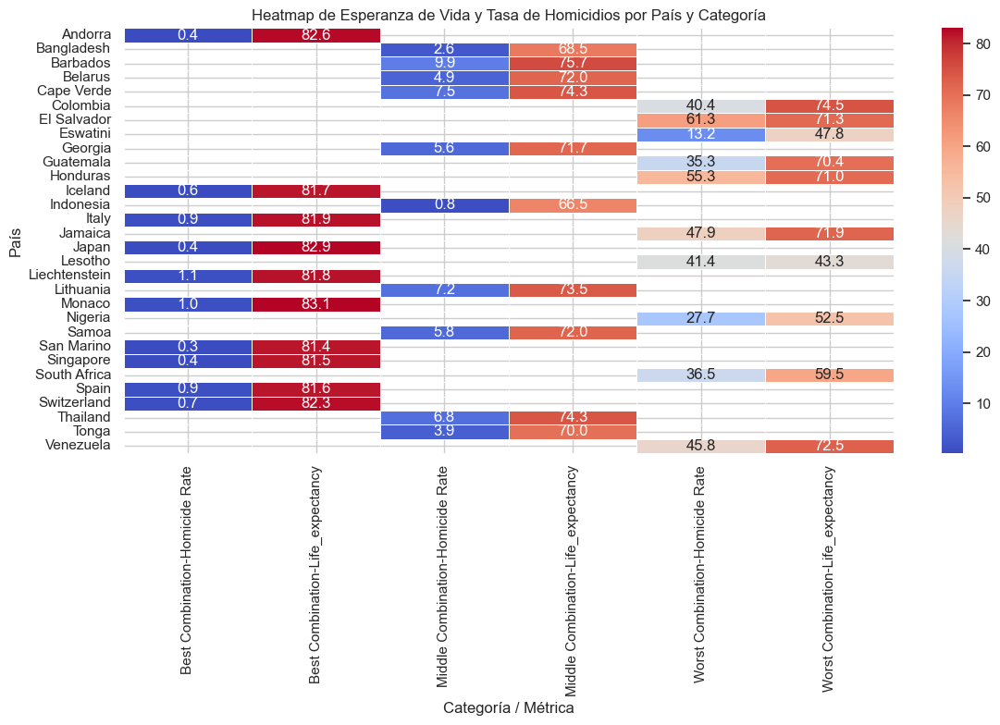

In [489]:
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data.swaplevel(axis=1).sort_index(axis=1), annot=True, fmt=".1f", cmap="coolwarm", linewidths=0.5)

plt.title("Heatmap de Esperanza de Vida y Tasa de Homicidios por País y Categoría")
plt.ylabel("País")
plt.xlabel("Categoría / Métrica")
plt.tight_layout()
plt.show()

#### - **Gráfico de Lineas**

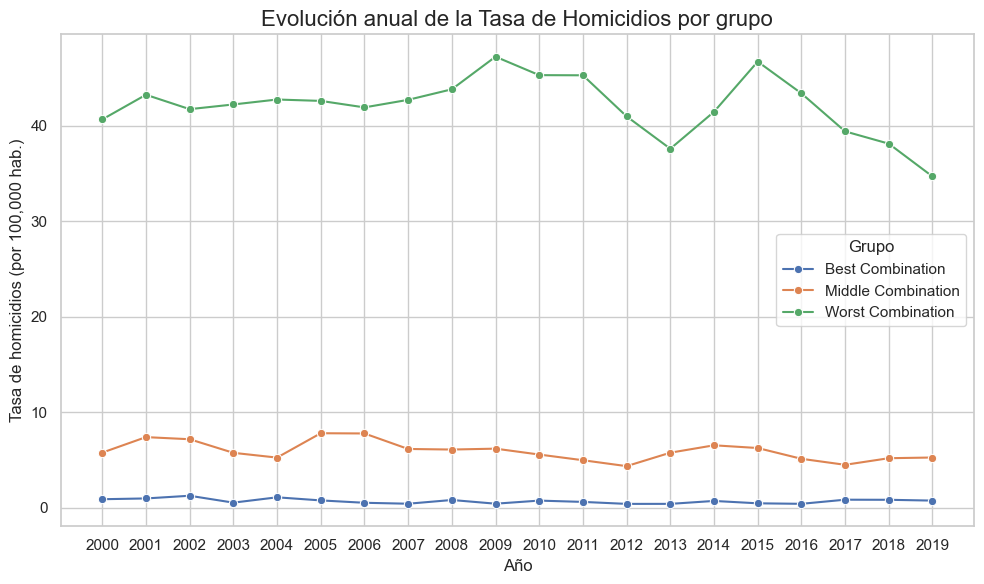

In [578]:
# Obtener los países de cada grupo
best_countries = top_10['Country'].tolist()
middle_countries = middle_10['Country'].tolist()
worst_countries = bottom_10['Country'].tolist()

# Asignar grupo a cada país en el DataFrame original
def assign_group(Country):
    if Country in best_countries:
        return 'Best Combination'
    elif Country in middle_countries:
        return 'Middle Combination'
    elif Country in worst_countries:
        return 'Worst Combination'
    else:
        return None

df_relacion['Group'] = df_relacion['Country'].apply(assign_group)

# Calcular el promedio anual de la tasa de homicidios por grupo
df_grouped_year = df_relacion[df_relacion['Group'].notna()].groupby(['Year', 'Group'])['Homicide Rate'].mean().reset_index()

# Graficar la evolución anual de la tasa de homicidios por grupo

plt.figure(figsize=(10, 6))
sns.lineplot(data=df_grouped_year, x='Year', y='Homicide Rate', hue='Group', marker='o')
plt.title('Evolución anual de la Tasa de Homicidios por grupo', fontsize=16)
plt.ylabel('Tasa de homicidios (por 100,000 hab.)')
plt.xlabel('Año')
plt.legend(title='Grupo')
# Mostrar solo años como enteros
plt.xticks(ticks=sorted(df_grouped_year['Year'].unique()), labels=sorted(df_grouped_year['Year'].unique(), key=int))
plt.tight_layout()
plt.show()

#### - **Gráfico de correlación**

In [491]:
# 1) Agrupar por país y calcular la media de Life_expectancy y Homicide Rate
df_avg = (
    df_relacion
    .groupby('Country', as_index=False)[['Life_expectancy', 'Homicide Rate']]
    .mean()
)

# 2) Graficar la relación promedio usando Plotly Express
fig = px.scatter(
    df_avg,
    x='Life_expectancy',
    y='Homicide Rate',
    hover_name='Country',
    title='Relación Promedio entre Esperanza de Vida y Tasa de Homicidios por País',
    labels={
        'Life_expectancy': 'Esperanza de Vida',
        'Homicide Rate': 'Tasa de Homicidios'
    },
    trendline='ols',    # Agrega línea de regresión lineal sobre promedios
    height=600
)

# Personalizar los puntos del gráfico
fig.update_traces(marker=dict(size=12, color='teal', opacity=0.7))

# Mostrar el gráfico
fig.show()

- Este gráfico es el más evidente para ver la relación entre la esperanza de vida y la tasa de homicidios.
- Podemos ver algunos outliers, destacando a Lesotho.
- Como se puede ver la mayoría de paises con tasas de homicidios muy altas pertenecen a Centro Ámerica, Sudamérica y África. Los 10 países con mayores tasas de homicidios pertenecen a estas regiones
- La mayoría de paises con esperanza de vida alta presentan tasa de homicidios muy bajas. Lo que sugiere una relación positiva entre la calidad de vida y la seguridad

#### - **Gráfico Boxplot para remarcar la Hipótesis de la excepción de los estados pequeños**.

In [492]:
# 1) Define la lista de microestados
micro = [
    'San Marino', 'Andorra', 'Liechtenstein',
    'Monaco', 'Iceland', 'Brunei', 'Singapore'
]

# 2) Calcula el promedio por país (si aún no lo tienes)
df_avg = (
    df_relacion
    .groupby('Country', as_index=False)[['Life_expectancy', 'Homicide Rate']]
    .mean()
)

# 3) Crea una columna "Type" para distinguir microestados de otros países
df_avg['Type'] = df_avg['Country'].apply(
    lambda e: 'Microestado' if e in micro else 'Otros países'
)

# 4) Dibuja un boxplot comparando la distribución de homicidios
fig = px.box(
    df_avg,
    x='Type',
    y='Homicide Rate',
    title='Distribución de la Tasa de Homicidios:\nMicroestados vs Otros Países',
    labels={'Homicide Rate': 'Tasa de Homicidios'}
)

# Mostrar gráfico
fig.show()

 **Conclusiones**:
- Se puede observar como países pobres con baja esperanza de vida pueden mantener tasas de homicidio sorprendentemente bajas. Posiblemente debido a factores culturales, cohesión comunitaria o menor urbanización.
- Los microestados muestran tasa de homicidios excepcionalmente bajas, incluso cuando la esperanza de vida varía. Posiblemente es debido a su homogeneidad cultural y cohesión social.
- Tras un estudio de los países con peor combinación y una alta tasa de homicidios: Se puede concluir que los homicidios estan influenciados principalmente por el Narcotráfico, delincuencia, la desigualdad, la pobreza y falta de oportunidades (Principalmente en países de Centro América y Sudamérica). Nigeria es un caso a parte ya que la mayoría de asesinatos son de facciones religiosas contra la comunidad cristiana. En África Austral (Lesotho, Sudáfrica), sugiere factores comunes como violencia organizada, tráfico de armas o legados de conflictos históricos.
- El otro país con la tasa de homicidios más alta es Cabo Verde y es debido a la pobreza que ha generado delicuencia.


#### - **Gráfico con Mapa de Burbujas del Mundo**

In [493]:
# Crear el mapa de burbujas geográficas
fig = px.scatter_geo(
    df_relacion,
    locations="Country",           # Asegúrate de que los nombres coincidan con nombres de países estándar
    locationmode="country names",  # Interpretar los valores de 'Country' como nombres de países
    size="Homicide Rate",          # Tamaño de burbuja según tasa de homicidios
    color="Homicide Rate",         # Color también según la tasa
    hover_name="Country",          # Mostrar nombre al pasar el cursor
    projection="natural earth",    # Tipo de proyección del mapa
    title="Tasa de Homicidios en el Mundo"
)

# Mostrar el gráfico
fig.show()

- Mapa de calor con la tasa de Homicidios para usar el gráfico para el Powerpoint de la presentación. Podemos confirmar lo que nos dicen los datos, las tasas más altas de homicidios se concentran en Centro América y en zonas de África.

### *EDA Esperanza de Vida por Tasa de Suicidios*

#### *Los top10 de Esperanza de Vida y Tasa de Suicidios por separado para poder realizar un gráfico de calor* 

In [494]:
# 1. Agrupar por país y calcular el promedio de ambas métricas
df_promedios = df_sui_x_esp.groupby('Country')[['Life_expectancy', 'tasa suicidios']].mean().reset_index()

# 2. Ordenar por Esperanza de Vida (de mayor a menor)
df_sorted_vida = df_promedios.sort_values(by="Life_expectancy", ascending=False)

# 3. Seleccionar el Top 10, Medio 10 y Bottom 10 por Esperanza de Vida
top_10_vida = df_sorted_vida.head(10)
middle_index_vida = len(df_sorted_vida) // 2
middle_10_vida = df_sorted_vida.iloc[middle_index_vida-5:middle_index_vida+5]
bottom_10_vida = df_sorted_vida.tail(10)

# 4. Ordenar por Tasa de Suicidios (de mayor a menor)
df_sorted_suicidios = df_promedios.sort_values(by="tasa suicidios", ascending=False)

# 5. Seleccionar el Top 10, Medio 10 y Bottom 10 por Tasa de Suicidios
top_10_suicidios = df_sorted_suicidios.head(10)
middle_index_suicidios = len(df_sorted_suicidios) // 2
middle_10_suicidios = df_sorted_suicidios.iloc[middle_index_suicidios-5:middle_index_suicidios+5]
bottom_10_suicidios = df_sorted_suicidios.tail(10)

# 6. Concatenar todo en un solo DataFrame con etiqueta de categoría
df_top_mid_bottom_separados = pd.concat([
    top_10_vida.assign(Category="Top Esperanza de vida"),
    middle_10_vida.assign(Category="Middle Esperanza de vida"),
    bottom_10_vida.assign(Category="Bottom Esperanza de vida"),
    top_10_suicidios.assign(Category="Top Tasa suicidios"),
    middle_10_suicidios.assign(Category="Middle Tasa suicidios"),
    bottom_10_suicidios.assign(Category="Bottom Tasa suicidios")
])

# 7. Reiniciar índice para orden limpio
df_top_mid_bottom_separados.reset_index(drop=True, inplace=True)

# 8. Mostrar tabla
print(df_top_mid_bottom_separados.to_string(index=False))

                 Country  Life_expectancy  tasa suicidios                 Category
                   Japan        82.886775       17.038315    Top Esperanza de vida
             Switzerland        82.041705       12.225510    Top Esperanza de vida
                   Italy        81.770530        4.950500    Top Esperanza de vida
               Australia        81.726355       10.583450    Top Esperanza de vida
                 Iceland        81.636825       12.116710    Top Esperanza de vida
                   Spain        81.584455        5.795000    Top Esperanza de vida
               Singapore        81.435600        9.159625    Top Esperanza de vida
                  Sweden        81.344140       12.382485    Top Esperanza de vida
                  Israel        81.190345        5.629500    Top Esperanza de vida
                  France        81.182525       13.294145    Top Esperanza de vida
                   Samoa        71.914770       15.002465 Middle Esperanza de vida
    

#### *Gráficos Esperanza de Vida por Tasa de Suicidios* 

In [495]:
#seleccionamos columnas claves

heatmap_data = df_top_mid_bottom_separados.pivot(index="Country", columns="Category", values=["Life_expectancy", "tasa suicidios"])

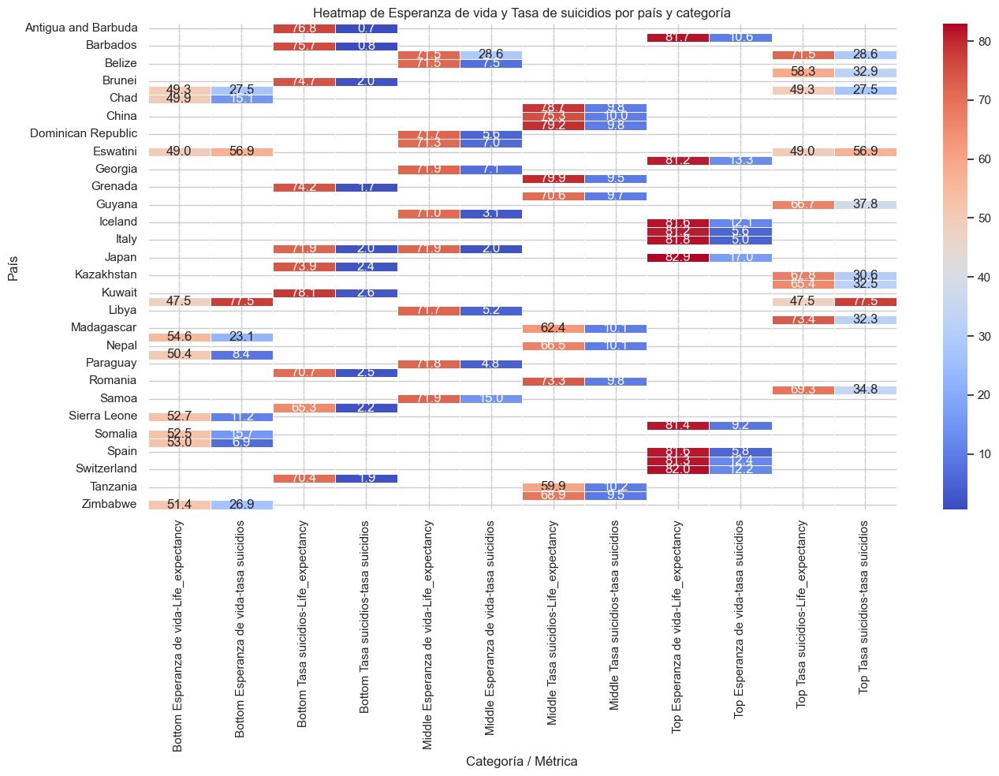

In [496]:
# Crear la figura
plt.figure(figsize=(14, 10))

# Dibujar el heatmap con anotaciones, colores, y separación entre celdas
sns.heatmap(
    heatmap_data.swaplevel(axis=1).sort_index(axis=1),  # Reorganizar niveles para mejorar legibilidad
    annot=True,              # Mostrar los valores en las celdas
    fmt=".1f",               # Formato decimal con un dígito
    cmap="coolwarm",         # Paleta de colores
    linewidths=0.5           # Líneas divisorias entre celdas
)

# Etiquetas y título
plt.title("Heatmap de Esperanza de vida y Tasa de suicidios por país y categoría")
plt.ylabel("País")
plt.xlabel("Categoría / Métrica")

# Ajustar el diseño para que no se solapen elementos
plt.tight_layout()

# Mostrar el gráfico
plt.show()

#### - **Grafico de Linea Temporal de Tasa de suicidios por Grupo**

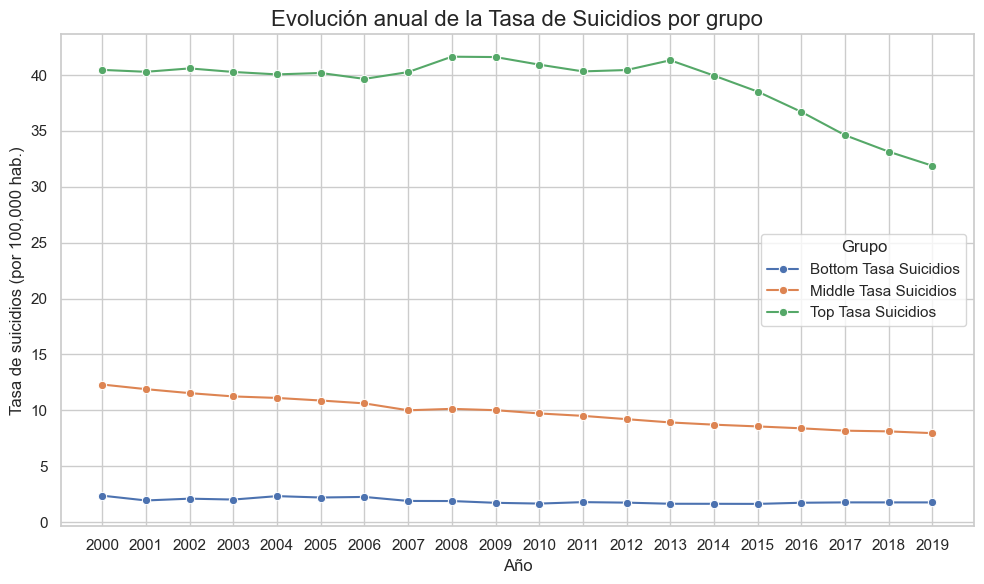

In [579]:
# Identificar los países de cada grupo de tasa de suicidios
top_countries = top_10_suicidios['Country'].tolist()
middle_countries = middle_10_suicidios['Country'].tolist()
bottom_countries = bottom_10_suicidios['Country'].tolist()

# Añadir una columna de grupo al DataFrame original
def assign_group(Country):
    if Country in top_countries:
        return 'Top Tasa Suicidios'
    elif Country in middle_countries:
        return 'Middle Tasa Suicidios'
    elif Country in bottom_countries:
        return 'Bottom Tasa Suicidios'
    else:
        return None

df_sui_x_esp['Group'] = df_sui_x_esp['Country'].apply(assign_group)

# Calcular el promedio anual de la tasa de suicidios por grupo
df_grouped_year = df_sui_x_esp[df_sui_x_esp['Group'].notna()].groupby(['Year', 'Group'])['tasa suicidios'].mean().reset_index()

# Graficar la evolución temporal

plt.figure(figsize=(10, 6))
sns.lineplot(data=df_grouped_year, x='Year', y='tasa suicidios', hue='Group', marker='o')
plt.title('Evolución anual de la Tasa de Suicidios por grupo', fontsize=16)
plt.ylabel('Tasa de suicidios (por 100,000 hab.)')
plt.xlabel('Año')
plt.legend(title='Grupo')
# Mostrar solo años como enteros
plt.xticks(ticks=sorted(df_grouped_year['Year'].unique()), labels=sorted(df_grouped_year['Year'].unique(), key=int))
plt.tight_layout()
plt.show()

#### - **Gráfico de correlación**

In [498]:
fig = px.scatter(
    df_promedios,
    x='Life_expectancy',
    y='tasa suicidios',
    hover_name='Country',  
    title='Relación entre Esperanza de Vida y Tasa de Suicidios por País',
    labels={
        'Life_expectancy': 'Esperanza de vida',
        'tasa suicidios': 'Tasa de suicidios'
    },
    trendline='ols',
    height=600
)

fig.update_traces(marker=dict(size=10, color='purple'))
fig.show()

#### - **Gráfico con Mapa de Burbujas Tasa Suicidios**

In [499]:
fig = px.scatter_geo(
    df_promedios,
    locations="Country",
    locationmode="country names",
    size="tasa suicidios",
    color="tasa suicidios",
    color_continuous_scale="Bluered",  # Azul para bajo, rojo para alto
    hover_name="Country",
    projection="natural earth",
    title="Tasa de Suicidios en el Mundo"
)

fig.show()

 **Conclusiones**:
- Top suicidios: Países con esperanza de vida media-alta (Rusia, Lituania) y baja (Lesotho, Guyana).
- Middle Suicidios: Países con esperanda de vida alta (China, Alemania) pero con tasas mayores a 10, lo que sugiere otros factores protectores.
- Bottom Suicidios: Incluye desde países con alta esperanza de vida (Barbados) hasta media(Jamaica), pero con tasas mayores a 9 de suicidios.
- Países con baja esperanza de vida puede tener unas tasas extremas de suicidios.
- Los países con mayor esperanza de vida (+75 años, como Rusia, Lituania o Alemania) presentan tasas de suicidios significativamente más altas que aquellos con esperanza de vida media o baja, debido a factores como el aislamiento social en adultos mayores o enfermedades crónicas
- Las tasas de suicidios más altas se concentran en regiones específicas: Europa del Este (Lituania, Rusia, Bielorrusia) y África Austral (Lesotho, Eswatini), lo que sugiere influencias culturales o climáticas (ej. inviernos extremos o estigmatización de la salud mental).
- En la combinación media: Lituania que pertenece a la Comunidad Europea y es el país con mayor tasa de homicidios dentro de la Unión es debido a que son los mayores consumidores de alcohol, teniendo unas tasas de 18,2 litros de alcohol per cápita por persona al año. 
- Países con baja esperanza de vida (-60 años, como Lesotho o Eswatini) pero altas tasas de suicidios podrían reflejar el impacto de epidemias (VIH/SIDA) o inestabilidad política, mientras que países con similar esperanza de vida pero bajos suicidios (ej. Tanzania) tienen redes comunitarias más fuertes.

### *Mergear Esperanza de Vida por Tasa de Homicidios con Dataset Suicidios*

In [500]:
df_suicides.head(3)

,Country,Year,Age-standardized suicide rate - Sex: both sexes
0,Afghanistan,2000,7.71
1,Afghanistan,2001,7.89
2,Afghanistan,2002,7.85


In [501]:
df_relacion.head(3)

,Country,Year,Life_expectancy,Homicide Rate,Group
2521,Nicaragua,2000,67.2335,9.291027,None
420,Bhutan,2000,62.0103,3.065359,None
2601,North Macedonia,2000,72.8567,2.306256,None


In [502]:
# Hacer el merge de df_relacion con df_suicides por Country y Year
df_relacion_x_suicides = pd.merge(
    df_relacion,
    df_suicides,
    on=['Country', 'Year'],
    how='outer',
    indicator=True
)

# Recuento de coincidencias
print("Recuento de coincidencias:")
print(df_relacion_x_suicides['_merge'].value_counts())

# Países únicos antes del filtro
paises_antes = df_relacion_x_suicides['Country'].nunique()
print(f"Países únicos antes del filtro: {paises_antes}")

# Crear conjuntos por tipo de merge
paises_left_only = set(df_relacion_x_suicides[df_relacion_x_suicides['_merge'] == 'left_only']['Country'].unique())
paises_right_only = set(df_relacion_x_suicides[df_relacion_x_suicides['_merge'] == 'right_only']['Country'].unique())
paises_both = set(df_relacion_x_suicides[df_relacion_x_suicides['_merge'] == 'both']['Country'].unique())

# Todos los países que tienen algún conflicto (no están solo en both)
paises_perdidos = sorted((paises_left_only | paises_right_only) - paises_both)
print(f"Países completamente perdidos ({len(paises_perdidos)}):")
print(paises_perdidos)

# Países que tienen registros combinados (both y left/right en diferentes años)
paises_mixtos = sorted((paises_left_only | paises_right_only) & paises_both)
print(f"Países con registros mixtos (both + left/right) ({len(paises_mixtos)}):")
print(paises_mixtos)

# Filtrar solo los registros válidos (both)
df_relacion_x_suicides = df_relacion_x_suicides[df_relacion_x_suicides['_merge'] == 'both'].copy()

# Eliminar columna de control
df_relacion_x_suicides.drop(columns=['_merge'], inplace=True)

# Países únicos después del filtro
paises_despues = df_relacion_x_suicides['Country'].nunique()
print(f"Países únicos después del filtro: {paises_despues}")

Recuento de coincidencias:
_merge
both          2337
right_only    1323
left_only       94
Name: count, dtype: int64
Países únicos antes del filtro: 191
Países completamente perdidos (32):
['Andorra', 'Benin', 'Burkina Faso', 'Central African Republic', 'Chad', 'Comoros', 'Congo', "Cote d'Ivoire", 'Democratic Republic of Congo', 'Djibouti', 'Dominica', 'Equatorial Guinea', 'Gabon', 'Gambia', 'Guinea', 'Kyrgyzstan', 'Laos', 'Libya', 'Liechtenstein', 'Madagascar', 'Mali', 'Micronesia (country)', 'Monaco', 'North Korea', 'Palau', 'Saint Kitts and Nevis', 'San Marino', 'Senegal', 'Somalia', 'Sudan', 'Togo', 'Tuvalu']
Países con registros mixtos (both + left/right) (108):
['Afghanistan', 'Algeria', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Azerbaijan', 'Bahrain', 'Bangladesh', 'Belarus', 'Belgium', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brunei', 'Burundi', 'Cambodia', 'Cameroon', 'Cape Verde', 'Chile', 'China', 'Cyprus', 'Czechia', 'Denmark', 'Dominican 

In [503]:
df_relacion_x_suicides.head(3)

,Country,Year,Life_expectancy,Homicide Rate,Group,Age-standardized suicide rate - Sex: both sexes
9,Afghanistan,2009,60.3636,4.071527,None,6.84
10,Afghanistan,2010,60.8508,3.487093,None,6.67
11,Afghanistan,2011,61.4191,4.208668,None,6.42


In [504]:
# Eliminar la columna 'Group'
df_relacion_x_suicides = df_relacion_x_suicides.drop(columns=['Group'])

# Renombrar la columna larga por algo más manejable
df_relacion_x_suicides.rename(columns={
    'Age-standardized suicide rate - Sex: both sexes': 'Tasa suicidios'
}, inplace=True)

In [505]:
df_relacion_x_suicides.head(3)

,Country,Year,Life_expectancy,Homicide Rate,Tasa suicidios
9,Afghanistan,2009,60.3636,4.071527,6.84
10,Afghanistan,2010,60.8508,3.487093,6.67
11,Afghanistan,2011,61.4191,4.208668,6.42


#### - **Gráfico de Matriz Tasa de Suicidios por Esperanza de Vida**

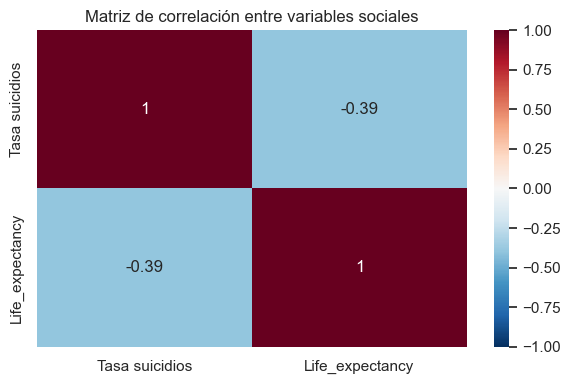

In [506]:
# Seleccionar solo las columnas numéricas relevantes
cols_numericas = ['Tasa suicidios', 'Life_expectancy']
correlation_matrix = df_relacion_x_suicides[cols_numericas].corr()

plt.figure(figsize=(6, 4))
sns.heatmap(correlation_matrix, annot=True, cmap='RdBu_r', vmin=-1, vmax=1)
plt.title('Matriz de correlación entre variables sociales')
plt.tight_layout()

- Existe una correlación negativa moderada entre esperanza de vida y tasa de suicidios (los países con mayor esperanza de vida tienden a tener tasas de suicidio más bajas, aunque hay excepciones).

#### - **Gráfico de Matriz Tasa de Homicidios por Esperanza de Vida**

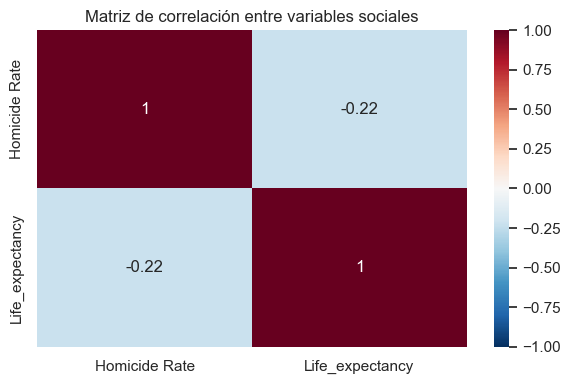

In [507]:
# Seleccionar solo las columnas numéricas relevantes
cols_numericas = ['Homicide Rate', 'Life_expectancy']
correlation_matrix = df_relacion_x_suicides[cols_numericas].corr()

plt.figure(figsize=(6, 4))
sns.heatmap(correlation_matrix, annot=True, cmap='RdBu_r', vmin=-1, vmax=1)
plt.title('Matriz de correlación entre variables sociales')
plt.tight_layout()

- La correlación entre esperanza de vida y tasa de homicidios es negativa pero más débil, lo que indica que, en general, los países con mayor esperanza de vida suelen tener menos homicidios, aunque la relación no es tan marcada.

## *Crear Modelo de Regresión con la Esperanza de Vida por Tasa de Suicidios y Tasa de Homicidios*

##### **Modelo de Regresión Esperanza de Vida por Tasa de Suicidios**

(-0.32546942579022164, 76.36717515938845, 0.15513995244028211)

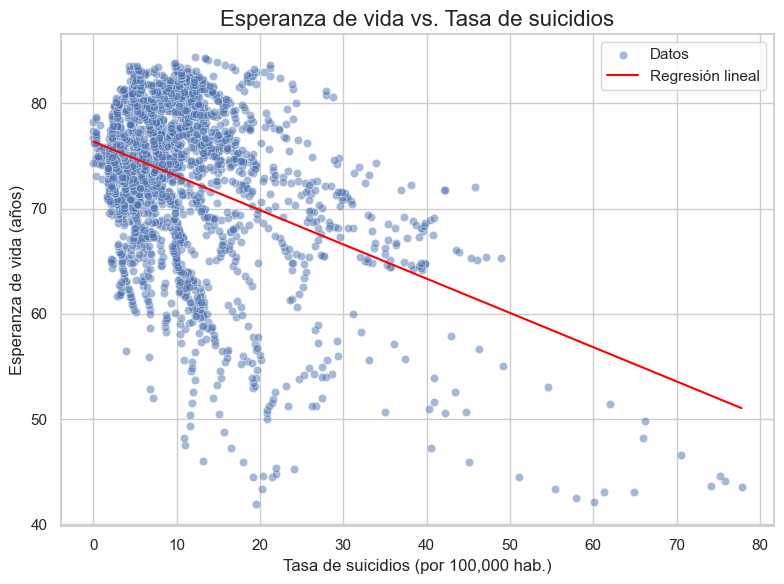

In [508]:
# Preparar datos
X = df_relacion_x_suicides[['Tasa suicidios']].values
y = df_relacion_x_suicides['Life_expectancy'].values

# Ajustar modelo
model = LinearRegression()
model.fit(X, y)

# Predicciones para la línea
x_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
y_pred = model.predict(x_range)

# Graficar
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X.flatten(), y=y, alpha=0.5, label='Datos')
plt.plot(x_range, y_pred, color='red', label='Regresión lineal')
plt.title('Esperanza de vida vs. Tasa de suicidios', fontsize=16)
plt.xlabel('Tasa de suicidios (por 100,000 hab.)')
plt.ylabel('Esperanza de vida (años)')
plt.legend()
plt.tight_layout()

# Resultados del modelo
coef = model.coef_[0]
intercept = model.intercept_
r2 = model.score(X, y)
(coef, intercept, r2)

Resultados del análisis de regresión lineal:

- El coeficiente de la tasa de suicidios es aproximadamente -0.33. Esto significa que, en promedio, por cada aumento de 1 unidad en la tasa de suicidios (por 100,000 habitantes), la esperanza de vida disminuye en 0.33 años.
- El intercepto es 76.44, que representa la esperanza de vida estimada cuando la tasa de suicidios es 0.
- El R² es 0.16, lo que indica que la tasa de suicidios explica aproximadamente el 16% de la variabilidad en la esperanza de vida. Es una relación estadísticamente significativa, pero hay otros factores importantes que también influyen en la esperanza de vida.

##### **Modelo Regresión Esperanza de Vida por Tasa de Homicidios**

(-0.13769712577585136, 73.90836601322356, 0.05059985886728835)

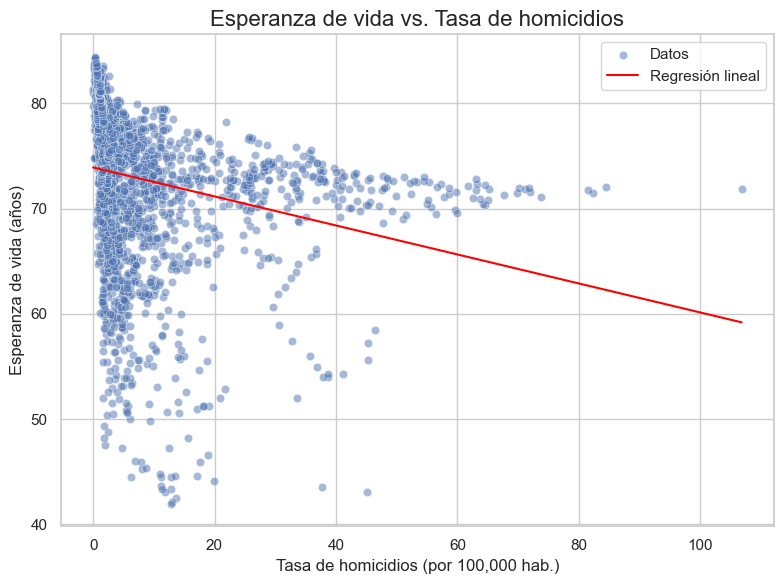

In [509]:
# Preparar datos para homicidios
X_hom = df_relacion_x_suicides[['Homicide Rate']].values

# Ajustar modelo
model_hom = LinearRegression()
model_hom.fit(X_hom, y)

# Predicciones para la línea
x_range_hom = np.linspace(X_hom.min(), X_hom.max(), 100).reshape(-1, 1)
y_pred_hom = model_hom.predict(x_range_hom)

# Graficar
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_hom.flatten(), y=y, alpha=0.5, label='Datos')
plt.plot(x_range_hom, y_pred_hom, color='red', label='Regresión lineal')
plt.title('Esperanza de vida vs. Tasa de homicidios', fontsize=16)
plt.xlabel('Tasa de homicidios (por 100,000 hab.)')
plt.ylabel('Esperanza de vida (años)')
plt.legend()
plt.tight_layout()

# Resultados del modelo
coef_hom = model_hom.coef_[0]
intercept_hom = model_hom.intercept_
r2_hom = model_hom.score(X_hom, y)
(coef_hom, intercept_hom, r2_hom)

Resultados del análisis de regresión lineal:

- El coeficiente de la tasa de homicidios es aproximadamente -0.14. Esto significa que, en promedio, por cada aumento de 1 unidad en la tasa de homicidios (por 100,000 habitantes), la esperanza de vida disminuye en 0.14 años.
- El intercepto es 73.95, que representa la esperanza de vida estimada cuando la tasa de homicidios es 0.
- El R² es 0.05, lo que indica que la tasa de homicidios explica solo el 5% de la variabilidad en la esperanza de vida. Es una relación más débil que la observada con la tasa de suicidios.

##### **Modelo de regresión con la comparación entre ambas variables y la Esperanza de Vida**

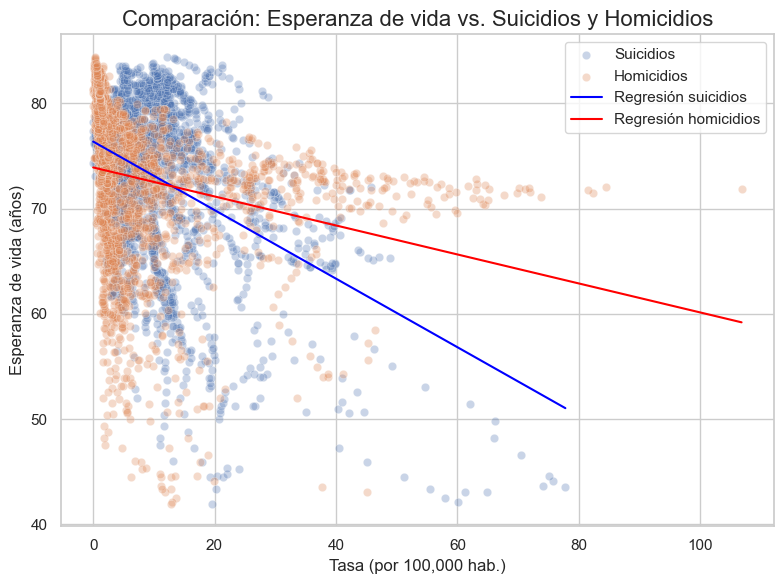

In [510]:
# Comparar ambos modelos en una sola gráfica
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df_relacion_x_suicides['Tasa suicidios'], y=y, alpha=0.3, label='Suicidios')
sns.scatterplot(x=df_relacion_x_suicides['Homicide Rate'], y=y, alpha=0.3, label='Homicidios')
plt.plot(x_range, y_pred, color='blue', label='Regresión suicidios')
plt.plot(x_range_hom, y_pred_hom, color='red', label='Regresión homicidios')
plt.title('Comparación: Esperanza de vida vs. Suicidios y Homicidios', fontsize=16)
plt.xlabel('Tasa (por 100,000 hab.)')
plt.ylabel('Esperanza de vida (años)')
plt.legend()
plt.tight_layout()

**Pendiente de la regresión (coeficiente):**

- Para la tasa de suicidios, la pendiente es aproximadamente -0.33. Esto significa que, en promedio, un aumento de 10 suicidios por cada 100,000 habitantes se asocia con una disminución de 3.3 años en la esperanza de vida.
- Para la tasa de homicidios, la pendiente es aproximadamente -0.14. Es decir, un aumento de 10 homicidios por cada 100,000 habitantes se asocia con una disminución de 1.4 años en la esperanza de vida.
- Esto muestra que el impacto de la tasa de suicidios sobre la esperanza de vida es más del doble que el de la tasa de homicidios, según el modelo lineal simple.

**Capacidad explicativa del modelo (R²):**

- El modelo con la tasa de suicidios tiene un R² de 0.16 (16%), lo que indica que esta variable explica el 16% de la variabilidad en la esperanza de vida.
- El modelo con la tasa de homicidios tiene un R² de 0.05 (5%), es decir, explica solo el 5% de la variabilidad.
- Esto significa que la tasa de suicidios tiene una relación más fuerte y relevante estadísticamente con la esperanza de vida que la tasa de homicidios.

**Interpretación visual de la gráfica:**

- En la gráfica, la nube de puntos para suicidios muestra una tendencia descendente más clara y la línea azul de regresión tiene una pendiente más pronunciada.
- Para homicidios, la dispersión es mayor y la línea roja es menos inclinada, lo que indica una relación más débil y menos consistente.
Conclusión:

- Aunque ambas tasas tienen una relación negativa con la esperanza de vida, la tasa de suicidios es un predictor más fuerte y consistente en este conjunto de datos.
Sin embargo, ambos modelos dejan una gran parte de la variabilidad sin explicar, lo que sugiere que hay otros factores importantes que afectan la esperanza de vida.

## **6) Variables Economicas - TFM Salud Pública** 

***Análisis de los datasets con el GPD, Tasa de pobreza y Gasto en Sanidad para ver la relación con la Esperanza de Vida en distintos tipos de países, tanto desarrollados como subdesarrollados.*** 

In [511]:
df_total.head(3)

,Country,Year,Life_expectancy,BCG (% of one-year-olds immunized),HepB3 (% of one-year-olds immunized),Hib3 (% of one-year-olds immunized),IPV1 (% of one-year-olds immunized),MCV1 (% of one-year-olds immunized),PCV3 (% of one-year-olds immunized),Pol3 (% of one-year-olds immunized),RCV1 (% of one-year-olds immunized),RotaC (% of one-year-olds immunized),YFV (% of one-year-olds immunized),DTP3 (% of one-year-olds immunized),"GDP per capita (output, multiple price benchmarks)",Age-standardized suicide rate - Sex: both sexes,Share below $1 a day,Share below $2.15 a day,Share below $3.65 a day,Share below $6.85 a day,Share below $10 a day,Share below $20 a day,Share below $30 a day,Share below $40 a day,Number below $1 a day,Number below $2.15 a day,Number below $3.65 a day,Number below $6.85 a day,Number below $10 a day,Number below $20 a day,Number below $30 a day,Number below $40 a day,40% of median - share of population below poverty line,50% of median - share of population below poverty line,60% of median - share of population below poverty line,40% of median - total number of people below poverty line,50% of median - total number of people below poverty line,60% of median - total number of people below poverty line,Mean income or consumption per day,Median income or consumption per day,Threshold income or consumption per day marking the poorest decile,Threshold income or consumption per day marking the richest decile,mld,gini,polarization,decile1_share,decile2_share,decile3_share,decile4_share,decile5_share,decile6_share,decile7_share,decile8_share,decile9_share,decile10_share,decile2_thr,decile3_thr,decile4_thr,decile5_thr,decile6_thr,decile7_thr,decile8_thr,income_gap_ratio_40_median,income_gap_ratio_50_median,income_gap_ratio_60_median,poverty_gap_index_40_median,poverty_gap_index_50_median,poverty_gap_index_60_median,avg_shortfall_40_median,avg_shortfall_50_median,avg_shortfall_60_median,total_shortfall_40_median,total_shortfall_50_median,total_shortfall_60_median,income_gap_ratio_100,income_gap_ratio_1000,income_gap_ratio_2000,income_gap_ratio_215,income_gap_ratio_3000,income_gap_ratio_365,income_gap_ratio_4000,income_gap_ratio_685,poverty_gap_index_100,poverty_gap_index_1000,poverty_gap_index_2000,poverty_gap_index_215,poverty_gap_index_3000,poverty_gap_index_365,poverty_gap_index_4000,poverty_gap_index_685,avg_shortfall_100,avg_shortfall_1000,avg_shortfall_2000,avg_shortfall_215,avg_shortfall_3000,avg_shortfall_365,avg_shortfall_4000,avg_shortfall_685,total_shortfall_100,total_shortfall_1000,total_shortfall_2000,total_shortfall_215,total_shortfall_3000,total_shortfall_365,total_shortfall_4000,total_shortfall_685,decile1_avg,decile2_avg,decile3_avg,decile4_avg,decile5_avg,decile6_avg,decile7_avg,decile8_avg,decile9_avg,decile10_avg,bottom50_share,middle40_share,palma_ratio,s80_s20_ratio,p90_p10_ratio,p90_p50_ratio,p50_p10_ratio,Domestic general government health expenditure (% of GDP)
1555,Indonesia,2000,66.4334,81.0,65.0,NaN,NaN,76.0,NaN,72.0,NaN,NaN,NaN,75.0,3753.7678,3.7900,2.001545,43.603420,81.625880,96.860600,98.919690,99.87049,99.961754,99.98256,4284756.0,93342897.0,174738495.0,207351843.0,211759787.0,213795178.0,213990542.0,214035086.0,1.254865,4.326587,10.923497,2686319.0,9262030.0,23384195.0,2.792322,2.308447,1.360000,4.580000,0.142022,0.294584,0.232399,4.079925,5.362224,6.203317,6.998041,7.824139,8.778653,9.941017,11.547973,14.235999,25.028711,1.620000,1.840000,2.060000,2.300000,2.600000,2.960000,3.520000,14.605947,15.251466,16.595402,0.183285,0.659868,1.812798,0.134868,0.176036,0.229858,362299.03,1630450.50,5375035.5,14.864285,73.396760,86.215770,24.450865,90.74779,41.119686,93.044914,62.835144,0.297515,72.603850,86.104110,10.661413,90.713080,33.564304,93.028690,60.862500,0.148643,7.339676,17.243155,0.525694,27.224337,1.500869,37.217968,4.304207,636898.300,1.554248e+09,3.686503e+09,4.906977e+07,5.825750e+09,2.622595e+08,7.965950e+09,892485300.0,1.139247,1.497306,1.732166,1.954079,2.184752,2.451283,2.775852,3

### Se renombran columnas y a continuacion se creara un df sin las columnas de vacunacion, que seran usadas en la tercera parte de este analisis, aunque originalmente se trabajaron a la vez por Paula Fernandez.

In [512]:
df_total = df_total.rename(columns={
    'Age-standardized suicide rate - Sex: both sexes': 'Suicide rate',
    'Domestic general government health expenditure (% of GDP)': '% Public health expenditure',
    'GDP per capita (output, multiple price benchmarks)': 'GDP per capita',
    'BCG (% of one-year-olds immunized)': 'BCG',
    'Hib3 (% of one-year-olds immunized)': 'Hib3',
    'IPV1 (% of one-year-olds immunized)': 'IPV1',
    'MCV1 (% of one-year-olds immunized)': 'MCV1',
    'HepB3 (% of one-year-olds immunized)': 'HepB3',
    'PCV3 (% of one-year-olds immunized)': 'PCV3',
    'Pol3 (% of one-year-olds immunized)': 'Pol3',
    'RCV1 (% of one-year-olds immunized)': 'RCV1',
    'RotaC (% of one-year-olds immunized)': 'Rotac',
    'YFV (% of one-year-olds immunized)': 'YFV',
    'DTP3 (% of one-year-olds immunized)': 'DTP3'
})

# Actualizar el diccionario para mantener la sincronización
dataframes['df_total'] = df_total

In [513]:
# Lista de columnas de vacunación renombradas
columnas_vacunas = [
    'BCG', 'Hib3', 'IPV1', 'MCV1', 'HepB3',
    'PCV3', 'Pol3', 'RCV1', 'Rotac', 'YFV', 'DTP3'
]

# Crear df_economicas excluyendo las columnas de vacunación
df_economicas = df_total.drop(columns=columnas_vacunas)

# Actualizar también en el diccionario si quieres mantenerlo sincronizado
dataframes['df_economicas'] = df_economicas

In [514]:
df_economicas.head(1)

,Country,Year,Life_expectancy,GDP per capita,Suicide rate,Share below $1 a day,Share below $2.15 a day,Share below $3.65 a day,Share below $6.85 a day,Share below $10 a day,Share below $20 a day,Share below $30 a day,Share below $40 a day,Number below $1 a day,Number below $2.15 a day,Number below $3.65 a day,Number below $6.85 a day,Number below $10 a day,Number below $20 a day,Number below $30 a day,Number below $40 a day,40% of median - share of population below poverty line,50% of median - share of population below poverty line,60% of median - share of population below poverty line,40% of median - total number of people below poverty line,50% of median - total number of people below poverty line,60% of median - total number of people below poverty line,Mean income or consumption per day,Median income or consumption per day,Threshold income or consumption per day marking the poorest decile,Threshold income or consumption per day marking the richest decile,mld,gini,polarization,decile1_share,decile2_share,decile3_share,decile4_share,decile5_share,decile6_share,decile7_share,decile8_share,decile9_share,decile10_share,decile2_thr,decile3_thr,decile4_thr,decile5_thr,decile6_thr,decile7_thr,decile8_thr,income_gap_ratio_40_median,income_gap_ratio_50_median,income_gap_ratio_60_median,poverty_gap_index_40_median,poverty_gap_index_50_median,poverty_gap_index_60_median,avg_shortfall_40_median,avg_shortfall_50_median,avg_shortfall_60_median,total_shortfall_40_median,total_shortfall_50_median,total_shortfall_60_median,income_gap_ratio_100,income_gap_ratio_1000,income_gap_ratio_2000,income_gap_ratio_215,income_gap_ratio_3000,income_gap_ratio_365,income_gap_ratio_4000,income_gap_ratio_685,poverty_gap_index_100,poverty_gap_index_1000,poverty_gap_index_2000,poverty_gap_index_215,poverty_gap_index_3000,poverty_gap_index_365,poverty_gap_index_4000,poverty_gap_index_685,avg_shortfall_100,avg_shortfall_1000,avg_shortfall_2000,avg_shortfall_215,avg_shortfall_3000,avg_shortfall_365,avg_shortfall_4000,avg_shortfall_685,total_shortfall_100,total_shortfall_1000,total_shortfall_2000,total_shortfall_215,total_shortfall_3000,total_shortfall_365,total_shortfall_4000,total_shortfall_685,decile1_avg,decile2_avg,decile3_avg,decile4_avg,decile5_avg,decile6_avg,decile7_avg,decile8_avg,decile9_avg,decile10_avg,bottom50_share,middle40_share,palma_ratio,s80_s20_ratio,p90_p10_ratio,p90_p50_ratio,p50_p10_ratio,% Public health expenditure
1555,Indonesia,2000,66.4334,3753.7678,3.79,2.001545,43.60342,81.62588,96.8606,98.91969,99.87049,99.961754,99.98256,4284756.0,93342897.0,174738495.0,207351843.0,211759787.0,213795178.0,213990542.0,214035086.0,1.254865,4.326587,10.923497,2686319.0,9262030.0,23384195.0,2.792322,2.308447,1.36,4.58,0.142022,0.294584,0.232399,4.079925,5.362224,6.203317,6.998041,7.824139,8.778653,9.941017,11.547973,14.235999,25.028711,1.62,1.84,2.06,2.3,2.6,2.96,3.52,14.605947,15.251466,16.595402,0.183285,0.659868,1.812798,0.134868,0.176036,0.229858,362299.03,1630450.5,5375035.5,14.864285,73.39676,86.21577,24.450865,90.74779,41.119686,93.044914,62.835144,0.297515,72.60385,86.10411,10.661413,90.71308,33.564304,93.02869,60.8625,0.148643,7.339676,17.243155,0.525694,27.224337,1.500869,37.217968,4.304207,636898.3,1.554248e+09,3.686503e+09,49069770.0,5.825750e+09,262259520.0,7.965950e+09,892485300.0,1.139247,1.497306,1.732166,1.954079,2.184752,2.451283,2.775852,3.224566,3.975149,6.988823,30.467646,44.50364,1.105337,4.158451,3.367647,1.991304,1.691176,0.549734


### Análisis de Gasto Público en Sanidad, PIB per cápita y ratio de suicidio estandarizado

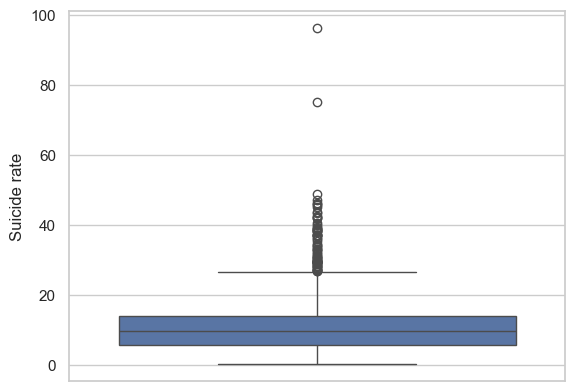

Valor del segundo cuartil (25%): 5.85
Valor del tercer cuartil (75%): 14.17
Valor del rango intercuartil (IQR): 8.32
Los valores atípicos se definen como aquellos que caen fuera del siguiente rango:
	 - Límite inferior (considerado extremadamente bajo): -6.64
	 - Límite superior (considerado extremadamente alto): 26.66
Hay 74 outliers en la variable 'Suicide rate'


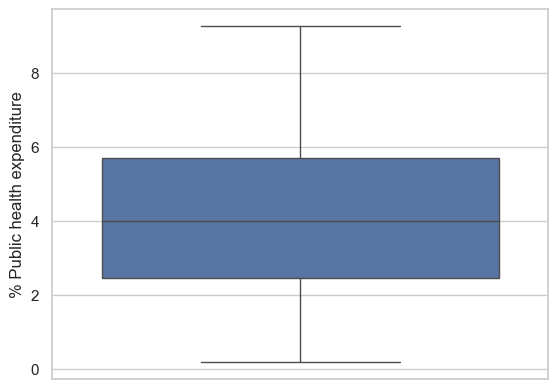

Valor del segundo cuartil (25%): 2.46
Valor del tercer cuartil (75%): 5.72
Valor del rango intercuartil (IQR): 3.25
Los valores atípicos se definen como aquellos que caen fuera del siguiente rango:
	 - Límite inferior (considerado extremadamente bajo): -2.42
	 - Límite superior (considerado extremadamente alto): 10.60
Hay 0 outliers en la variable '% Public health expenditure'


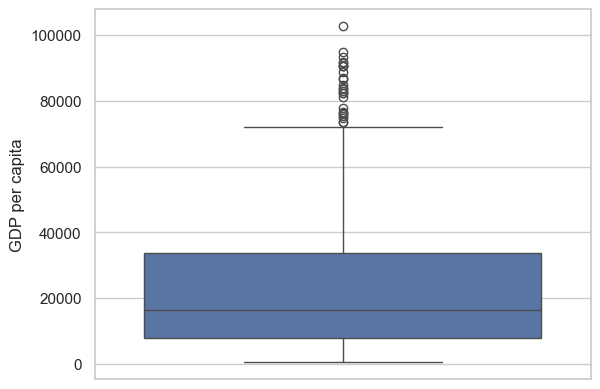

Valor del segundo cuartil (25%): 8005.57
Valor del tercer cuartil (75%): 33739.33
Valor del rango intercuartil (IQR): 25733.76
Los valores atípicos se definen como aquellos que caen fuera del siguiente rango:
	 - Límite inferior (considerado extremadamente bajo): -30595.08
	 - Límite superior (considerado extremadamente alto): 72339.97
Hay 26 outliers en la variable 'GDP per capita'


[2523,
 2524,
 2525,
 2526,
 2527,
 2528,
 2529,
 2530,
 3547,
 2531,
 2532,
 1978,
 1627,
 1979,
 1980,
 1628,
 3278,
 1981,
 1629,
 1630,
 2536,
 3279,
 1982,
 1983,
 1631,
 2537]

In [515]:
# Gráficas de correlación actualizadas
graficar_correlacion(df_economicas, 'Life_expectancy', 'Suicide rate')
graficar_correlacion(df_economicas, 'Life_expectancy', '% Public health expenditure')
graficar_correlacion(df_economicas, 'Life_expectancy', 'GDP per capita')

# Detección de outliers actualizada
deteccion_outliers(df_economicas, 'Suicide rate')
deteccion_outliers(df_economicas, '% Public health expenditure')
deteccion_outliers(df_economicas, 'GDP per capita')

#### Matriz de correlaciones de tasa de suicidio, GDP per capita y % de gasto en sanidad

,Life_expectancy,Suicide rate,% Public health expenditure,GDP per capita
Life_expectancy,1.000000,-0.291718,0.713046,0.713614
Suicide rate,-0.291718,1.000000,0.028818,-0.015489
% Public health expenditure,0.713046,0.028818,1.000000,0.735361
GDP per capita,0.713614,-0.015489,0.735361,1.000000


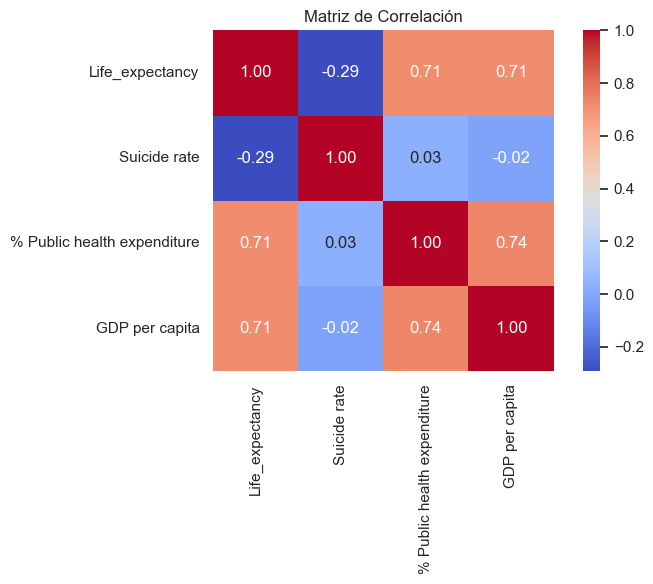

In [516]:
# Seleccionar las columnas que te interesan
cols = [
    'Life_expectancy',
    'Suicide rate',
    '% Public health expenditure',
    'GDP per capita'
]

# Calcular matriz de correlación
correlaciones = df_economicas[cols].dropna().corr()

# Mostrar la matriz
display(correlaciones)

# Graficarla
plt.figure(figsize=(8, 6))
sns.heatmap(correlaciones, annot=True, cmap="coolwarm", fmt=".2f", square=True)
plt.title("Matriz de Correlación")
plt.tight_layout()
plt.show()

Las correlaciones más fuertes (y positivas) con la esperanza de vida son:
- Gasto público en salud (0.71)
- GDP per capita (0.71)

La tasa de suicidio muestra una influencia negativa moderada (-0.29)


#### Analizar el top, middle y bottom 10 de países frente a tasa de suicidio, % de gasto en sanidad y GDP per capita

In [517]:
# Calcular el promedio de esperanza de vida, ratio de suicidio, GDP y gasto público
df_avg_GDP_HealthExp = df_economicas.groupby("Country", as_index=False).agg({
    "Life_expectancy": "mean",
    'Suicide rate': "mean",
    "GDP per capita": "mean",
    "% Public health expenditure": "mean",
})

# Ordenamos por Esperanza de Vida (de mayor a menor)
df_sorted_GDP = df_avg_GDP_HealthExp.sort_values(by="Life_expectancy", ascending=False)

# Seleccionar el Top 10, Medio 10 y Bottom 10 de Esperanza de Vida
top_10_life = df_sorted_GDP.head(10)
middle_index_life = len(df_sorted_GDP) // 2
middle_10_life = df_sorted_GDP.iloc[middle_index_life-5:middle_index_life+5]
bottom_10_life = df_sorted_GDP.tail(10)

# Concatenamos todo en un solo DataFrame
dfGDPHealth_top_mid_bottom = pd.concat([
    top_10_life.assign(Category="Top Life Expectancy"),
    middle_10_life.assign(Category="Middle Life Expectancy"),
    bottom_10_life.assign(Category="Bottom Life Expectancy"),
])

# Reiniciar el índice
dfGDPHealth_top_mid_bottom.reset_index(drop=True, inplace=True)

# Mostrar el DataFrame
print(dfGDPHealth_top_mid_bottom.to_string(index=False))

                 Country  Life_expectancy  Suicide rate  GDP per capita  % Public health expenditure               Category
                   Japan        82.989400     18.177900    39919.893333                     7.661791    Top Life Expectancy
             Switzerland        82.265600     11.873880    65396.568000                     3.247686    Top Life Expectancy
                   Italy        81.967283      4.901667    38127.823222                     6.479814    Top Life Expectancy
                   Malta        81.853521      5.633571    30352.805786                     5.468880    Top Life Expectancy
                   Spain        81.784494      5.750000    34710.412944                     6.144274    Top Life Expectancy
                 Iceland        81.761600     12.279973    46077.975133                     6.897085    Top Life Expectancy
               Australia        81.695250     10.544925    47571.866500                     5.966588    Top Life Expectancy
        

,Life_expectancy,Suicide rate,% Public health expenditure,GDP per capita
Life_expectancy,1.000000,-0.513871,0.756705,0.747200
Suicide rate,-0.513871,1.000000,-0.025350,-0.210090
% Public health expenditure,0.756705,-0.025350,1.000000,0.777331
GDP per capita,0.747200,-0.210090,0.777331,1.000000


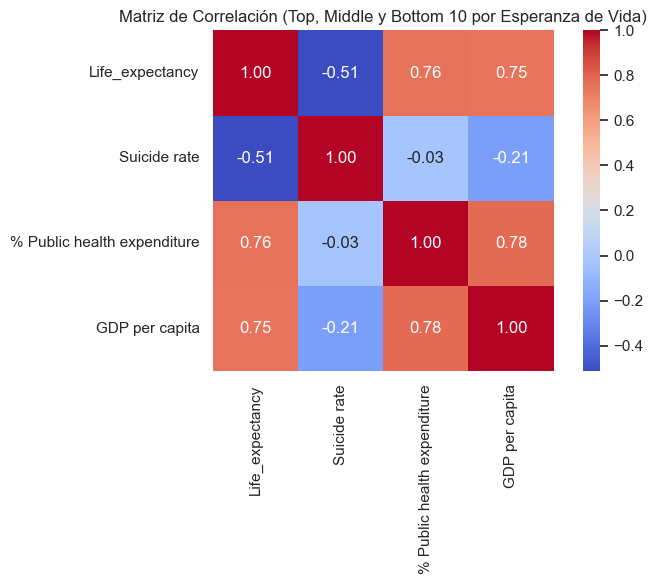

In [518]:
# Correlación para los top, middle y bottom10

# Seleccionar las columnas que te interesan
cols = [
    'Life_expectancy',
    'Suicide rate',
    '% Public health expenditure',
    'GDP per capita'
]

# Calcular matriz de correlación
correlacionestop10 = dfGDPHealth_top_mid_bottom[cols].dropna().corr()

# Mostrar la matriz
display(correlacionestop10)

# Graficar la matriz
plt.figure(figsize=(8, 6))
sns.heatmap(correlacionestop10, annot=True, cmap="coolwarm", fmt=".2f", square=True)
plt.title("Matriz de Correlación (Top, Middle y Bottom 10 por Esperanza de Vida)")
plt.tight_layout()
plt.show()

- EN GDP per capita la correlación(0.75) es fuerte, cuanto más rico es el país, mayor esperanza de vida
- También es fuerte la correlación con el gasto público en sanidad(0.76)
- Como es lógico, también hay una correlación, en este caso negativa(-0.51) con la tasa de suicidios, aunque probablemente también está influenciada a su vez por otros factores.
- En países extremos (muy alta o baja esperanza de vida), el ingreso y la salud pública tienen un impacto más claro y más fuerte sobre la longevidad.
- La tasa de suicidio también influye más negativamente en este grupo reducido, lo que puede indicar que su efecto se intensifica cuando hay otros factores de vulnerabilidad.

#### Scatterplot con la información para el top, bottom y middle 10

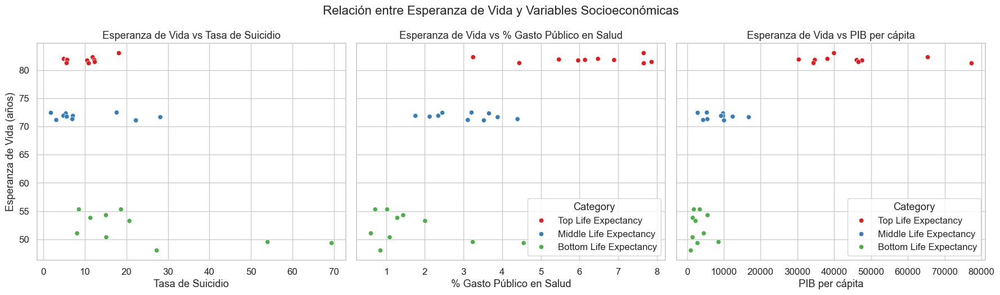

In [519]:
sns.set_theme(style="whitegrid", font_scale=1.1)

# Configurar las variables con etiquetas traducidas
variables = {
    'Suicide rate': 'Tasa de Suicidio',
    '% Public health expenditure': '% Gasto Público en Salud',
    'GDP per capita': 'PIB per cápita'
}

# Crear figura con 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

# Recorrer y graficar cada variable
for ax, (var, label) in zip(axs, variables.items()):
    sns.scatterplot(
        data=dfGDPHealth_top_mid_bottom,
        x=var,
        y='Life_expectancy',
        hue='Category',
        palette='Set1',
        ax=ax
    )
    ax.set_title(f'Esperanza de Vida vs {label}')
    ax.set_xlabel(label)
    ax.set_ylabel('Esperanza de Vida (años)')

# Ajustes finales
plt.tight_layout()
plt.suptitle('Relación entre Esperanza de Vida y Variables Socioeconómicas', fontsize=16, y=1.05)
axs[0].legend(title='Grupo', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

#### Influencia del gasto público en salud sobre la relación entre desigualdad y baja esperanza de vida

In [520]:
df_economicas['% Public health expenditure'].describe()

count    1441.000000
mean        4.146039
std         2.170535
min         0.186194
25%         2.464381
50%         4.003262
75%         5.717493
max         9.276339
Name: % Public health expenditure, dtype: float64

In [521]:
# Crear una nueva columna categórica en función del % de gasto público en salud
df_economicas['nivel_gasto_salud'] = pd.cut(
    df_economicas['% Public health expenditure'],                    # Columna a clasificar
    bins=[0, 1.5, 4.6, df_economicas['% Public health expenditure'].max()],  # Límites de los rangos
    labels=['Bajo', 'Medio', 'Alto']                                 # Etiquetas de los niveles
)

# Mostrar el conteo de países por nivel
print(df_economicas['nivel_gasto_salud'].value_counts())

nivel_gasto_salud
Medio    694
Alto     562
Bajo     185
Name: count, dtype: int64


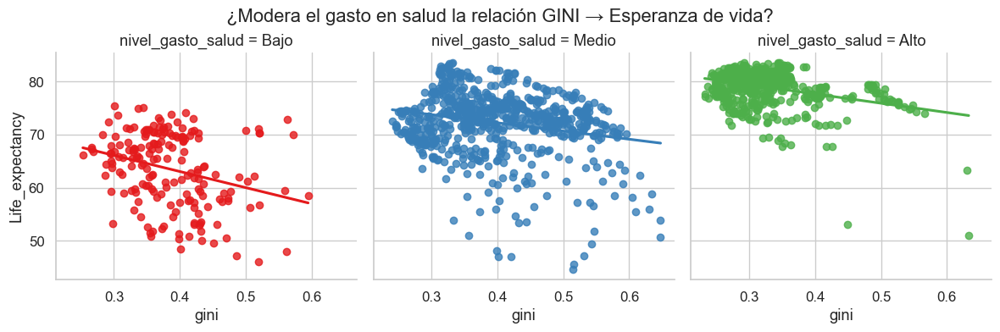

In [522]:
# Lo visualizamos
sns.lmplot(
    data=df_economicas,
    x='gini',
    y='Life_expectancy',
    hue='nivel_gasto_salud',
    col='nivel_gasto_salud',
    palette='Set1',
    ci=None,
    height=4,
    aspect=1
)

plt.subplots_adjust(top=0.85)
plt.suptitle("¿Modera el gasto en salud la relación GINI → Esperanza de vida?")
plt.show()

Se observa que en panel de bajo gasto, la pendiente entre GINI y esperanza de vida es más negativa, más pronunciada, y en el panel de alto gasto, la pendiente es menos negativa o neutra, por lo que efectivamente se confirma la hipótesis de que el gasto público en sanidad actúa como un moderador, amortiguando el efecto negativo de la desigualdad sobre la salud.

### Análisis de la influencia de las crisis económicas en la esperanza de vida

Esperanza de vida en años de crisis: 75.14
Esperanza de vida en años sin crisis: 73.60


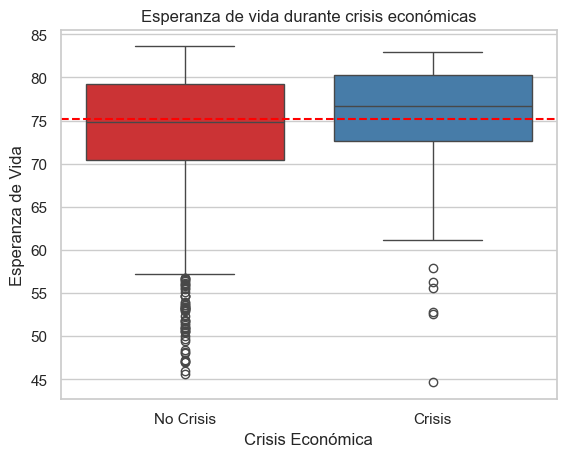

In [584]:
# Calcular la variación porcentual del PIB per cápita
df_economicas["delta_pib"] = (
    df_economicas.sort_values(["Country", "Year"])
    .groupby("Country")["GDP per capita"]
    .pct_change()
)

# Definir crisis como caída del PIB mayor al 2%
df_economicas["crisis"] = df_economicas["delta_pib"] < -0.02

# Promedio de esperanza de vida durante crisis y fuera de crisis
vida_crisis = df_economicas[df_economicas["crisis"] == True]["Life_expectancy"].mean()
vida_no_crisis = df_economicas[df_economicas["crisis"] == False]["Life_expectancy"].mean()

print(f"Esperanza de vida en años de crisis: {vida_crisis:.2f}")
print(f"Esperanza de vida en años sin crisis: {vida_no_crisis:.2f}")

#Lo visualizamos
sns.boxplot(x='crisis', y='Life_expectancy', data=df_economicas, palette='Set1')
plt.axhline(y=vida_crisis, color='red', linestyle='--', label='Crisis Promedio')
plt.title('Esperanza de vida durante crisis económicas')
plt.xlabel('Crisis Económica')
plt.ylabel('Esperanza de Vida')
plt.xticks([0, 1], ['No Crisis', 'Crisis'])
plt.show()

In [524]:
# Calcular el cambio anual en esperanza de vida por país
df_economicas["esperanza_vida_cambio"] = (
    df_economicas.sort_values(["Country", "Year"])
    .groupby("Country")["Life_expectancy"]
    .diff()
)

# Comparar cambios en años de crisis vs no crisis
cambio_crisis = df_economicas[df_economicas["crisis"] == True]["esperanza_vida_cambio"].mean()
cambio_no_crisis = df_economicas[df_economicas["crisis"] == False]["esperanza_vida_cambio"].mean()

print(f"Cambio promedio en esperanza de vida durante crisis: {cambio_crisis:.3f} años")
print(f"Cambio promedio en esperanza de vida fuera de crisis: {cambio_no_crisis:.3f} años")

Cambio promedio en esperanza de vida durante crisis: 0.925 años
Cambio promedio en esperanza de vida fuera de crisis: 0.524 años


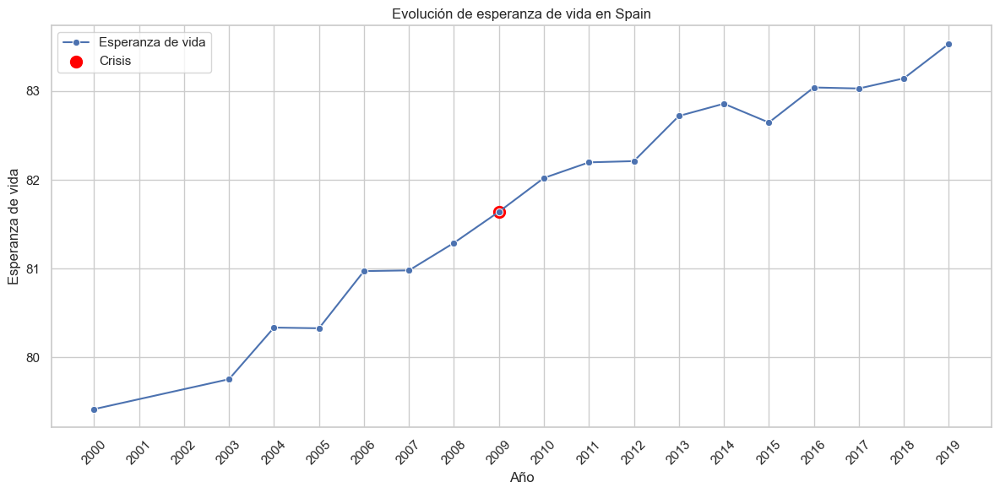

In [585]:
# Filtro por país
pais_ejemplo = 'Spain'
df_pais = df_economicas[df_economicas['Country'] == pais_ejemplo]

# Años de crisis
crisis_years = df_pais[df_pais['crisis'] == True]

# Asegurar que 'Year' sea int
df_pais['Year'] = df_pais['Year'].astype(int)
crisis_years['Year'] = crisis_years['Year'].astype(int)

# Gráfico
plt.figure(figsize=(12, 6))

# Línea del gráfico
sns.lineplot(x='Year', y='Life_expectancy', data=df_pais, marker='o', label='Esperanza de vida')

# Puntos rojos
plt.scatter(
    crisis_years['Year'],
    crisis_years['Life_expectancy'],
    color='red',
    s=100,
    label='Crisis'
)

# Eje X: ticks solo en años enteros
años = df_pais['Year'].unique()
años = np.arange(años.min(), años.max() + 1, 1)
plt.xticks(ticks=años, rotation=45)  # rotación opcional

# Resto del gráfico
plt.title(f'Evolución de esperanza de vida en {pais_ejemplo}')
plt.xlabel('Año')
plt.ylabel('Esperanza de vida')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### Análisis de la pobreza frente a la esperanza de vida

#### Con el dataframe sin descartar países ni agrupaciones y manteniendo nulos

In [526]:
df_poverty.head(2)

,Country,Year,Share below $1 a day,Share below $2.15 a day,Share below $3.65 a day,Share below $6.85 a day,Share below $10 a day,Share below $20 a day,Share below $30 a day,Share below $40 a day,Number below $1 a day,Number below $2.15 a day,Number below $3.65 a day,Number below $6.85 a day,Number below $10 a day,Number below $20 a day,Number below $30 a day,Number below $40 a day,40% of median - share of population below poverty line,50% of median - share of population below poverty line,60% of median - share of population below poverty line,40% of median - total number of people below poverty line,50% of median - total number of people below poverty line,60% of median - total number of people below poverty line,Mean income or consumption per day,Median income or consumption per day,Threshold income or consumption per day marking the poorest decile,Threshold income or consumption per day marking the richest decile,mld,gini,polarization,decile1_share,decile2_share,decile3_share,decile4_share,decile5_share,decile6_share,decile7_share,decile8_share,decile9_share,decile10_share,decile2_thr,decile3_thr,decile4_thr,decile5_thr,decile6_thr,decile7_thr,decile8_thr,income_gap_ratio_40_median,income_gap_ratio_50_median,income_gap_ratio_60_median,poverty_gap_index_40_median,poverty_gap_index_50_median,poverty_gap_index_60_median,avg_shortfall_40_median,avg_shortfall_50_median,avg_shortfall_60_median,total_shortfall_40_median,total_shortfall_50_median,total_shortfall_60_median,income_gap_ratio_100,income_gap_ratio_1000,income_gap_ratio_2000,income_gap_ratio_215,income_gap_ratio_3000,income_gap_ratio_365,income_gap_ratio_4000,income_gap_ratio_685,poverty_gap_index_100,poverty_gap_index_1000,poverty_gap_index_2000,poverty_gap_index_215,poverty_gap_index_3000,poverty_gap_index_365,poverty_gap_index_4000,poverty_gap_index_685,avg_shortfall_100,avg_shortfall_1000,avg_shortfall_2000,avg_shortfall_215,avg_shortfall_3000,avg_shortfall_365,avg_shortfall_4000,avg_shortfall_685,total_shortfall_100,total_shortfall_1000,total_shortfall_2000,total_shortfall_215,total_shortfall_3000,total_shortfall_365,total_shortfall_4000,total_shortfall_685,decile1_avg,decile2_avg,decile3_avg,decile4_avg,decile5_avg,decile6_avg,decile7_avg,decile8_avg,decile9_avg,decile10_avg,bottom50_share,middle40_share,palma_ratio,s80_s20_ratio,p90_p10_ratio,p90_p50_ratio,p50_p10_ratio
1,Albania,2002,0.046371,1.092647,11.388324,52.090965,76.70505,96.52886,98.94813,99.762024,1415,33337,347459,1589301,2340279,2945105,3018917,3043749,3.212283,8.406373,16.020554,98007,256479,488789,8.108229,6.688141,3.501889,13.990763,0.164812,0.317390,0.268982,3.494002,4.859444,5.842059,6.738204,7.653102,8.839459,10.228584,11.984428,14.925079,25.435638,4.370816,5.093828,5.858262,6.687111,7.662466,8.913951,10.652152,17.543550,18.595226,20.580732,0.563548,1.563182,3.297149,0.469335,0.621838,0.825881,45998.117,159488.27,403681.56,43.873215,41.387882,63.13764,17.337124,74.09592,19.966413,80.05450,31.078033,0.020348,31.74660,60.946040,0.189435,73.31651,2.273840,79.863976,16.188852,0.438732,4.138788,12.627528,0.372748,22.228775,0.728774,32.021797,2.128845,620.80597,9685919.0,37189396.0,12426.3060,67106824.0,253219.12,97466320.0,3383376.0,2.833017,3.940148,4.736875,5.463489,6.205310,7.167236,8.293570,9.717249,12.101596,20.623796,28.586811,45.977550,1.215056,4.831625,3.995204,2.092198,1.909572
2,Albania,2005,0.000000,0.591086,7.289305,40.428430,68.45309,95.40567,98.85736,99.546940,0,17800,219516,1217497,2061456,2873129,2977077,2997843,4.095002,8.991532,16.675770,123320,270779,502189,9.165975,7.799791,3.983527,15.433521,0.154413,0.305957,0.254529,3.482536,4.920109,5.977283,6.921183,7.988159,9.037068,10.372144,12.126408,14.833943,24.341167,5.039332,5.949700,6.793219,7.796200,8.827788,10.280450,12.068591,16.876627,20.329166,21.973644,0.691096,1.827905,3.664277,0.526537,0.792816,1.028339,64932.500,214678.00,516420.56,NaN,37.084915,58.72428,15.179814,70.71589,19.209354,77.61802,28.443775,0.000000,25.38577,56.0262

In [527]:
df_life_expec.head(2)

,Country,Year,Life_expectancy
50,Afghanistan,2000,55.2978
51,Afghanistan,2001,55.7981


In [528]:
# Hacer el merge con 'outer' para mantener todas las filas de ambos DataFrames
df_pov_x_life = pd.merge(df_poverty, df_life_expec, on=['Country', 'Year'], how='outer', indicator='_merge')

In [529]:
df_pov_x_life = df_pov_x_life.sort_values(by='Year', ascending=True)
df_pov_x_life.sample(10)

,Country,Year,Share below $1 a day,Share below $2.15 a day,Share below $3.65 a day,Share below $6.85 a day,Share below $10 a day,Share below $20 a day,Share below $30 a day,Share below $40 a day,Number below $1 a day,Number below $2.15 a day,Number below $3.65 a day,Number below $6.85 a day,Number below $10 a day,Number below $20 a day,Number below $30 a day,Number below $40 a day,40% of median - share of population below poverty line,50% of median - share of population below poverty line,60% of median - share of population below poverty line,40% of median - total number of people below poverty line,50% of median - total number of people below poverty line,60% of median - total number of people below poverty line,Mean income or consumption per day,Median income or consumption per day,Threshold income or consumption per day marking the poorest decile,Threshold income or consumption per day marking the richest decile,mld,gini,polarization,decile1_share,decile2_share,decile3_share,decile4_share,decile5_share,decile6_share,decile7_share,decile8_share,decile9_share,decile10_share,decile2_thr,decile3_thr,decile4_thr,decile5_thr,decile6_thr,decile7_thr,decile8_thr,income_gap_ratio_40_median,income_gap_ratio_50_median,income_gap_ratio_60_median,poverty_gap_index_40_median,poverty_gap_index_50_median,poverty_gap_index_60_median,avg_shortfall_40_median,avg_shortfall_50_median,avg_shortfall_60_median,total_shortfall_40_median,total_shortfall_50_median,total_shortfall_60_median,income_gap_ratio_100,income_gap_ratio_1000,income_gap_ratio_2000,income_gap_ratio_215,income_gap_ratio_3000,income_gap_ratio_365,income_gap_ratio_4000,income_gap_ratio_685,poverty_gap_index_100,poverty_gap_index_1000,poverty_gap_index_2000,poverty_gap_index_215,poverty_gap_index_3000,poverty_gap_index_365,poverty_gap_index_4000,poverty_gap_index_685,avg_shortfall_100,avg_shortfall_1000,avg_shortfall_2000,avg_shortfall_215,avg_shortfall_3000,avg_shortfall_365,avg_shortfall_4000,avg_shortfall_685,total_shortfall_100,total_shortfall_1000,total_shortfall_2000,total_shortfall_215,total_shortfall_3000,total_shortfall_365,total_shortfall_4000,total_shortfall_685,decile1_avg,decile2_avg,decile3_avg,decile4_avg,decile5_avg,decile6_avg,decile7_avg,decile8_avg,decile9_avg,decile10_avg,bottom50_share,middle40_share,palma_ratio,s80_s20_ratio,p90_p10_ratio,p90_p50_ratio,p50_p10_ratio,Life_expectancy,_merge
1805,Kazakhstan,2005,0.546866,8.661422,28.441942,61.455452,78.849945,95.747406,98.84287,99.579285,82834.0,1311948.0,4308109.0,9308675.0,11943424.0,14502887.0,14971758.0,15083303.0,9.334662,16.427270,24.100348,1413924.0,2488244.0,3650487.0,7.344752,5.536668,2.269911,14.286648,0.268167,0.398260,0.369327,2.331578,3.617669,4.618866,5.684123,6.874579,8.280273,10.017104,12.444930,16.410099,29.720780,3.029819,3.768195,4.596401,5.536353,6.661563,8.132957,10.302423,24.212072,26.727104,29.11552,2.260115,4.390535,7.016942,0.536217,0.739896,0.967218,758169.8,1841040.8,3530816.0,18.289873,51.301910,68.036100,23.914461,76.873985,30.793158,82.156290,42.866700,0.100021,40.451527,65.142800,2.071332,75.984450,8.758172,81.810640,26.343924,0.182899,5.130191,13.607220,0.514161,23.062197,1.123950,32.862514,2.936369,15150.233,61272044.00,197343970.0,674552.4000,345281630.0,4842100.500,495675260.0,27333704.00,1.712486,2.657088,3.392443,4.174847,5.049208,6.081654,7.357314,9.140492,12.052811,21.829176,23.126814,47.152405,1.828720,7.754071,6.293924,2.580516,2.439017,65.1170,both
3423,Syria,2001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,71.6439,right_only
2391,Mozambique,2009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [530]:
# Recuento de coincidencias
conteo_merge = df_pov_x_life['_merge'].value_counts()
print("Recuento de coincidencias en el merge:")
print(conteo_merge)

# Países únicos antes
total_antes = df_pov_x_life['Country'].nunique()
print(f"Países únicos antes del filtro: {total_antes}")

# Extraer países que se pierden
paises_solo_en_poverty = df_pov_x_life[df_pov_x_life['_merge'] == 'left_only']['Country'].unique().tolist()
paises_solo_en_life = df_pov_x_life[df_pov_x_life['_merge'] == 'right_only']['Country'].unique().tolist()
paises_perdidos = paises_solo_en_poverty + paises_solo_en_life

print(f"Países que se pierden ({len(paises_perdidos)}):")
print(paises_perdidos)

# Filtrar solo los países que están en ambos
df_pov_x_life = df_pov_x_life[df_pov_x_life['_merge'] == 'both'].copy()

# Países únicos después
total_despues = df_pov_x_life['Country'].nunique()
print(f"Países únicos después del filtro ('both'): {total_despues}")

# Eliminar la columna de control
df_pov_x_life.drop(columns=['_merge'], inplace=True)

Recuento de coincidencias en el merge:
_merge
right_only    2444
both          1476
left_only        2
Name: count, dtype: int64
Países únicos antes del filtro: 197
Países que se pierden (175):
['Micronesia (country)', 'Afghanistan', 'Honduras', 'Haiti', 'Guyana', 'Guinea-Bissau', 'Guinea', 'Grenada', 'Ghana', 'Gambia', 'Gabon', 'Fiji', 'Ethiopia', 'Eritrea', 'Iceland', 'Liechtenstein', 'Libya', 'Liberia', 'Lebanon', 'Latvia', 'Laos', 'Kuwait', 'Kiribati', 'Kenya', 'Kazakhstan', 'Jordan', 'Japan', 'Jamaica', 'Israel', 'Iraq', 'Iran', 'India', 'Equatorial Guinea', 'Egypt', 'Cambodia', 'Burundi', 'Burkina Faso', 'Bulgaria', 'Brunei', 'Brazil', 'Botswana', 'Bosnia and Herzegovina', 'Bhutan', 'Benin', 'Belize', 'Barbados', 'Bahrain', 'Bahamas', 'Azerbaijan', 'Cameroon', 'Cape Verde', 'Cayman Islands', 'East Timor', 'Dominica', 'Djibouti', 'Democratic Republic of Congo', 'Czechia', 'Cyprus', 'Cuba', "Cote d'Ivoire", 'Congo', 'Comoros', 'China', 'Chad', 'Central African Republic', 'Madagasca

In [531]:
# Selección de columnas útiles
pobreza_cols = [ 
    'Share below $2.15 a day', 'Share below $3.65 a day', 'bottom50_share',
    'middle40_share', 'palma_ratio', 's80_s20_ratio', 'p90_p10_ratio',
    'p90_p50_ratio', 'p50_p10_ratio', 'gini', 'mld'
]

# Columnas base que también vamos a conservar
columnas_base = ['Country', 'Year', 'Life_expectancy']
columnas_utiles = columnas_base + pobreza_cols

# Filtrar el DataFrame
df_pov_x_life = df_pov_x_life[columnas_utiles]

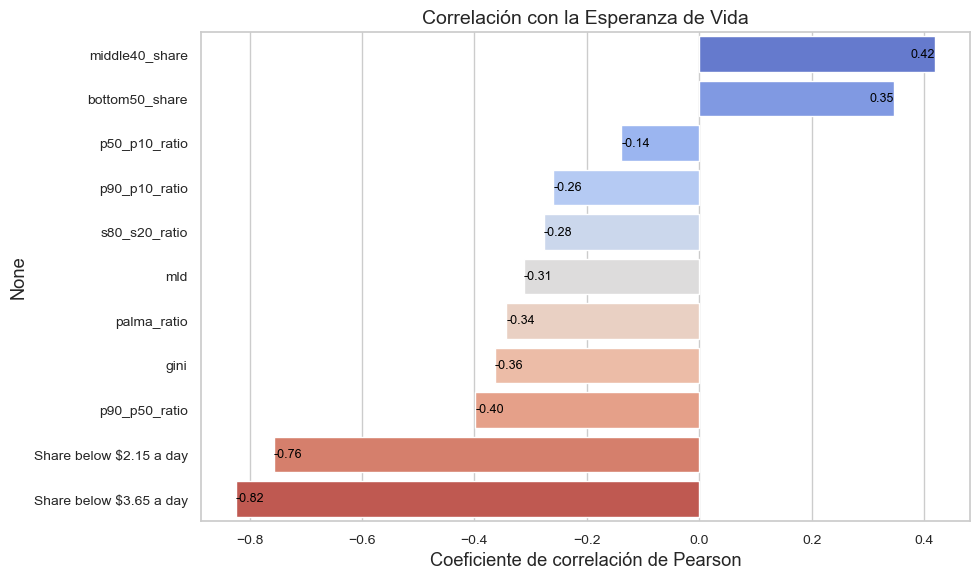

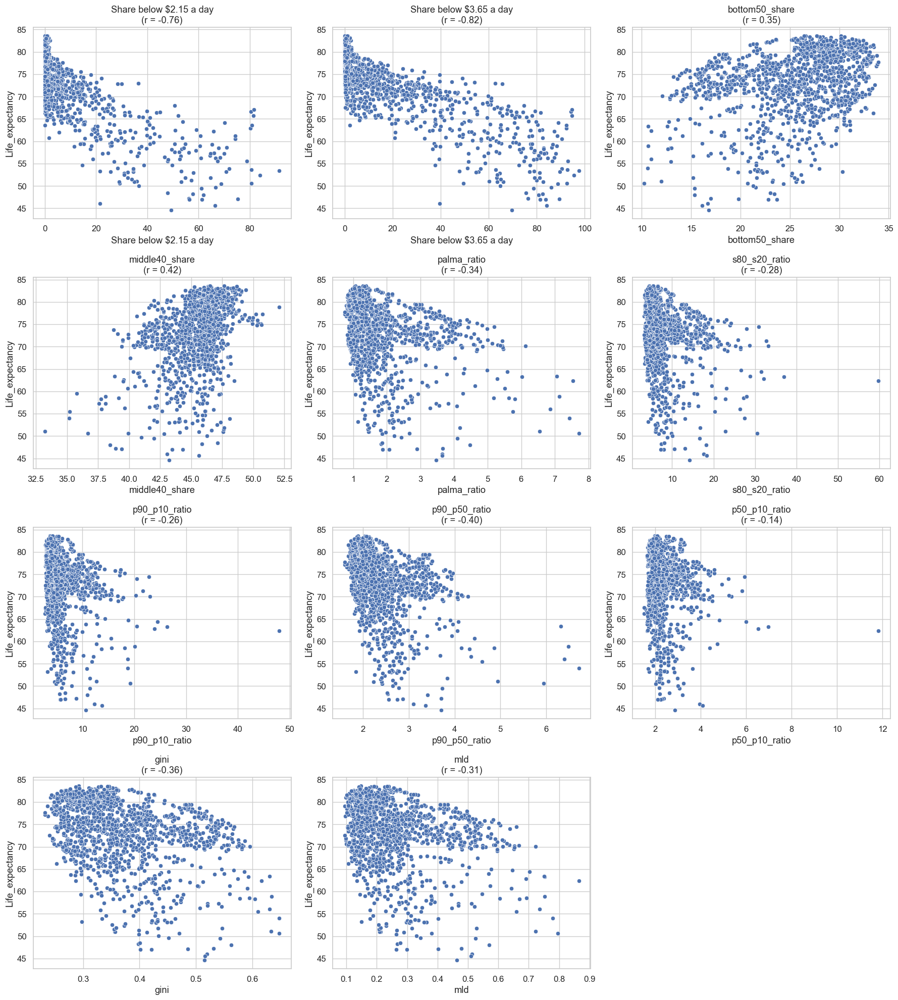

In [532]:

pobreza_cols = [
    'Share below $2.15 a day', 'Share below $3.65 a day', 'bottom50_share',
    'middle40_share', 'palma_ratio', 's80_s20_ratio', 'p90_p10_ratio',
    'p90_p50_ratio', 'p50_p10_ratio', 'gini', 'mld'
]
vida_col = 'Life_expectancy'

# Filtrar columnas numéricas dentro del subset relevante
subset = df_pov_x_life[pobreza_cols + [vida_col]].select_dtypes(include='number')

# Calcular correlaciones con Esperanza de Vida
correlation_matrix = subset.corr(method='pearson', min_periods=2)
cor_with_life_expectancy = correlation_matrix[vida_col].drop(vida_col).sort_values(ascending=False)

# GRÁFICO DE BARRAS
plt.figure(figsize=(10, 6))
sns.barplot(
    x=cor_with_life_expectancy.values,
    y=cor_with_life_expectancy.index,
    palette="coolwarm"
)
plt.title("Correlación con la Esperanza de Vida", fontsize=14)
plt.xlabel("Coeficiente de correlación de Pearson")
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

for index, value in enumerate(cor_with_life_expectancy.values):
    plt.text(value, index, f'{value:.2f}', va='center', ha='left' if value < 0 else 'right',
             color='black', fontsize=9)

plt.tight_layout()
plt.show()

# SCATTER PLOTS
num_vars = len(pobreza_cols)
rows = (num_vars // 3) + 1
fig, axs = plt.subplots(nrows=rows, ncols=3, figsize=(18, 5 * rows))
axs = axs.flatten()

for i, col in enumerate(pobreza_cols):
    plot_data = df_pov_x_life[[col, vida_col]].dropna()
    sns.scatterplot(data=plot_data, x=col, y=vida_col, ax=axs[i])
    corr_val = plot_data[col].corr(plot_data[vida_col])
    axs[i].set_title(f'{col}\n(r = {corr_val:.2f})')

for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

Variables con correlación positiva con esperanza de vida:
bottom50_share y middle40_share:

Cuando la mitad más pobre (o el 40% medio) de la población tiene una mayor participación en el ingreso, la esperanza de vida es más alta. Serían sociedades más igualitarias, donde la riqueza está mejor distribuida y más personas tienen acceso a recursos que influyen en salud: nutrición,atención médica, educación, etc.


Variables con correlación negativa con esperanza de vida:
palma_ratio, s80_s20_ratio, p90_p10_ratio, p90_p50_ratio, p50_p10_ratio. 
Estas métricas capturan la desigualdad, mostrando cuánto más ganan los más ricos respecto a los más pobres. Su correlación negativa sugiere que a mayor desigualdad, menor esperanza de vida.
(Peor acceso a servicios de salud entre los pobres, Mayor estrés social...)

Tambien GINI y MLD:
- GINI: Tiene una correlación negativa con esperanza de vida. A mayor desigualdad general, peor es la salud promedio de la población.
- MLD (Mean Log Deviation):También mide la desigualdad, pero con más peso en la parte baja de la distribución.Si MLD se correlaciona negativamente, quiere decir que una mayor privación en los más pobres afecta mucho la esperanza de vida del país o región.

Conclusión General
La esperanza de vida no solo depende del nivel de riqueza de un país, sino de cómo esa riqueza está distribuida.

Incluso en países relativamente ricos, si hay mucha desigualdad, la calidad de vida y la salud pueden verse gravemente afectadas en sectores amplios de la población. Esto se refleja directamente en una menor esperanza de vida promedio.

## **7) Variables Sanitarias - TFM Salud Pública** 

***Análisis de los datasets Tasa de vacunacion y causas de muerte para ver la relación con la Esperanza de Vida en distintos tipos de países, tanto desarrollados como subdesarrollados.*** 

In [533]:
exploracion_inicial(df_esperanza_vida_x_causa_muerte, tipo= 'simple')

¿Cuántas filas y columnas hay en el conjunto de datos?
	Hay 3,840 filas y 34 columnas.
##########################################################################################
¿Cuáles son las primeras dos filas del conjunto de datos?


,Country,Year,Life_expectancy,Deaths - Meningitis - Sex: Both - Age: All Ages (Number),Deaths - Alzheimer's disease and other dementias - Sex: Both - Age: All Ages (Number),Deaths - Parkinson's disease - Sex: Both - Age: All Ages (Number),Deaths - Nutritional deficiencies - Sex: Both - Age: All Ages (Number),Deaths - Malaria - Sex: Both - Age: All Ages (Number),Deaths - Drowning - Sex: Both - Age: All Ages (Number),Deaths - Interpersonal violence - Sex: Both - Age: All Ages (Number),Deaths - Maternal disorders - Sex: Both - Age: All Ages (Number),Deaths - HIV/AIDS - Sex: Both - Age: All Ages (Number),Deaths - Drug use disorders - Sex: Both - Age: All Ages (Number),Deaths - Tuberculosis - Sex: Both - Age: All Ages (Number),Deaths - Cardiovascular diseases - Sex: Both - Age: All Ages (Number),Deaths - Lower respiratory infections - Sex: Both - Age: All Ages (Number),Deaths - Neonatal disorders - Sex: Both - Age: All Ages (Number),Deaths - Alcohol use disorders - Sex: Both - Age: All Ages (Number),Deaths - Self-harm - Sex: Both - Age: All Ages (Number),Deaths - Exposure to forces of nature - Sex: Both - Age: All Ages (Number),Deaths - Diarrheal diseases - Sex: Both - Age: All Ages (Number),Deaths - Environmental heat and cold exposure - Sex: Both - Age: All Ages (Number),Deaths - Neoplasms - Sex: Both - Age: All Ages (Number),Deaths - Conflict and terrorism - Sex: Both - Age: All Ages (Number),Deaths - Diabetes mellitus - Sex: Both - Age: All Ages (Number),Deaths - Chronic kidney disease - Sex: Both - Age: All Ages (Number),Deaths - Poisonings - Sex: Both - Age: All Ages (Number),Deaths - Protein-energy malnutrition - Sex: Both - Age: All Ages (Number),Deaths - Road injuries - Sex: Both - Age: All Ages (Number),Deaths - Chronic respiratory diseases - Sex: Both - Age: All Ages (Number),Deaths - Cirrhosis and other chronic liver diseases - Sex: Both - Age: All Ages (Number),Deaths - Digestive diseases - Sex: Both - Age: All Ages (Number),"Deaths - Fire, heat, and hot substances - Sex: Both - Age: All Ages (Number)",Deaths - Acute hepatitis - Sex: Both - Age: All Ages (Number)
0,Afghanistan,2000,55.2978,3105.0,1291.0,416.0,3060.0,263.0,2048.0,2871.0,4271.0,97.0,186.0,5864.0,53919.0,32395.0,22920.0,99.0,1137.0,0.0,11323.0,52.0,13977.0,5429.0,2515.0,4182.0,499.0,3013.0,6581.0,7471.0,3249.0,6206.0,465.0,4334.0
3080,Senegal,2000,56.9434,2472.0,590.0,159.0,970.0,20300.0,288.0,96.0,1254.0,2825.0,9.0,3733.0,9355.0,7754.0,10285.0,47.0,622.0,0.0,9947.0,52.0,3875.0,81.0,1279.0,1426.0,186.0,935.0,1220.0,1691.0,1583.0,2883.0,220.0,110.0


##########################################################################################


### Vacunaciones

#### Creo df_life_x_vac para tener mas datos a la hora del analisis

In [534]:
# Hacer el merge con 'outer' para mantener todas las filas de ambos DataFrames
df_life_x_vac = pd.merge(df_life_expec, df_vaccination, on=['Country', 'Year'], how='outer', indicator='_merge')

In [535]:
# Recuento de coincidencias
conteo_merge = df_life_x_vac['_merge'].value_counts()
print("Recuento de coincidencias en el merge:")
print(conteo_merge)

# Países únicos antes
total_antes = df_life_x_vac['Country'].nunique()
print(f"Países únicos antes del filtro: {total_antes}")

# Extraer países que se pierden
paises_solo_en_vida = df_life_x_vac[df_life_x_vac['_merge'] == 'left_only']['Country'].unique().tolist()
paises_solo_en_homicidios = df_life_x_vac[df_life_x_vac['_merge'] == 'right_only']['Country'].unique().tolist()
paises_perdidos = paises_solo_en_vida + paises_solo_en_homicidios

print(f"Países que se pierden ({len(paises_perdidos)}):")
print(paises_perdidos)

# Filtrar solo los países que están en ambos
df_prueba = df_life_x_vac[df_life_x_vac['_merge'] == 'both'].copy()

# Países únicos después
total_despues = df_prueba['Country'].nunique()
print(f"Países únicos después del filtro ('both'): {total_despues}")

# Eliminar la columna de control
df_life_x_vac.drop(columns=['_merge'], inplace=True)

Recuento de coincidencias en el merge:
_merge
both          3801
left_only      119
right_only      20
Name: count, dtype: int64
Países únicos antes del filtro: 197
Países que se pierden (9):
['Anguilla', 'Aruba', 'Cayman Islands', 'East Timor', 'Liechtenstein', 'Montenegro', 'South Sudan', 'Taiwan', 'Micronesia (country)']
Países únicos después del filtro ('both'): 191


In [536]:
exploracion_inicial(df_life_x_vac, tipo='simple')

¿Cuántas filas y columnas hay en el conjunto de datos?
	Hay 3,940 filas y 14 columnas.
##########################################################################################
¿Cuáles son las primeras dos filas del conjunto de datos?


,Country,Year,Life_expectancy,BCG (% of one-year-olds immunized),HepB3 (% of one-year-olds immunized),Hib3 (% of one-year-olds immunized),IPV1 (% of one-year-olds immunized),MCV1 (% of one-year-olds immunized),PCV3 (% of one-year-olds immunized),Pol3 (% of one-year-olds immunized),RCV1 (% of one-year-olds immunized),RotaC (% of one-year-olds immunized),YFV (% of one-year-olds immunized),DTP3 (% of one-year-olds immunized)
0,Afghanistan,2000,55.2978,30.0,NaN,NaN,NaN,27.0,NaN,24.0,NaN,NaN,NaN,24.0
1,Afghanistan,2001,55.7981,43.0,NaN,NaN,NaN,37.0,NaN,35.0,NaN,NaN,NaN,33.0


##########################################################################################


In [537]:
#Renombro las columnas para que sea mas sencillo el analisis

df_life_x_vac = df_life_x_vac.rename(columns={
    'BCG (% of one-year-olds immunized)': 'BCG',
    'HepB3 (% of one-year-olds immunized)': 'HepB3',
    'Hib3 (% of one-year-olds immunized)': 'Hib3',
    'IPV1 (% of one-year-olds immunized)': 'IPV1',
    'MCV1 (% of one-year-olds immunized)': 'MCV1',
    'PCV3 (% of one-year-olds immunized)': 'PCV3',
    'Pol3 (% of one-year-olds immunized)': 'Pol3',
    'RCV1 (% of one-year-olds immunized)': 'RCV1',
    'RotaC (% of one-year-olds immunized)': 'Rotac',
    'YFV (% of one-year-olds immunized)': 'YFV',
    'DTP3 (% of one-year-olds immunized)': 'DTP3'
})

In [538]:
df_life_x_vac.head(1)

,Country,Year,Life_expectancy,BCG,HepB3,Hib3,IPV1,MCV1,PCV3,Pol3,RCV1,Rotac,YFV,DTP3
0,Afghanistan,2000,55.2978,30.0,NaN,NaN,NaN,27.0,NaN,24.0,NaN,NaN,NaN,24.0


#### Para facilitar la comprension pongo una lista de las vacunas y su correspondiente enfermedad.

HepB3 - Hepatitis B
Hib3 - Meningitis, neumonia y epiglotitis
IPV1 - Poliomielitis (primera dosis)
MCV1 - Sarampión
PCV3 - Neumococo
Pol3 - Poliomielitis (tercera dosis)
RCV1 - Rubéola
RotaC - Rotavirus (diarrea severa)
YFV - Fiebre amarilla
DTP3 - Difteria, tétanos y tos ferina (pertussis)

Se procede a contestar las preguntas asociadas a la hipotesis:
"Los países con alta cobertura de vacunación y baja proporción de muertes por enfermedades transmisibles presentan una esperanza de vida significativamente mayor, independientemente de su nivel de ingreso o carga de enfermedades no transmisibles."

#### 1.¿Qué vacunas muestran mayor correlación con aumentos en la esperanza de vida?

In [539]:
# Lista de columnas de vacunación
columnas_vacunacion = [
    'HepB3', 'Hib3', 'IPV1', 'MCV1', 'PCV3',
    'Pol3', 'RCV1', 'Rotac', 'YFV', 'DTP3'
]

# Diccionario para guardar las correlaciones
correlaciones_spearman = {}

# Iterar y calcular correlaciones
for columna in columnas_vacunacion:
    datos = df_life_x_vac[['Life_expectancy', columna]].dropna()

    if datos.empty:
        print(f"Sin datos suficientes para graficar Life_expectancy vs {columna}")
        continue

    # Correlación de Spearman
    corr = datos['Life_expectancy'].corr(datos[columna], method='spearman')
    correlaciones_spearman[columna] = corr

# Mostrar los resultados ordenados
correlaciones_series = pd.Series(correlaciones_spearman).sort_values(ascending=False)
print(correlaciones_series)

IPV1     0.651860
DTP3     0.567157
Pol3     0.556588
MCV1     0.525335
Hib3     0.435953
HepB3    0.392613
PCV3     0.367025
YFV      0.193544
Rotac    0.118023
RCV1     0.083572
dtype: float64


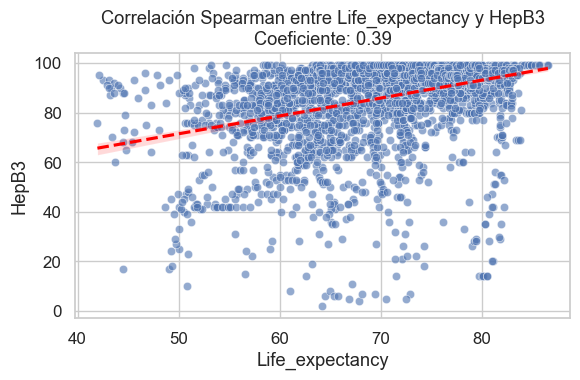

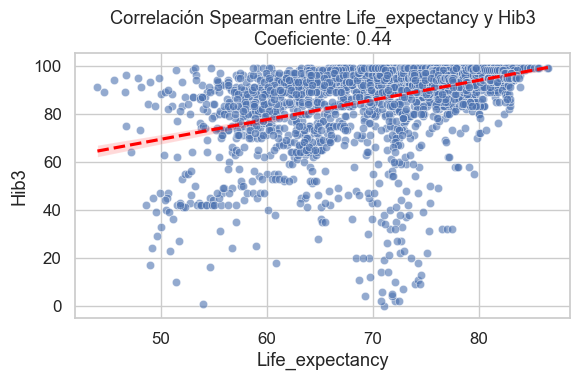

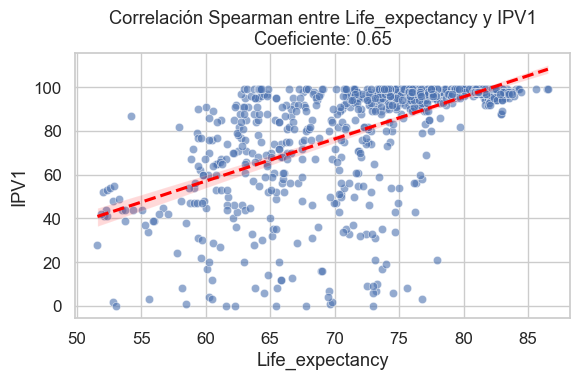

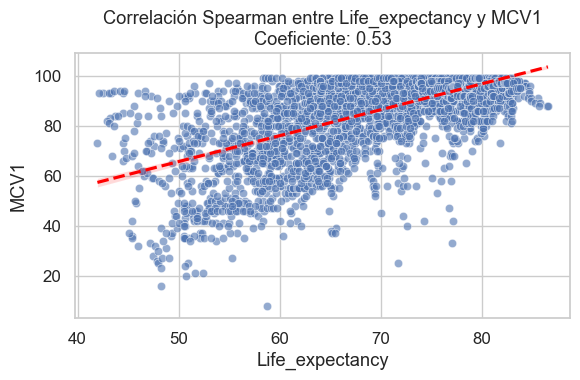

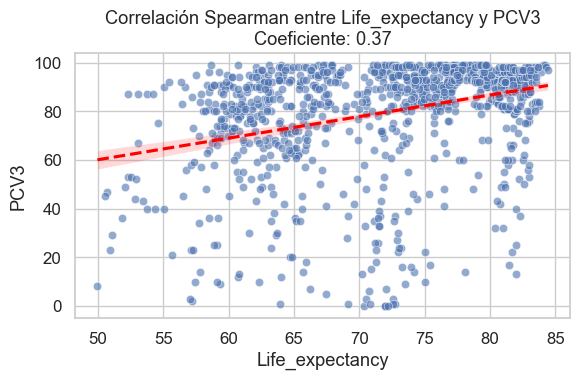

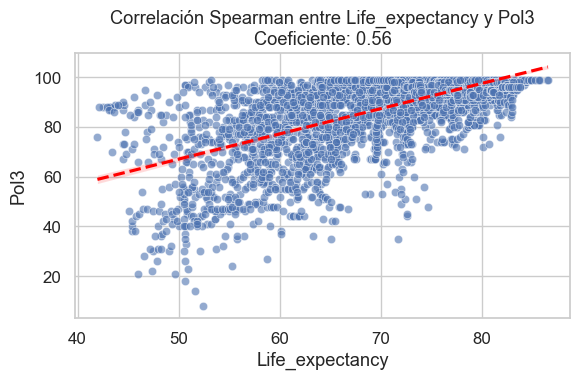

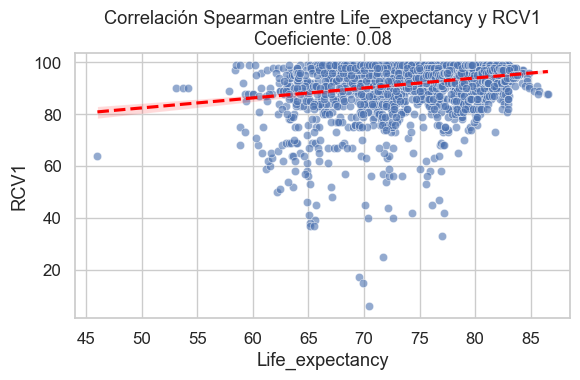

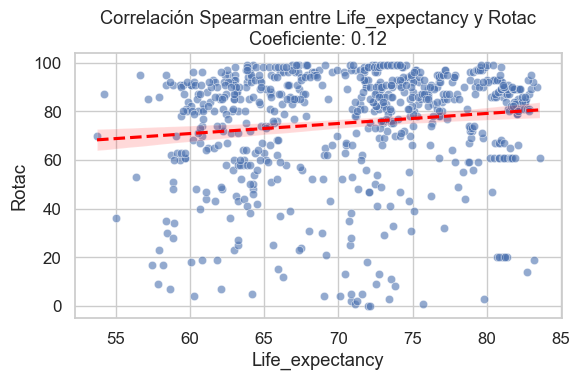

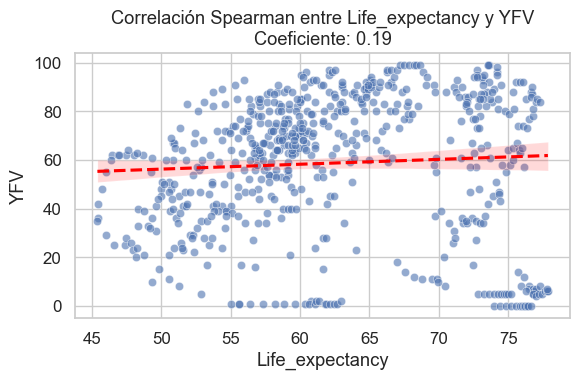

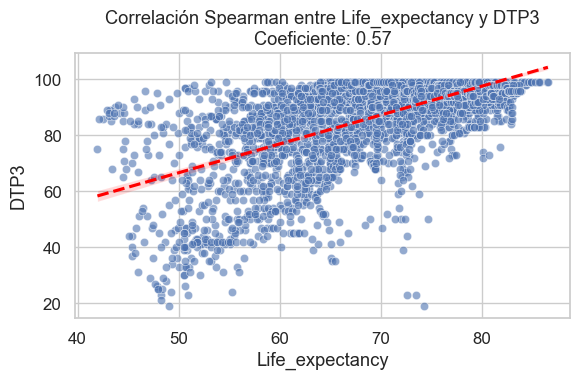

In [540]:
# Lista de columnas de vacunación
columnas_vacunacion = [
    'HepB3', 'Hib3', 'IPV1', 'MCV1', 'PCV3',
    'Pol3', 'RCV1', 'Rotac', 'YFV', 'DTP3'
]

# Iterar y graficar con método de Spearman
for columna in columnas_vacunacion:
    datos = df_life_x_vac[['Life_expectancy', columna]].dropna()

    if datos.empty:
        print(f"Sin datos suficientes para graficar Life_expectancy vs {columna}")
        continue

    # Correlación de Spearman
    corr = datos['Life_expectancy'].corr(datos[columna], method='spearman')

    plt.figure(figsize=(6, 4))
    sns.scatterplot(data=datos, x='Life_expectancy', y=columna, alpha=0.6)
    sns.regplot(data=datos, x='Life_expectancy', y=columna, scatter=False, color='red', line_kws={"linestyle": "--"})
    plt.title(f"Correlación Spearman entre Life_expectancy y {columna}\nCoeficiente: {corr:.2f}")
    plt.xlabel("Life_expectancy")
    plt.ylabel(columna)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

HepB3 - Hepatitis B: Refleja una relación positiva significativa, A medida que aumenta la cobertura vacunal, la esperanza de vida también tiende a aumentar. Esto sí tiene sentido causal plausible, ya que estas vacunas (como DTP3, Polio, Hib, etc.) previenen enfermedades infantiles mortales, lo que reduce la mortalidad temprana y mejora los promedios de esperanza de vida.

Hib3 - Meningitis, neumonia y epiglotitis, igual a hepatitis B

IPV1 - Poliomielitis (primera dosis): igual a hepatitis B

MCV1 - Sarampión: igual a hepatitis B

PCV3 - Neumococo : igual a hepatitis B

Pol3 - Poliomielitis (tercera dosis) : igual a hepatitis B

RCV1 - Rubéola: igual a hepatitis B

RotaC - Rotavirus (diarrea severa): igual a hepatitis B

YFV - Fiebre amarilla: No hay una relación fuerte ni consistente entre la esperanza de vida y la vacunación contra la fiebre amarilla. De hecho, muchos países con alta esperanza de vida no vacunan contra la YFV, lo cual explica los valores bajos o nulos. La correlación negativa puede ser engañosa, ya que refleja más bien la geografía o el riesgo epidémico, no una relación causal entre vacunación y longevidad.

DTP3 - Difteria, tétanos y tos ferina (pertussis) : igual a hepatitis B.

#### 2. ¿Existe un umbral de cobertura vacunal (por ejemplo, 90%) a partir del cual se observa una mejora significativa en la esperanza de vida?

In [541]:
# Calcular promedio de vacunación
df_life_x_vac['CoberturaVacPromedio'] = df_life_x_vac[columnas_vacunacion].mean(axis=1)

# Filtrar columnas necesarias y eliminar nulos
df_plot_bins = df_life_x_vac[['CoberturaVacPromedio', 'Life_expectancy']].dropna()

# Agrupar por intervalos de cobertura
df_plot_bins['GrupoCobertura'] = pd.cut(df_plot_bins['CoberturaVacPromedio'], bins=[0, 70, 80, 85, 90, 95, 100])

# Calcular media de esperanza de vida por grupo
grouped = df_plot_bins.groupby('GrupoCobertura')['Life_expectancy'].mean().reset_index()

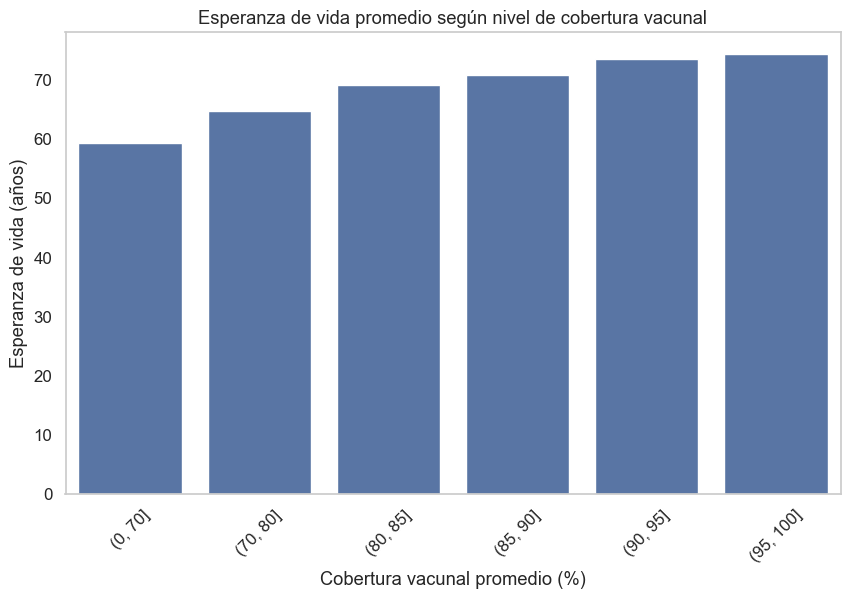

In [542]:
# Graficamos
plt.figure(figsize=(10, 6))
sns.barplot(data=grouped, x='GrupoCobertura', y='Life_expectancy')
plt.title('Esperanza de vida promedio según nivel de cobertura vacunal')
plt.xlabel('Cobertura vacunal promedio (%)')
plt.ylabel('Esperanza de vida (años)')
plt.xticks(rotation=45)
plt.grid(False)
plt.show()

A medida que aumenta la cobertura vacunal promedio, también lo hace la esperanza de vida promedio.

Los países con menos del 70% de cobertura vacunal tienen una esperanza de vida de alrededor de 59 años.

En cambio, los países con más del 95% de cobertura superan los 74 años de esperanza de vida promedio.

Conclusión:
Este patrón sugiere una relación positiva entre la cobertura vacunal y la esperanza de vida: más cobertura vacunal suele estar asociada a una mayor longevidad poblacional.


#### 3.¿En cuánto tiempo se refleja el efecto de una campaña masiva de vacunación en los indicadores de esperanza de vida?

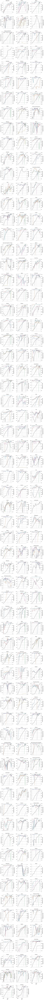

In [ ]:
# Lista de columnas de vacunación
columnas_vacunacion = [
    'HepB3', 'Hib3', 'IPV1', 'MCV1', 'PCV3',
    'Pol3', 'RCV1', 'Rotac', 'YFV', 'DTP3'
]

# Transformar a formato largo
df_vacunas_largo = pd.melt(
    df_life_x_vac,
    id_vars=['Country', 'Year', 'Life_expectancy'],
    value_vars=columnas_vacunacion,
    var_name='Vacuna',
    value_name='Cobertura (%)'
)

# Crear el FacetGrid por país
g = sns.FacetGrid(df_vacunas_largo, col='Country', col_wrap=3, height=4, sharey=False)

# Función para trazar cobertura vacunal y esperanza de vida
def plot_lines(data, **kwargs):
    sns.lineplot(data=data, x='Year', y='Cobertura (%)', hue='Vacuna', legend=False, **kwargs)
    ax2 = plt.gca().twinx()
    sns.lineplot(data=data, x='Year', y='Life_expectancy', color='black', linestyle='--', ax=ax2)
    ax2.set_ylabel('Esperanza de vida', color='black')

# Aplicar función de graficado
g.map_dataframe(plot_lines)
g.set_titles("{col_name}")
g.set_axis_labels("Año", "Cobertura vacunal (%)")
plt.tight_layout()
plt.show()

Una campaña masiva de vacunación no genera un salto inmediato en la esperanza de vida, pero contribuye de forma significativa a su mejora en el mediano plazo (3–5 años). La tendencia ascendente sostenida en cobertura vacunal es consistente con aumentos estables en la longevidad, particularmente cuando se combina con mejoras en otros determinantes sociales y sanitarios.

#### 4.¿Qué países han logrado aumentos notables en esperanza de vida coincidiendo con mejoras en la cobertura vacunal?

In [544]:
# Crear df del año 2000 y 2019
df_2000 = df_life_x_vac[df_life_x_vac['Year'] == 2000].copy()
df_2019 = df_life_x_vac[df_life_x_vac['Year'] == 2019].copy()

# Asegurarse de tener el promedio de vacunación
columnas_vacunacion = ['HepB3', 'Hib3', 'IPV1', 'MCV1', 'PCV3', 'Pol3', 'RCV1', 'Rotac', 'YFV', 'DTP3']
df_2000['CoberturaVacPromedio'] = df_2000[columnas_vacunacion].mean(axis=1)
df_2019['CoberturaVacPromedio'] = df_2019[columnas_vacunacion].mean(axis=1)

# Unir por país
comparacion = pd.merge(
    df_2000[['Country', 'Life_expectancy', 'CoberturaVacPromedio']],
    df_2019[['Country', 'Life_expectancy', 'CoberturaVacPromedio']],
    on='Country',
    suffixes=('_2000', '_2019')
)

# Calcular diferencias
comparacion['Delta_LifeExp'] = comparacion['Life_expectancy_2019'] - comparacion['Life_expectancy_2000']
comparacion['Delta_Cobertura'] = comparacion['CoberturaVacPromedio_2019'] - comparacion['CoberturaVacPromedio_2000']

# Ordenar por mayor mejora conjunta
df_top_cambios = comparacion.sort_values(by=['Delta_LifeExp', 'Delta_Cobertura'], ascending=False)

# Ver top 10 países con mejoras simultáneas
print(df_top_cambios[['Country', 'Delta_LifeExp', 'Delta_Cobertura']].head(10))

          Country  Delta_LifeExp  Delta_Cobertura
105        Malawi        19.6007        19.444444
146        Rwanda        19.3078        13.000000
195        Zambia        17.5614         2.888889
196      Zimbabwe        16.6061         8.833333
4          Angola        16.4248        23.750000
61       Ethiopia        15.2999        26.291667
157  Sierra Leone        15.2046        50.444444
29        Burundi        14.8372        18.555556
184        Uganda        14.6498        35.958333
175      Tanzania        14.6262        14.000000


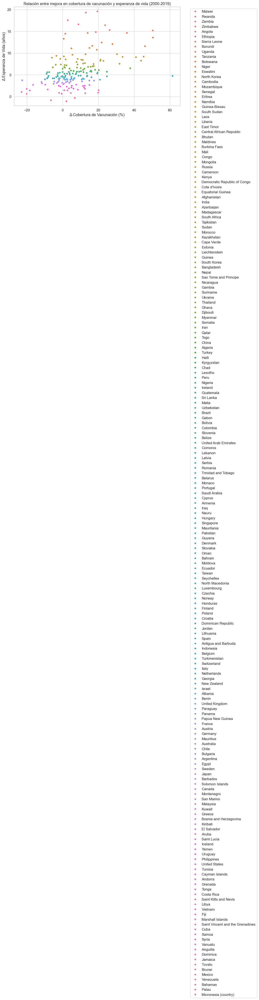

In [545]:
# Graficamos

plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df_top_cambios,
    x='Delta_Cobertura',
    y='Delta_LifeExp',
    hue='Country'
)
plt.title('Relación entre mejora en cobertura de vacunación y esperanza de vida (2000-2019)')
plt.xlabel('Δ Cobertura de Vacunación (%)')
plt.ylabel('Δ Esperanza de Vida (años)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

Observaciones clave:
La mayoría de los países se concentran en el cuadrante superior derecho, lo que sugiere una relación positiva:
más cobertura vacunal → más esperanza de vida.

Algunos países tienen un gran aumento de esperanza de vida (por ejemplo, 10 a 17 años), incluso cuando la mejora en cobertura vacunal no fue muy alta.
Esto podría indicar que otros factores también influyeron (como inversión en salud, reducción de conflictos, crecimiento económico, etc.).

Un pequeño grupo de países muestra caída o estancamiento en cobertura vacunal y esperanza de vida, situándose en la parte izquierda o baja del gráfico.
En muchos casos, estos países pueden estar afectados por inestabilidad política, pobreza extrema o crisis humanitarias.

Conclusión:
Este gráfico respalda la hipótesis de que una mayor cobertura vacunal se asocia con una mejora en la esperanza de vida. Sin embargo, la relación no es perfectamente lineal y está modulada por muchos otros factores estructurales y sociales.

### Causas de Muerte
A partir de aqui contestaremos preguntas sobre el df_esperanza_vida_x_causa_muerte


#### Separamos las enfermedades por grupos

In [546]:
# Enfermedades transmisibles
causas_transmisibles = [
    'Deaths - Meningitis - Sex: Both - Age: All Ages (Number)',
    'Deaths - Malaria - Sex: Both - Age: All Ages (Number)',
    'Deaths - Maternal disorders - Sex: Both - Age: All Ages (Number)',
    'Deaths - HIV/AIDS - Sex: Both - Age: All Ages (Number)',
    'Deaths - Tuberculosis - Sex: Both - Age: All Ages (Number)',
    'Deaths - Lower respiratory infections - Sex: Both - Age: All Ages (Number)',
    'Deaths - Neonatal disorders - Sex: Both - Age: All Ages (Number)',
    'Deaths - Diarrheal diseases - Sex: Both - Age: All Ages (Number)',
    'Deaths - Acute hepatitis - Sex: Both - Age: All Ages (Number)'
]

# Enfermedades no transmisibles
causas_no_transmisibles = [
    'Deaths - Alzheimer\'s disease and other dementias - Sex: Both - Age: All Ages (Number)',
    'Deaths - Parkinson\'s disease - Sex: Both - Age: All Ages (Number)',
    'Deaths - Nutritional deficiencies - Sex: Both - Age: All Ages (Number)',
    'Deaths - Cardiovascular diseases - Sex: Both - Age: All Ages (Number)',
    'Deaths - Neoplasms - Sex: Both - Age: All Ages (Number)',
    'Deaths - Diabetes mellitus - Sex: Both - Age: All Ages (Number)',
    'Deaths - Chronic kidney disease - Sex: Both - Age: All Ages (Number)',
    'Deaths - Chronic respiratory diseases - Sex: Both - Age: All Ages (Number)',
    'Deaths - Cirrhosis and other chronic liver diseases - Sex: Both - Age: All Ages (Number)',
    'Deaths - Digestive diseases - Sex: Both - Age: All Ages (Number)',
    'Deaths - Protein-energy malnutrition - Sex: Both - Age: All Ages (Number)'
]

# Causas externas
causas_externas = [
    'Deaths - Drowning - Sex: Both - Age: All Ages (Number)',
    'Deaths - Interpersonal violence - Sex: Both - Age: All Ages (Number)',
    'Deaths - Drug use disorders - Sex: Both - Age: All Ages (Number)',
    'Deaths - Alcohol use disorders - Sex: Both - Age: All Ages (Number)',
    'Deaths - Self-harm - Sex: Both - Age: All Ages (Number)',
    'Deaths - Exposure to forces of nature - Sex: Both - Age: All Ages (Number)',
    'Deaths - Environmental heat and cold exposure - Sex: Both - Age: All Ages (Number)',
    'Deaths - Conflict and terrorism - Sex: Both - Age: All Ages (Number)',
    'Deaths - Poisonings - Sex: Both - Age: All Ages (Number)',
    'Deaths - Road injuries - Sex: Both - Age: All Ages (Number)',
    'Deaths - Fire, heat, and hot substances - Sex: Both - Age: All Ages (Number)'
]

#### 1.¿Qué tipo de causa de muerte (transmisible, no transmisible, externa) está más asociada a una menor esperanza de vida a nivel global?

In [547]:
df_esperanza_vida_x_causa_muerte['Muertes_Transmisibles'] = df_esperanza_vida_x_causa_muerte[causas_transmisibles].sum(axis=1)
df_esperanza_vida_x_causa_muerte['Muertes_No_Transmisibles'] = df_esperanza_vida_x_causa_muerte[causas_no_transmisibles].sum(axis=1)
df_esperanza_vida_x_causa_muerte['Muertes_Externas'] = df_esperanza_vida_x_causa_muerte[causas_externas].sum(axis=1)

In [548]:
columnas_correlacion = [
    'Muertes_Transmisibles',
    'Muertes_No_Transmisibles',
    'Muertes_Externas',
    'Life_expectancy'
]

# Filtrar y calcular correlaciones Spearman con la esperanza de vida
df_cor = df_esperanza_vida_x_causa_muerte[columnas_correlacion].dropna()
correlaciones = df_cor.corr(method='spearman')['Life_expectancy'].drop('Life_expectancy')

# Mostrar resultados
print(correlaciones)

Muertes_Transmisibles      -0.465761
Muertes_No_Transmisibles    0.087552
Muertes_Externas           -0.126832
Name: Life_expectancy, dtype: float64


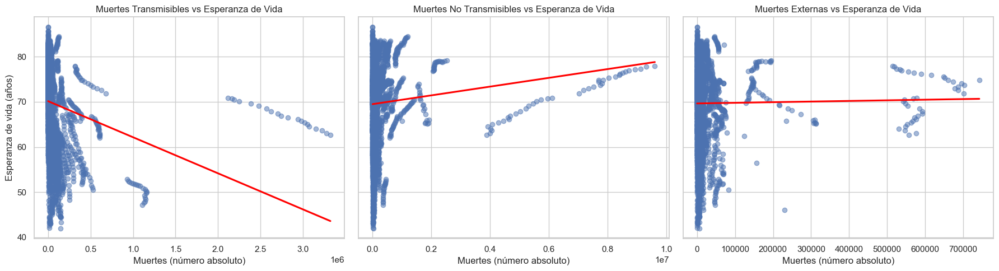

In [549]:
# Estilo general
sns.set_theme(style="whitegrid")

# Preparar los datos (solo columnas relevantes)
columnas_grafico = ['Life_expectancy', 'Muertes_Transmisibles', 'Muertes_No_Transmisibles', 'Muertes_Externas']
df_plot = df_esperanza_vida_x_causa_muerte[columnas_grafico].dropna()

# Crear subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

# Títulos de los ejes
titulos = ['Transmisibles', 'No Transmisibles', 'Externas']
columnas = ['Muertes_Transmisibles', 'Muertes_No_Transmisibles', 'Muertes_Externas']

# Graficar cada categoría
for i, col in enumerate(columnas):
    sns.regplot(
        ax=axes[i],
        data=df_plot,
        x=col,
        y='Life_expectancy',
        scatter_kws={'alpha': 0.5},
        line_kws={'color': 'red'},
        ci=None
    )
    axes[i].set_title(f'Muertes {titulos[i]} vs Esperanza de Vida')
    axes[i].set_xlabel('Muertes (número absoluto)')
    axes[i].set_ylabel('Esperanza de vida (años)' if i == 0 else '')

plt.tight_layout()
plt.show()

Las muertes por enfermedades transmisibles están más asociadas a una menor esperanza de vida a nivel global, con una correlación negativa de -0.47. Esto indica que en los países y años donde hay más muertes por enfermedades como VIH/SIDA, malaria o tuberculosis, la esperanza de vida tiende a ser significativamente más baja.

En comparación:

Las muertes externas (violencia, accidentes, etc.) también tienen una relación negativa (-0.12), pero menos fuerte.

Las muertes por enfermedades no transmisibles (como cáncer o enfermedades cardíacas) tienen una correlación ligeramente positiva (0.08), lo cual puede explicarse porque son más prevalentes en países con poblaciones longevas.

Interpretación del Gráfico 1: En general, este gráfico indica que cuanto mayor es el número de muertes causadas por enfermedades transmisibles en una población (en términos absolutos), menor tiende a ser la esperanza de vida en esa población.

Interpretación del Gráfico 2: Este gráfico sugiere que cuanto mayor es el número de muertes causadas por enfermedades no transmisibles en una población (en términos absolutos), ligeramente mayor tiende a ser la esperanza de vida en esa población. Esto puede parecer contraintuitivo a primera vista. Una posible explicación podría ser que las enfermedades no transmisibles son más prevalentes en poblaciones con una esperanza de vida más alta, donde las personas viven lo suficiente como para desarrollar estas enfermedades crónicas.

Interpretación del Gráfico 3: Este gráfico sugiere que no hay una asociación lineal clara y fuerte entre el número absoluto de muertes causadas por factores externos y la esperanza de vida en una población. El número de muertes externas parece ser más variable y no estar directamente relacionado con la esperanza de vida de la misma manera que las muertes transmisibles o no transmisibles (aunque estas últimas con una relación débil).

Es importante recordar que estos gráficos muestran asociaciones a nivel poblacional y no implican causalidad directa a nivel individual. Además, el "número absoluto" de muertes está influenciado por el tamaño de la población, por lo que analizar las tasas de mortalidad (muertes por cada 100,000 habitantes, por ejemplo) podría proporcionar una perspectiva diferente y más normalizada.

#### 2.¿Los países con mayor porcentaje de muertes por enfermedades infecciosas tienen sistemáticamente una menor esperanza de vida?

In [550]:
# Calcular el total de muertes sumando las tres categorías principales
df_esperanza_vida_x_causa_muerte['Total_Muertes'] = (
    df_esperanza_vida_x_causa_muerte['Muertes_Transmisibles'] +
    df_esperanza_vida_x_causa_muerte['Muertes_No_Transmisibles'] +
    df_esperanza_vida_x_causa_muerte['Muertes_Externas']
)

# Calcular el porcentaje de muertes transmisibles
df_esperanza_vida_x_causa_muerte['%Muertes_Transmisibles'] = (
    df_esperanza_vida_x_causa_muerte['Muertes_Transmisibles'] /
    df_esperanza_vida_x_causa_muerte['Total_Muertes']
) * 100

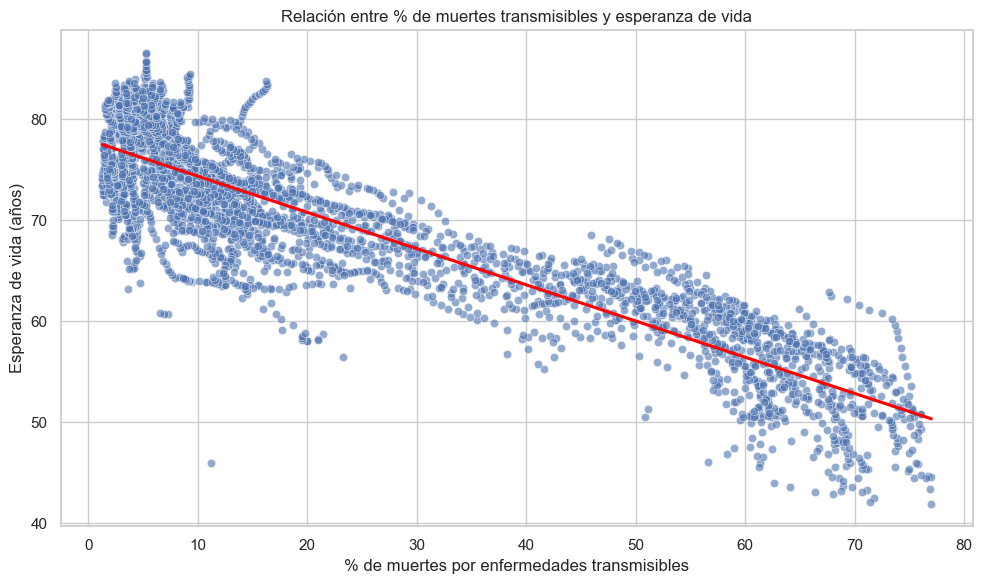

In [551]:
# Gráfico de dispersión: % de muertes transmisibles vs esperanza de vida

sns.set_theme(style="whitegrid")
plt.figure(figsize=(10, 6))

sns.scatterplot(
    data=df_esperanza_vida_x_causa_muerte,
    x='%Muertes_Transmisibles',
    y='Life_expectancy',
    alpha=0.6
)
sns.regplot(
    data=df_esperanza_vida_x_causa_muerte,
    x='%Muertes_Transmisibles',
    y='Life_expectancy',
    scatter=False,
    color='red',
    ci=None
)

plt.title('Relación entre % de muertes transmisibles y esperanza de vida')
plt.xlabel('% de muertes por enfermedades transmisibles')
plt.ylabel('Esperanza de vida (años)')
plt.tight_layout()
plt.show()

In [552]:
# Calcular la correlación de Spearman
correlacion = df_esperanza_vida_x_causa_muerte[['%Muertes_Transmisibles', 'Life_expectancy']].corr(method='spearman')
print(correlacion)

                        %Muertes_Transmisibles  Life_expectancy
%Muertes_Transmisibles                1.000000        -0.833882
Life_expectancy                      -0.833882         1.000000


Sí, los países con mayor porcentaje de muertes por enfermedades infecciosas tienen sistemáticamente una menor esperanza de vida. Esto lo demuestra la alta correlación negativa de -0.82 entre el % de muertes por enfermedades transmisibles y la esperanza de vida.

#### 3.¿En qué regiones geográficas predominan las enfermedades transmisibles como causa de muerte, y cómo se relaciona esto con la esperanza de vida?

In [553]:
paises = df_esperanza_vida_x_causa_muerte['Country'].unique().tolist()
print(paises)

['Afghanistan', 'Senegal', 'Colombia', 'Serbia', 'China', 'Seychelles', 'Chile', 'Sierra Leone', 'Chad', 'Saudi Arabia', 'Singapore', 'Slovakia', 'Slovenia', 'Cape Verde', 'Solomon Islands', 'Canada', 'Somalia', 'Cameroon', 'Central African Republic', 'Comoros', 'Sao Tome and Principe', 'Congo', 'Djibouti', 'Portugal', 'Qatar', 'Denmark', 'Romania', 'Democratic Republic of Congo', 'Russia', 'Czechia', 'Rwanda', 'Cyprus', 'Saint Kitts and Nevis', 'Cuba', 'Saint Lucia', 'Croatia', 'Saint Vincent and the Grenadines', "Cote d'Ivoire", 'Samoa', 'Costa Rica', 'San Marino', 'South Africa', 'Poland', 'Cambodia', 'South Sudan', 'Belgium', 'Tonga', 'Belarus', 'Trinidad and Tobago', 'Barbados', 'Tunisia', 'Bangladesh', 'Turkey', 'Togo', 'Bahrain', 'Bahamas', 'Tuvalu', 'Azerbaijan', 'Uganda', 'Austria', 'Ukraine', 'Australia', 'United Arab Emirates', 'Turkmenistan', 'Belize', 'Thailand', 'Tanzania', 'Burundi', 'Spain', 'Burkina Faso', 'Sri Lanka', 'Bulgaria', 'Sudan', 'Brunei', 'Suriname', 'Brazil

Utilizaremos el esquema geográfico de las Naciones Unidas (UNSD) como referencia, el cual divide el mundo en seis regiones principales: África, América, Asia, Europa, Oceanía y Antártida.

In [554]:
# Diccionario país -> región
pais_a_region = {
    'Afghanistan': 'Asia', 'Croatia': 'Europa', 'San Marino': 'Europa', "Cote d'Ivoire": 'África',
    'Sao Tome and Principe': 'África', 'Costa Rica': 'América', 'Saudi Arabia': 'Asia', 'Solomon Islands': 'Oceanía',
    'Congo': 'África', 'Senegal': 'África', 'Comoros': 'África', 'Serbia': 'Europa', 'Colombia': 'América',
    'Seychelles': 'África', 'China': 'Asia', 'Sierra Leone': 'África', 'Chile': 'América', 'Singapore': 'Asia',
    'Chad': 'África', 'Slovakia': 'Europa', 'Slovenia': 'Europa', 'Samoa': 'Oceanía',
    'Saint Vincent and the Grenadines': 'América', 'Portugal': 'Europa', 'Qatar': 'Asia', 'Denmark': 'Europa',
    'Romania': 'Europa', 'Democratic Republic of Congo': 'África', 'Russia': 'Europa', 'Czechia': 'Europa',
    'Rwanda': 'África', 'Cyprus': 'Asia', 'Saint Kitts and Nevis': 'América', 'Cuba': 'América', 'Saint Lucia': 'América',
    'Cape Verde': 'África', 'Somalia': 'África', 'Cameroon': 'África', 'Djibouti': 'África', 'Poland': 'Europa',
    'Cambodia': 'Asia', 'South Sudan': 'África', 'Belgium': 'Europa', 'Tonga': 'Oceanía', 'Belarus': 'Europa',
    'Trinidad and Tobago': 'América', 'Barbados': 'América', 'Tunisia': 'África', 'Bangladesh': 'Asia', 'Turkey': 'Asia',
    'Togo': 'África', 'Bahrain': 'Asia', 'Bahamas': 'América', 'Tuvalu': 'Oceanía', 'Azerbaijan': 'Asia',
    'Uganda': 'África', 'Austria': 'Europa', 'Ukraine': 'Europa', 'Australia': 'Oceanía', 'United Arab Emirates': 'Asia',
    'Turkmenistan': 'Asia', 'Belize': 'América', 'Thailand': 'Asia', 'Tanzania': 'África', 'Burundi': 'África',
    'Spain': 'Europa', 'Burkina Faso': 'África', 'Sri Lanka': 'Asia', 'Bulgaria': 'Europa', 'Sudan': 'África',
    'Brunei': 'Asia', 'Suriname': 'América', 'Brazil': 'América', 'Sweden': 'Europa', 'Botswana': 'África',
    'Switzerland': 'Europa', 'Bosnia and Herzegovina': 'Europa', 'Syria': 'Asia', 'Bolivia': 'América', 'Taiwan': 'Asia',
    'Bhutan': 'Asia', 'Tajikistan': 'Asia', 'Benin': 'África', 'South Korea': 'Asia', 'United Kingdom': 'Europa',
    'Dominica': 'América', 'Dominican Republic': 'América', 'Iran': 'Asia', 'Maldives': 'Asia', 'Indonesia': 'Asia',
    'Mali': 'África', 'India': 'Asia', 'Malta': 'Europa', 'Marshall Islands': 'Oceanía', 'Iceland': 'Europa',
    'Malaysia': 'Asia', 'Mauritania': 'África', 'Mauritius': 'África', 'Honduras': 'América', 'Mexico': 'América',
    'Haiti': 'América', 'Guyana': 'América', 'Moldova': 'Europa', 'Guinea-Bissau': 'África', 'Hungary': 'Europa',
    'Iraq': 'Asia', 'Malawi': 'África', 'Ireland': 'Europa', 'Kuwait': 'Asia', 'Laos': 'Asia', 'Kiribati': 'Oceanía',
    'Latvia': 'Europa', 'Kenya': 'África', 'Lebanon': 'Asia', 'Kazakhstan': 'Asia', 'Lesotho': 'África',
    'Liberia': 'África', 'Jordan': 'Asia', 'Libya': 'África', 'Japan': 'Asia', 'Jamaica': 'América', 'Lithuania': 'Europa',
    'Italy': 'Europa', 'Luxembourg': 'Europa', 'Israel': 'Asia', 'Madagascar': 'África', 'Monaco': 'Europa',
    'Philippines': 'Asia', 'Guinea': 'África', 'Guatemala': 'América', 'North Korea': 'Asia', 'Eswatini': 'África',
    'North Macedonia': 'Europa', 'Norway': 'Europa', 'Estonia': 'Europa', 'Oman': 'Asia', 'Eritrea': 'África',
    'Pakistan': 'Asia', 'Ethiopia': 'África', 'Equatorial Guinea': 'África', 'El Salvador': 'América',
    'Panama': 'América', 'Egypt': 'África', 'Papua New Guinea': 'Oceanía', 'Ecuador': 'América', 'Paraguay': 'América',
    'East Timor': 'Asia', 'Peru': 'América', 'Palau': 'Oceanía', 'Nigeria': 'África', 'Fiji': 'Oceanía', 'Niger': 'África',
    'Montenegro': 'Europa', 'Grenada': 'América', 'Morocco': 'África', 'Greece': 'Europa', 'Mozambique': 'África',
    'Myanmar': 'Asia', 'Ghana': 'África', 'Namibia': 'África', 'Germany': 'Europa', 'Nauru': 'Oceanía', 'Georgia': 'Asia',
    'Nepal': 'Asia', 'Gambia': 'África', 'Netherlands': 'Europa', 'Gabon': 'África', 'New Zealand': 'Oceanía',
    'France': 'Europa', 'Nicaragua': 'América', 'Finland': 'Europa', 'Mongolia': 'Asia', 'Kyrgyzstan': 'Asia',
    'Algeria': 'África', 'Yemen': 'Asia', 'Zimbabwe': 'África', 'Angola': 'África', 'Armenia': 'Asia', 'Zambia': 'África',
    'Uruguay': 'América', 'Vanuatu': 'Oceanía', 'Antigua and Barbuda': 'América', 'Venezuela': 'América',
    'Vietnam': 'Asia', 'Uzbekistan': 'Asia', 'Albania': 'Europa', 'Andorra': 'Europa', 'Argentina': 'América',
    'United States': 'América'
}

# Crear la columna 'Región' usando el diccionario de mapeo
df_esperanza_vida_x_causa_muerte['Región'] = df_esperanza_vida_x_causa_muerte['Country'].map(pais_a_region)

In [555]:
df_esperanza_vida_x_causa_muerte.head(5)

,Country,Year,Life_expectancy,Deaths - Meningitis - Sex: Both - Age: All Ages (Number),Deaths - Alzheimer's disease and other dementias - Sex: Both - Age: All Ages (Number),Deaths - Parkinson's disease - Sex: Both - Age: All Ages (Number),Deaths - Nutritional deficiencies - Sex: Both - Age: All Ages (Number),Deaths - Malaria - Sex: Both - Age: All Ages (Number),Deaths - Drowning - Sex: Both - Age: All Ages (Number),Deaths - Interpersonal violence - Sex: Both - Age: All Ages (Number),Deaths - Maternal disorders - Sex: Both - Age: All Ages (Number),Deaths - HIV/AIDS - Sex: Both - Age: All Ages (Number),Deaths - Drug use disorders - Sex: Both - Age: All Ages (Number),Deaths - Tuberculosis - Sex: Both - Age: All Ages (Number),Deaths - Cardiovascular diseases - Sex: Both - Age: All Ages (Number),Deaths - Lower respiratory infections - Sex: Both - Age: All Ages (Number),Deaths - Neonatal disorders - Sex: Both - Age: All Ages (Number),Deaths - Alcohol use disorders - Sex: Both - Age: All Ages (Number),Deaths - Self-harm - Sex: Both - Age: All Ages (Number),Deaths - Exposure to forces of nature - Sex: Both - Age: All Ages (Number),Deaths - Diarrheal diseases - Sex: Both - Age: All Ages (Number),Deaths - Environmental heat and cold exposure - Sex: Both - Age: All Ages (Number),Deaths - Neoplasms - Sex: Both - Age: All Ages (Number),Deaths - Conflict and terrorism - Sex: Both - Age: All Ages (Number),Deaths - Diabetes mellitus - Sex: Both - Age: All Ages (Number),Deaths - Chronic kidney disease - Sex: Both - Age: All Ages (Number),Deaths - Poisonings - Sex: Both - Age: All Ages (Number),Deaths - Protein-energy malnutrition - Sex: Both - Age: All Ages (Number),Deaths - Road injuries - Sex: Both - Age: All Ages (Number),Deaths - Chronic respiratory diseases - Sex: Both - Age: All Ages (Number),Deaths - Cirrhosis and other chronic liver diseases - Sex: Both - Age: All Ages (Number),Deaths - Digestive diseases - Sex: Both - Age: All Ages (Number),"Deaths - Fire, heat, and hot substances - Sex: Both - Age: All Ages (Number)",Deaths - Acute hepatitis - Sex: Both - Age: All Ages (Number),Muertes_Transmisibles,Muertes_No_Transmisibles,Muertes_Externas,Total_Muertes,%Muertes_Transmisibles,Región
0,Afghanistan,2000,55.2978,3105.0,1291.0,416.0,3060.0,263.0,2048.0,2871.0,4271.0,97.0,186.0,5864.0,53919.0,32395.0,22920.0,99.0,1137.0,0.0,11323.0,52.0,13977.0,5429.0,2515.0,4182.0,499.0,3013.0,6581.0,7471.0,3249.0,6206.0,465.0,4334.0,84572.0,99299.0,19367.0,203238.0,41.612297,Asia
3080,Senegal,2000,56.9434,2472.0,590.0,159.0,970.0,20300.0,288.0,96.0,1254.0,2825.0,9.0,3733.0,9355.0,7754.0,10285.0,47.0,622.0,0.0,9947.0,52.0,3875.0,81.0,1279.0,1426.0,186.0,935.0,1220.0,1691.0,1583.0,2883.0,220.0,110.0,58680.0,24746.0,2821.0,86247.0,68.037149,África
780,Colombia,2000,71.3201,780.0,4756.0,839.0,1943.0,852.0,1340.0,33565.0,700.0,1991.0,69.0,1157.0,48227.0,6410.0,10952.0,84.0,2378.0,212.0,2195.0,15.0,29833.0,2154.0,5549.0,4687.0,105.0,1864.0,7336.0,9835.0,2798.0,7204.0,299.0,37.0,25074.0,117535.0,47557.0,190166.0,13.185322,América
3100,Serbia,2000,71.4392,51.0,1609.0,555.0,14.0,0.0,204.0,472.0,14.0,44.0,42.0,379.0,63489.0,1126.0,818.0,433.0,2439.0,5.0,22.0,81.0,23175.0,532.0,2999.0,1714.0,64.0,6.0,1294.0,3985.0,1700.0,3935.0,129.0,11.0,2465.0,103181.0,5695.0,111341.0,2.213919,Europa
760,China,2000,71.8807,16947.0,134438.0,43357.0,18083.0,120.0,111301.0,31227.0,12385.0,9872.0,34726.0,110958.0,2908756.0,303378.0,177316.0,12527.0,189269.0,679.0,33220.0,7341.0,1867021.0,201.0,99174.0,119415.0,22376.0,16223.0,279743.0,1347045.0,168580.0,302427.0,12911.0,13143.0,677339.0,7024519.0,702301.0,8404159.0,8.059569,Asia


In [556]:
# Agrupar por región y calcular los promedios
df_region = df_esperanza_vida_x_causa_muerte.groupby('Región')[['%Muertes_Transmisibles', 'Life_expectancy']].mean().reset_index()

df_region.head(5)

,Región,%Muertes_Transmisibles,Life_expectancy
0,América,13.556646,72.882420
1,Asia,15.923234,71.978892
2,Europa,3.879563,77.765735
3,Oceanía,15.831008,68.573053
4,África,52.027265,59.566587


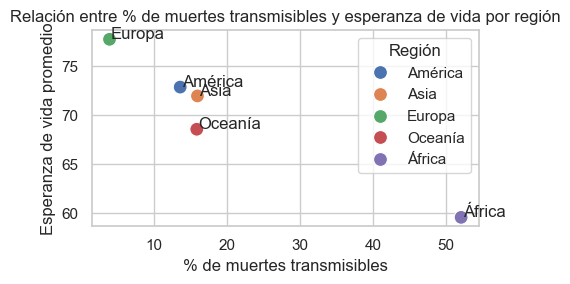

In [557]:
# Gráfico de dispersión por región
plt.figure(figsize=(5, 3))
sns.scatterplot(
    data=df_region,
    x='%Muertes_Transmisibles',
    y='Life_expectancy',
    hue='Región',
    s=100
)

# Añadir etiquetas con el nombre de la región
for i, row in df_region.iterrows():
    plt.text(row['%Muertes_Transmisibles'] + 0.2, row['Life_expectancy'], row['Región'])

plt.title('Relación entre % de muertes transmisibles y esperanza de vida por región')
plt.xlabel('% de muertes transmisibles')
plt.ylabel('Esperanza de vida promedio')
plt.grid(True)
plt.tight_layout()
plt.show()

Europa (Verde): Se encuentra en la parte superior izquierda del gráfico, con un porcentaje muy bajo de muertes transmisibles (alrededor del 5%) y una esperanza de vida promedio muy alta (cercana a los 78 años).
América (Azul): Se sitúa en la parte media izquierda, con un porcentaje relativamente bajo de muertes transmisibles (alrededor del 12%) y una esperanza de vida promedio alta (alrededor de 73.5 años).
Asia (Naranja): Se encuentra ligeramente a la derecha y un poco más abajo que América, con un porcentaje moderado de muertes transmisibles (alrededor del 16%) y una esperanza de vida promedio también moderada (alrededor de 72 años).
Oceanía (Rojo): Se ubica cerca de Asia, con un porcentaje similar de muertes transmisibles (alrededor del 16%) pero una esperanza de vida promedio ligeramente inferior (alrededor de 70 años).
África (Morado): Se encuentra en la parte inferior derecha del gráfico, con un porcentaje muy alto de muertes transmisibles (alrededor del 52%) y una esperanza de vida promedio muy baja (alrededor de 60 años).

Europa muestra la situación más favorable, con una baja carga de muertes transmisibles y una alta esperanza de vida.
África presenta el panorama opuesto, con una alta carga de muertes transmisibles y una baja esperanza de vida.
América, Asia y Oceanía se sitúan en un punto intermedio.

El gráfico destaca cómo la proporción de muertes causadas por enfermedades transmisibles está fuertemente relacionada con la esperanza de vida promedio a nivel regional en el rango de 2000 a 2019, sugiriendo que reducir la carga de enfermedades transmisibles es un factor importante para aumentar la esperanza de vida a nivel poblacional.

#### 4.¿Las muertes por causas externas (suicidios, homicidios, accidentes) tienen un impacto significativo en la esperanza de vida nacional o están amortiguadas por otras variables?

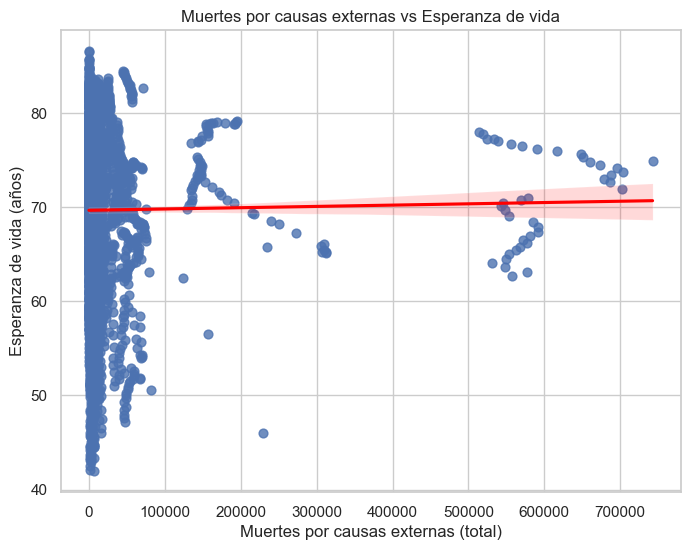

In [558]:
plt.figure(figsize=(8, 6))
sns.regplot(
    data=df_esperanza_vida_x_causa_muerte,
    x='Muertes_Externas',
    y='Life_expectancy',
    scatter_kws={'s': 40},  # tamaño de puntos
    line_kws={'color': 'red'}  # color de la línea
)
plt.title('Muertes por causas externas vs Esperanza de vida')
plt.xlabel('Muertes por causas externas (total)')
plt.ylabel('Esperanza de vida (años)')
plt.grid(True)
plt.show()

In [559]:
corr_spearman = df_esperanza_vida_x_causa_muerte[['Muertes_Externas', 'Life_expectancy']].corr(method='spearman')
print(corr_spearman)

                  Muertes_Externas  Life_expectancy
Muertes_Externas          1.000000        -0.126832
Life_expectancy          -0.126832         1.000000


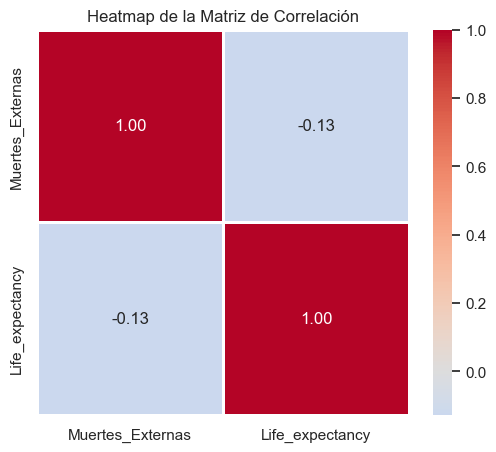

In [560]:
# Graficar el heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(corr_spearman, annot=True, cmap="coolwarm", center=0, linewidths=1, fmt=".2f")
plt.title("Heatmap de la Matriz de Correlación")
plt.show()

En este caso, dado que la correlación es tan pequeña, la relación entre las muertes externas y la esperanza de vida podría no ser un factor importante en el análisis de la esperanza de vida en este contexto. Para una interpretación más robusta, sería útil considerar otras variables o realizar un análisis más detallado con técnicas estadísticas avanzadas.

#### 6.¿Los países con mayor carga de enfermedades crónicas tienen una esperanza de vida más alta debido a su desarrollo, o esto es un sesgo por envejecimiento poblacional?

En un principio la primera parte de la pregunta ya se a respondido en anteriores analisis, y la proliferacion de estas enfermedades se debe al envejecimiento de la poblacion por los avances medicos.

### Vacunaciones y Causas de muerte
A partir de aqui se va a proceder a unir ambos dataframes con la perdida de paises que se anotara para ver si es relevante para contestar a las preguntas o se descarta seguir con el analisis debido a la falta de datos.

In [561]:
df_esp_x_causa_muerte_x_vac = pd.merge(df_esperanza_vida_x_causa_muerte, df_vaccination, on=['Country', 'Year'], how='outer', indicator=True)

In [562]:
# Recuento de coincidencias
conteo_merge = df_esp_x_causa_muerte_x_vac['_merge'].value_counts()
print("Recuento de coincidencias en el merge:")
print(conteo_merge)

# Países únicos antes
total_antes = df_esp_x_causa_muerte_x_vac['Country'].nunique()
print(f"Países únicos antes del filtro: {total_antes}")

# Extraer países que se pierden
paises_solo_en_muerte = df_esp_x_causa_muerte_x_vac[df_esp_x_causa_muerte_x_vac['_merge'] == 'left_only']['Country'].unique().tolist()
paises_solo_en_vac = df_esp_x_causa_muerte_x_vac[df_esp_x_causa_muerte_x_vac['_merge'] == 'right_only']['Country'].unique().tolist()
paises_perdidos = paises_solo_en_muerte + paises_solo_en_vac

print(f"Países que se pierden ({len(paises_perdidos)}):")
print(paises_perdidos)

# Filtrar solo los países que están en ambos
df_prueba = df_esp_x_causa_muerte_x_vac[df_esp_x_causa_muerte_x_vac['_merge'] == 'both'].copy()

# Países únicos después
total_despues = df_prueba['Country'].nunique()
print(f"Países únicos después del filtro ('both'): {total_despues}")

# Eliminar la columna de control
df_esp_x_causa_muerte_x_vac.drop(columns=['_merge'], inplace=True)

Recuento de coincidencias en el merge:
_merge
both          3801
left_only       39
right_only      20
Name: count, dtype: int64
Países únicos antes del filtro: 193
Países que se pierden (5):
['East Timor', 'Montenegro', 'South Sudan', 'Taiwan', 'Micronesia (country)']
Países únicos después del filtro ('both'): 191


In [564]:
df_esp_x_causa_muerte_x_vac.sample(10)

,Country,Year,Life_expectancy,Deaths - Meningitis - Sex: Both - Age: All Ages (Number),Deaths - Alzheimer's disease and other dementias - Sex: Both - Age: All Ages (Number),Deaths - Parkinson's disease - Sex: Both - Age: All Ages (Number),Deaths - Nutritional deficiencies - Sex: Both - Age: All Ages (Number),Deaths - Malaria - Sex: Both - Age: All Ages (Number),Deaths - Drowning - Sex: Both - Age: All Ages (Number),Deaths - Interpersonal violence - Sex: Both - Age: All Ages (Number),Deaths - Maternal disorders - Sex: Both - Age: All Ages (Number),Deaths - HIV/AIDS - Sex: Both - Age: All Ages (Number),Deaths - Drug use disorders - Sex: Both - Age: All Ages (Number),Deaths - Tuberculosis - Sex: Both - Age: All Ages (Number),Deaths - Cardiovascular diseases - Sex: Both - Age: All Ages (Number),Deaths - Lower respiratory infections - Sex: Both - Age: All Ages (Number),Deaths - Neonatal disorders - Sex: Both - Age: All Ages (Number),Deaths - Alcohol use disorders - Sex: Both - Age: All Ages (Number),Deaths - Self-harm - Sex: Both - Age: All Ages (Number),Deaths - Exposure to forces of nature - Sex: Both - Age: All Ages (Number),Deaths - Diarrheal diseases - Sex: Both - Age: All Ages (Number),Deaths - Environmental heat and cold exposure - Sex: Both - Age: All Ages (Number),Deaths - Neoplasms - Sex: Both - Age: All Ages (Number),Deaths - Conflict and terrorism - Sex: Both - Age: All Ages (Number),Deaths - Diabetes mellitus - Sex: Both - Age: All Ages (Number),Deaths - Chronic kidney disease - Sex: Both - Age: All Ages (Number),Deaths - Poisonings - Sex: Both - Age: All Ages (Number),Deaths - Protein-energy malnutrition - Sex: Both - Age: All Ages (Number),Deaths - Road injuries - Sex: Both - Age: All Ages (Number),Deaths - Chronic respiratory diseases - Sex: Both - Age: All Ages (Number),Deaths - Cirrhosis and other chronic liver diseases - Sex: Both - Age: All Ages (Number),Deaths - Digestive diseases - Sex: Both - Age: All Ages (Number),"Deaths - Fire, heat, and hot substances - Sex: Both - Age: All Ages (Number)",Deaths - Acute hepatitis - Sex: Both - Age: All Ages (Number),Muertes_Transmisibles,Muertes_No_Transmisibles,Muertes_Externas,Total_Muertes,%Muertes_Transmisibles,Región,BCG (% of one-year-olds immunized),HepB3 (% of one-year-olds immunized),Hib3 (% of one-year-olds immunized),IPV1 (% of one-year-olds immunized),MCV1 (% of one-year-olds immunized),PCV3 (% of one-year-olds immunized),Pol3 (% of one-year-olds immunized),RCV1 (% of one-year-olds immunized),RotaC (% of one-year-olds immunized),YFV (% of one-year-olds immunized),DTP3 (% of one-year-olds immunized)
2093,Mali,2013,57.3567,5624.0,1027.0,279.0,9080.0,33339.0,862.0,1467.0,2963.0,5637.0,13.0,5859.0,16469.0,13637.0,28271.0,80.0,736.0,37.0,13586.0,114.0,7524.0,1127.0,2271.0,2226.0,474.0,8871.0,2219.0,3884.0,2770.0,5257.0,625.0,396.0,109312.0,59658.0,7754.0,176724.0,61.854643,África,70.0,64.0,64.0,NaN,62.0,59.0,57.0,NaN,NaN,60.0,64.0
2695,Paraguay,2015,73.1905,64.0,1129.0,185.0,314.0,0.0,170.0,737.0,102.0,728.0,12.0,248.0,8677.0,1336.0,664.0,293.0,390.0,12.0,180.0,6.0,5250.0,13.0,2076.0,1698.0,10.0,309.0,1405.0,1051.0,663.0,1507.0,54.0,2.0,3324.0,22859.0,3102.0,29285.0,11.350521,América,96.0,92.0,92.0,NaN,78.0,90.0,93.0,78.0,91.0,93.0,92.0
2590,Oman,2010,76.2695,14.0,147.0,54.0,40.0,0.0,114.0,23.0,20.0,71.0,11.0,23.0,4698.0,402.0,313.0,6.0,99.0,16.0,34.0,9.0,1112.0,0.0,603.0,165.0,23.0,2.0,2001.0,248.0,244.0,309.0,21.0,34.0,911.0,7622.0,2323.0,10856.0,8.391673,Asia,99.0,99.0,99.0,NaN,99.0,99.0,99.0,99.0,NaN,NaN,99.0
984,Dominican Republic,2004,70.3305,327.0,1219.0,257.0,454.0,21.0,263.0,1346.0,209.0,3644.0,16.0,740.0,15930.0,1985.0,4178.0,96.0,570.0,704.0,1005.0,10.0,6773.0,0.0,1762.0,1397.0,35.0,439.0,2288.0,1335.0,1857.0,2601.0,136.0,22.0,12131.0,34024.0,5464.0,51619.0,23.501036,América,97.0,82.0,80.0,NaN,81.0,NaN,66.0,81.0,NaN,NaN,79.0
706,China,2006,74.5037,8824.0,178510.0,51900.0,11083.0,36.0,79135.0,25011.0,5755.0,14791.0,11582.0,74403.0,3385035.0,199008.0,10758

In [565]:
#Renombro las columnas para que sea mas sencillo el analisis

df_esp_x_causa_muerte_x_vac = df_esp_x_causa_muerte_x_vac.rename(columns={
    'BCG (% of one-year-olds immunized)': 'BCG',
    'HepB3 (% of one-year-olds immunized)': 'HepB3',
    'Hib3 (% of one-year-olds immunized)': 'Hib3',
    'IPV1 (% of one-year-olds immunized)': 'IPV1',
    'MCV1 (% of one-year-olds immunized)': 'MCV1',
    'PCV3 (% of one-year-olds immunized)': 'PCV3',
    'Pol3 (% of one-year-olds immunized)': 'Pol3',
    'RCV1 (% of one-year-olds immunized)': 'RCV1',
    'RotaC (% of one-year-olds immunized)': 'Rotac',
    'YFV (% of one-year-olds immunized)': 'YFV',
    'DTP3 (% of one-year-olds immunized)': 'DTP3'
})

In [566]:
df_esp_x_causa_muerte_x_vac.head(2)

,Country,Year,Life_expectancy,Deaths - Meningitis - Sex: Both - Age: All Ages (Number),Deaths - Alzheimer's disease and other dementias - Sex: Both - Age: All Ages (Number),Deaths - Parkinson's disease - Sex: Both - Age: All Ages (Number),Deaths - Nutritional deficiencies - Sex: Both - Age: All Ages (Number),Deaths - Malaria - Sex: Both - Age: All Ages (Number),Deaths - Drowning - Sex: Both - Age: All Ages (Number),Deaths - Interpersonal violence - Sex: Both - Age: All Ages (Number),Deaths - Maternal disorders - Sex: Both - Age: All Ages (Number),Deaths - HIV/AIDS - Sex: Both - Age: All Ages (Number),Deaths - Drug use disorders - Sex: Both - Age: All Ages (Number),Deaths - Tuberculosis - Sex: Both - Age: All Ages (Number),Deaths - Cardiovascular diseases - Sex: Both - Age: All Ages (Number),Deaths - Lower respiratory infections - Sex: Both - Age: All Ages (Number),Deaths - Neonatal disorders - Sex: Both - Age: All Ages (Number),Deaths - Alcohol use disorders - Sex: Both - Age: All Ages (Number),Deaths - Self-harm - Sex: Both - Age: All Ages (Number),Deaths - Exposure to forces of nature - Sex: Both - Age: All Ages (Number),Deaths - Diarrheal diseases - Sex: Both - Age: All Ages (Number),Deaths - Environmental heat and cold exposure - Sex: Both - Age: All Ages (Number),Deaths - Neoplasms - Sex: Both - Age: All Ages (Number),Deaths - Conflict and terrorism - Sex: Both - Age: All Ages (Number),Deaths - Diabetes mellitus - Sex: Both - Age: All Ages (Number),Deaths - Chronic kidney disease - Sex: Both - Age: All Ages (Number),Deaths - Poisonings - Sex: Both - Age: All Ages (Number),Deaths - Protein-energy malnutrition - Sex: Both - Age: All Ages (Number),Deaths - Road injuries - Sex: Both - Age: All Ages (Number),Deaths - Chronic respiratory diseases - Sex: Both - Age: All Ages (Number),Deaths - Cirrhosis and other chronic liver diseases - Sex: Both - Age: All Ages (Number),Deaths - Digestive diseases - Sex: Both - Age: All Ages (Number),"Deaths - Fire, heat, and hot substances - Sex: Both - Age: All Ages (Number)",Deaths - Acute hepatitis - Sex: Both - Age: All Ages (Number),Muertes_Transmisibles,Muertes_No_Transmisibles,Muertes_Externas,Total_Muertes,%Muertes_Transmisibles,Región,BCG,HepB3,Hib3,IPV1,MCV1,PCV3,Pol3,RCV1,Rotac,YFV,DTP3
0,Afghanistan,2000,55.2978,3105.0,1291.0,416.0,3060.0,263.0,2048.0,2871.0,4271.0,97.0,186.0,5864.0,53919.0,32395.0,22920.0,99.0,1137.0,0.0,11323.0,52.0,13977.0,5429.0,2515.0,4182.0,499.0,3013.0,6581.0,7471.0,3249.0,6206.0,465.0,4334.0,84572.0,99299.0,19367.0,203238.0,41.612297,Asia,30.0,NaN,NaN,NaN,27.0,NaN,24.0,NaN,NaN,NaN,24.0
1,Afghanistan,2001,55.7981,3063.0,1300.0,424.0,2973.0,211.0,2044.0,2971.0,4385.0,104.0,197.0,5900.0,54642.0,31594.0,23276.0,101.0,1183.0,4.0,11446.0,380.0,14312.0,5689.0,2657.0,4251.0,502.0,2924.0,6720.0,7565.0,3267.0,6277.0,467.0,4363.0,84342.0,100592.0,20258.0,205192.0,41.103942,Asia,43.0,NaN,NaN,NaN,37.0,NaN,35.0,NaN,NaN,NaN,33.0


#### 1) ¿La combinación de alta vacunación y baja mortalidad por enfermedades transmisibles genera un efecto amplificado sobre la esperanza de vida?

Primero vemos los nulos para que el anova no nos de fallos y ver si se imputan eliminandolos o rellenando

In [570]:
# Total de valores faltantes en la columna Life_expectancy
nan_total = df_esp_x_causa_muerte_x_vac['Life_expectancy'].isna().sum()
print(f"🔍 Total de valores NaN en Life_expectancy: {nan_total}")

# Países con valores NaN en Life_expectancy
print("\n📍 Países con valores NaN en Life_expectancy:")
print(df_esp_x_causa_muerte_x_vac[df_esp_x_causa_muerte_x_vac['Life_expectancy'].isna()]['Country'].value_counts())

# Años con valores NaN en Life_expectancy
print("\n📅 Años con valores NaN en Life_expectancy:")
print(df_esp_x_causa_muerte_x_vac[df_esp_x_causa_muerte_x_vac['Life_expectancy'].isna()]['Year'].value_counts())

🔍 Total de valores NaN en Life_expectancy: 20

📍 Países con valores NaN en Life_expectancy:
Country
Micronesia (country)    20
Name: count, dtype: int64

📅 Años con valores NaN en Life_expectancy:
Year
2000    1
2001    1
2018    1
2017    1
2016    1
2015    1
2014    1
2013    1
2012    1
2011    1
2010    1
2009    1
2008    1
2007    1
2006    1
2005    1
2004    1
2003    1
2002    1
2019    1
Name: count, dtype: int64


In [571]:
# Eliminar filas del país que no tiene datos de esperanza de vida
df_esp_x_causa_muerte_x_vac = df_esp_x_causa_muerte_x_vac[df_esp_x_causa_muerte_x_vac['Country'] != 'Micronesia (country)'].copy()
print("✅ Micronesia (country) eliminada del DataFrame para evitar problemas en el análisis.")

✅ Micronesia (country) eliminada del DataFrame para evitar problemas en el análisis.


📊 Número de observaciones por grupo:
Grupo_Vac_Mort
Baja Vac + Alta Mort    2220
Baja Vac + Baja Mort     663
Alta Vac + Alta Mort     660
Alta Vac + Baja Mort     297
Name: count, dtype: int64 

📈 Resumen de esperanza de vida por grupo:
                       count       mean       std      min        25%  \
Grupo_Vac_Mort                                                          
Alta Vac + Alta Mort   660.0  72.873877  5.303580  51.4863  69.809375   
Alta Vac + Baja Mort   297.0  76.694103  4.390755  65.2640  73.733500   
Baja Vac + Alta Mort  2220.0  65.419564  8.912563  41.9572  59.058600   
Baja Vac + Baja Mort   663.0  77.602538  4.218895  63.1529  74.444000   

                           50%        75%      max  
Grupo_Vac_Mort                                      
Alta Vac + Alta Mort  73.49840  76.306925  84.4258  
Alta Vac + Baja Mort  76.97050  79.831000  86.5424  
Baja Vac + Alta Mort  65.67045  72.514300  83.8928  
Baja Vac + Baja Mort  78.77240  81.100900  85.7228   



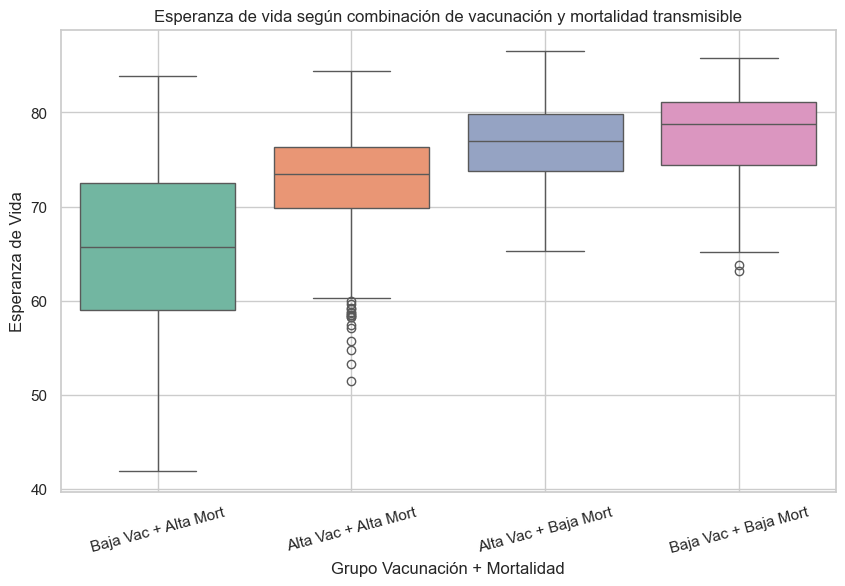

📊 Resultado ANOVA:
F_onewayResult(statistic=621.9244363412753, pvalue=0.0)
✅ Las diferencias entre grupos son estadísticamente significativas.


In [572]:
df = df_esp_x_causa_muerte_x_vac.copy()

#  Calcular cobertura vacunal promedio 
vacunas = ['BCG', 'HepB3', 'Hib3', 'IPV1', 'MCV1', 'PCV3', 'Pol3', 'RCV1', 'Rotac', 'YFV', 'DTP3']
df['Cobertura_vacunal_media'] = df[vacunas].mean(axis=1, skipna=True)

#  Definir umbrales de alta vacunación y baja mortalidad 
p75_vac = df['Cobertura_vacunal_media'].quantile(0.75)
p25_mortalidad = df['%Muertes_Transmisibles'].quantile(0.25)

#  Clasificar filas en 4 grupos combinados 
def clasificar_grupo(fila):
    if fila['Cobertura_vacunal_media'] >= p75_vac and fila['%Muertes_Transmisibles'] <= p25_mortalidad:
        return 'Alta Vac + Baja Mort'
    elif fila['Cobertura_vacunal_media'] >= p75_vac:
        return 'Alta Vac + Alta Mort'
    elif fila['%Muertes_Transmisibles'] <= p25_mortalidad:
        return 'Baja Vac + Baja Mort'
    else:
        return 'Baja Vac + Alta Mort'

df['Grupo_Vac_Mort'] = df.apply(clasificar_grupo, axis=1)

# Conteo y resumen estadístico por grupo

print("📊 Número de observaciones por grupo:")
print(df['Grupo_Vac_Mort'].value_counts(), "\n")

print("📈 Resumen de esperanza de vida por grupo:")
print(df.groupby('Grupo_Vac_Mort')['Life_expectancy'].describe(), "\n")

#  Gráfico comparativo de esperanza de vida por grupo 
plt.figure(figsize=(10,6))
sns.boxplot(data=df, x='Grupo_Vac_Mort', y='Life_expectancy', palette='Set2')
plt.title('Esperanza de vida según combinación de vacunación y mortalidad transmisible')
plt.ylabel('Esperanza de Vida')
plt.xlabel('Grupo Vacunación + Mortalidad')
plt.xticks(rotation=15)
plt.grid(True)
plt.show()

#  Prueba estadística ANOVA 
grupos = df.groupby('Grupo_Vac_Mort')['Life_expectancy'].apply(list)
try:
    anova_resultado = f_oneway(*grupos)
    print("📊 Resultado ANOVA:")
    print(anova_resultado)
    if anova_resultado.pvalue < 0.05:
        print("✅ Las diferencias entre grupos son estadísticamente significativas.")
    else:
        print("⚠️ No se encontraron diferencias significativas entre los grupos.")
except Exception as e:
    print("⚠️ Error al ejecutar ANOVA:", e)

In [586]:
# Agrupar por grupo y obtener países únicos
grupos_paises = df.groupby('Grupo_Vac_Mort')['Country'].unique()

# Mostrar los países por grupo con cantidad
for grupo, paises in grupos_paises.items():
    print(f"Grupo: {grupo} ({len(paises)} países)")  # Título del grupo y número de países
    print(", ".join(sorted(paises)))                # Lista de países en orden alfabético
    print()                                          # Línea en blanco para separar grupos

Grupo: Alta Vac + Alta Mort (79 países)
Albania, Antigua and Barbuda, Argentina, Azerbaijan, Bahrain, Bangladesh, Barbados, Belgium, Belize, Bhutan, Botswana, Brunei, Burundi, Cape Verde, Chile, Costa Rica, Cuba, Denmark, Dominica, Egypt, El Salvador, Eritrea, Eswatini, Fiji, Finland, Gambia, Ghana, Grenada, Guatemala, Guyana, Honduras, Iran, Jamaica, Japan, Jordan, Kazakhstan, Kuwait, Kyrgyzstan, Libya, Malawi, Malaysia, Maldives, Malta, Mauritius, Mexico, Mongolia, Morocco, Nauru, Netherlands, Nicaragua, North Korea, Norway, Oman, Palau, Portugal, Qatar, Rwanda, Saint Kitts and Nevis, Saint Lucia, Saint Vincent and the Grenadines, Samoa, Sao Tome and Principe, Saudi Arabia, Seychelles, Singapore, Solomon Islands, South Korea, Sri Lanka, Tajikistan, Tanzania, Thailand, Tonga, Tunisia, Turkey, Turkmenistan, Tuvalu, Uruguay, Uzbekistan, Vietnam

Grupo: Alta Vac + Baja Mort (37 países)
Albania, Andorra, Armenia, Bahrain, Belarus, Bulgaria, China, Croatia, Czechia, Denmark, Finland, Hunga

ANOVA (que significa Análisis de Varianza) es una técnica estadística que te ayuda a responder una pregunta muy simple:

¿Las medias de varios grupos son realmente diferentes o es pura casualidad?

Al tener un p_value de 0,0 la probabilidad de que las diferencias observadas en esperanza de vida entre los grupos se deban al azar es prácticamente nula.
Rechazamos la hipotesis nula y aceptamos que vacunacion + mortalidad tiene un efecto real en la esperanza de vida.

El análisis confirma que la combinación de alta vacunación y baja mortalidad por enfermedades transmisibles tiene un efecto amplificado sobre la esperanza de vida.
Las diferencias entre grupos son claras y estadísticamente significativas, lo que responde a la pregunta planteada.

El mayor impacto en la esperanza de vida se logra controlando la mortalidad transmisible, incluso más que vacunando mucho por sí solo.
Aun así, los mejores resultados se logran cuando ambas condiciones se cumplen: alta vacunación y baja mortalidad por enfermedades transmisibles.

El grupo de Baja vacunacion + Baja mortalida son paises que aparte de tener sistemas de salud fuertes hace tiempo que erradicaron la mayoria de enfermedades en su territorio con campañas de vacunacion anteriores al rango de años que estamos estudiando.

#### 2) ¿Qué tan fuerte es la relación entre el control de enfermedades transmisibles mediante vacunación y los aumentos en esperanza de vida?

 Se eliminarán 39 filas por contener NaN en las variables clave.

 Países afectados:
Country
Taiwan         20
South Sudan    11
Montenegro      6
East Timor      2
Name: count, dtype: int64

📈 Spearman: Vacunación vs. Esperanza de vida → ρ = 0.511 (p = 5.02e-252)
📉 Spearman: %Muertes Transmisibles vs. Esperanza de vida → ρ = -0.834 (p = 0)


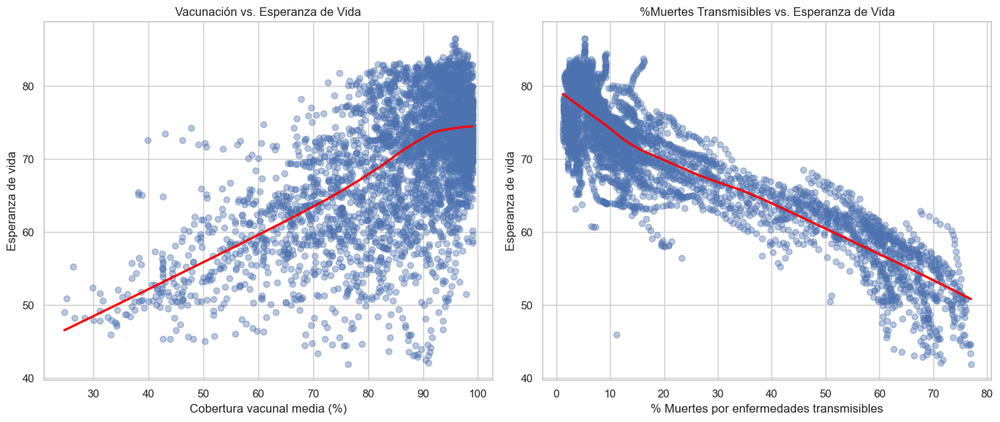

In [577]:
# Identificar filas con NaN en cualquiera de las 3 variables
columnas_clave = ['Life_expectancy', 'Cobertura_vacunal_media', '%Muertes_Transmisibles']
filas_nan = df[df[columnas_clave].isna().any(axis=1)]

# Mostrar resumen de pérdidas
print(f" Se eliminarán {filas_nan.shape[0]} filas por contener NaN en las variables clave.\n")
print(" Países afectados:")
print(filas_nan['Country'].value_counts())

# Eliminar las filas con NaN solo en esas columnas clave
df_clean = df.dropna(subset=columnas_clave)

# Calcular correlaciones de Spearman
rho_vac, p_vac = spearmanr(df_clean['Cobertura_vacunal_media'], df_clean['Life_expectancy'])
rho_mort, p_mort = spearmanr(df_clean['%Muertes_Transmisibles'], df_clean['Life_expectancy'])

print(f"\n📈 Spearman: Vacunación vs. Esperanza de vida → ρ = {rho_vac:.3f} (p = {p_vac:.3g})")
print(f"📉 Spearman: %Muertes Transmisibles vs. Esperanza de vida → ρ = {rho_mort:.3f} (p = {p_mort:.3g})")

# Gráficos
plt.figure(figsize=(14,6))

plt.subplot(1, 2, 1)
sns.regplot(
    data=df_clean,
    x='Cobertura_vacunal_media',
    y='Life_expectancy',
    scatter_kws={'alpha': 0.4},
    line_kws={'color': 'red'},
    lowess=True
)
plt.title("Vacunación vs. Esperanza de Vida")
plt.xlabel("Cobertura vacunal media (%)")
plt.ylabel("Esperanza de vida")

plt.subplot(1, 2, 2)
sns.regplot(
    data=df_clean,
    x='%Muertes_Transmisibles',
    y='Life_expectancy',
    scatter_kws={'alpha': 0.4},
    line_kws={'color': 'red'},
    lowess=True
)
plt.title("%Muertes Transmisibles vs. Esperanza de Vida")
plt.xlabel("% Muertes por enfermedades transmisibles")
plt.ylabel("Esperanza de vida")

plt.tight_layout()
plt.show()

Para evaluar la relación entre el control de enfermedades transmisibles mediante vacunación y los aumentos en esperanza de vida, se analizaron las correlaciones de Spearman entre la cobertura vacunal media, el porcentaje de muertes por enfermedades transmisibles y la esperanza de vida.

Los resultados mostraron una correlación positiva moderada entre la cobertura vacunal y la esperanza de vida (ρ = 0.511, p < 0.001), lo que indica que una mayor vacunación se asocia con una mayor longevidad.
A su vez, se encontró una correlación negativa muy fuerte entre el porcentaje de muertes transmisibles y la esperanza de vida (ρ = -0.834, p < 0.001), mostrando que los países que mejor controlan estas enfermedades alcanzan significativamente mayores niveles de esperanza de vida.

Estos hallazgos confirman que la vacunación no solo reduce la carga de enfermedades infecciosas, sino que contribuye directamente al aumento de la longevidad poblacional, siendo un pilar clave en la salud pública global.